In [1]:
import numpy as np
import os
import datetime as datetime
import pandas as pd


os.system('source /home/jackalak/heartbeat/cdf38_0-dist/bin/definitions.B')
os.environ["CDF_LIB"] = '/home/jackalak/heartbeat/cdf38_0-dist/lib'
from spacepy import pycdf
import matplotlib.pyplot as plt


import numpy as np
import pandas as pd
from datetime import timedelta

from nasaomnireader import omnireader

import ftplib
import os


import numpy as np
import os
import datetime as datetime
import pandas as pd





import pickle
import glob



import tensorflow as tf
from tensorflow import keras


import datetime

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import tensorflow

import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout
from sklearn import preprocessing


from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import datetime
from os.path import isfile, join
from sys import getsizeof
import glob

from random import *

import matplotlib.pyplot as plt
%matplotlib notebook

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from tensorflow.keras.layers import Input

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/nasaomnireader-0.1.0-py3.6.egg/nasaomnireader/__init__.py", line 5, in <module>
    from nasaomnireader.omnireader_config import config
ModuleNotFoundError: No module named 'nasaomnireader.omnireader_config'

Solar wind data files will be saved to /home/jackalak/.local/share/nasaomnireader


In [2]:
import pickle
# FINISH CLEANING UP THE DATA AND CALCULATE THE REST OF THE DERIVED TIME PARAMETERS 
# AND COMBINE THE SOURTHERN HEMISPHERE WITH THE NORTHERN HEMISPHERE
test = pd.DataFrame()

for ii in [17,18,6,7,8,9,12,13,14,15,16,]:

    filescname = "./3_all_sc_df_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 

    test =pd.concat([test,pickle.load(pickle_file)] )
    

test['datetime']=test.index
test=test.sort_values(by=['datetime'])
test = test.set_index('datetime')
test=test.dropna()

df_cumulative = test
del test

# get rid of ones near equatoer
df_cumulative=df_cumulative[np.abs(df_cumulative['SC_AACGM_LAT'])>45]
# swap By for southern hemisphere
df_cumulative.loc[df_cumulative['SC_AACGM_LAT']<0 , 'By'] = -df_cumulative.loc[df_cumulative['SC_AACGM_LAT']<0 , 'By']
# This doesn't work -->> #(df_cumulative[ df_cumulative['SC_AACGM_LAT']<0 ])['By']=-1*(df_cumulative[ df_cumulative['SC_AACGM_LAT']<0 ])['By']
#combine southern with northern hemisphere data
df_cumulative['SC_AACGM_LAT']=np.abs(df_cumulative['SC_AACGM_LAT'])

df_cumulative['cos_SC_AACGM_LTIME']=np.cos(df_cumulative['SC_AACGM_LTIME']*2*3.14159/24)
df_cumulative['sin_SC_AACGM_LTIME']=np.sin(df_cumulative['SC_AACGM_LTIME']*2*3.14159/24)

doy_loop = df_cumulative.index.day
ut_loop = df_cumulative.index.hour*3600 + df_cumulative.index.minute*60 + df_cumulative.index.second
df_cumulative['sin_doy']= np.sin(2*np.pi*doy_loop/365.)
df_cumulative['cos_doy'] = np.cos(2*np.pi*doy_loop/365.)
df_cumulative['sin_ut'] = np.sin(2*np.pi*ut_loop/86400.)
df_cumulative['cos_ut'] = np.cos(2*np.pi*ut_loop/86400.)
                     
del doy_loop,ut_loop


for ii in [17,18,6,7,8,9,12,13,14,15,16,]:

    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickling_on = open(filescname,"wb")
    pickle.dump(df_cumulative.loc[df_cumulative['SC_ID']==ii], pickling_on) #protocol=4)

In [3]:

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
test = pd.DataFrame()

for ii in [17,18,6,7,8,9,12,13,14,15,16,]:

    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 

    test =pd.concat([test,pickle.load(pickle_file)] )
    
# filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
# pickle_file = open(filescname, "rb") 
# test =pickle.load(pickle_file)
print(test.columns.tolist())

['ELE_AVG_ENERGY', 'ELE_AVG_ENERGY_STD', 'ELE_TOTAL_ENERGY_FLUX', 'ELE_TOTAL_ENERGY_FLUX_STD', 'SC_AACGM_LAT', 'SC_AACGM_LON', 'SC_AACGM_LTIME', 'ELE_TOTAL_COUNTS', 'ELE_COUNT_1', 'ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19', 'ELE_diff_1', 'ELE_diff_2', 'ELE_diff_3', 'ELE_diff_4', 'ELE_diff_5', 'ELE_diff_6', 'ELE_diff_7', 'ELE_diff_8', 'ELE_diff_9', 'ELE_diff_10', 'ELE_diff_11', 'ELE_diff_12', 'ELE_diff_13', 'ELE_diff_14', 'ELE_diff_15', 'ELE_diff_16', 'ELE_diff_17', 'ELE_diff_18', 'ELE_diff_19', 'Bz', 'By', 'Vsw', 'Vx', 'Psw', 'AE', 'AL', 'AU', 'SymH', 'Clock Angle', 'newell', 'borovsky', 'Kp', 'F107', 'PC', 'Bx', 'Bz_6hr', 'By_6hr', 'Vsw_6hr', 'Vx_6hr', 'Psw_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'Clock Angle_6hr', 'newell_6hr', 'borovsky_6hr', 

In [6]:

def plot_model_counts(df_results):
    
    plt.figure()
    plt.plot(y_val_log[:])
    plt.plot(df_results[:])
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6)
    plt.plot(10**df_results[:]*1.6e-6)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = np.min(y_val_log.values)
    maxr = np.max(y_val_log.values)
    plt.figure()
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
    plt.title('Errors over SC_AACGM_LAT Bins')


    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/bin_total
    plt.figure()
    plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over SC_AACGM_LAT Bins')
    plt.show()
    
    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(y_val_log.values,errors,s=1)
    plt.title('Errors over target Bins')

    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((y_val_log[j]-0)/((8-0)/200))
        if (i < 200) and(i > 0):
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/(bin_total+.00001)
    plt.figure()
    plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over target Bins')    
    plt.show()

    import matplotlib.colors as mcolors
    gamma = 0.2#[0.8, 0.5, 0.3]
    errors= y_val_log.values-df_results.values[:,0]

    plt.figure();
    plt.hist2d(y_val_log.values, errors,
                  bins=50, norm=mcolors.PowerNorm(gamma))
    plt.colorbar()
    plt.title('Error Density')
    plt.xlabel('log10(y_true)')
    plt.ylabel('log10(y_true-y_pred)')

    plt.show()

In [5]:

def plot_model(df_results):
    
    plt.figure()
    plt.plot(y_val_log[:])
    plt.plot(df_results[:])
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6)
    plt.plot(10**df_results[:]*1.6e-6)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = np.min(y_val_log.values)
    maxr = np.max(y_val_log.values)
    plt.figure()
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
    plt.title('Errors over SC_AACGM_LAT Bins')


    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/bin_total
    plt.figure()
    plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over SC_AACGM_LAT Bins')
    plt.show()
    
    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(y_val_log.values,errors,s=1)
    plt.title('Errors over target Bins')

    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((y_val_log[j]-6)/((14-6)/200))
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/(bin_total+.00001)
    plt.figure()
    plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over target Bins')    
    plt.show()

    import matplotlib.colors as mcolors
    gamma = 0.2#[0.8, 0.5, 0.3]
    errors= y_val_log.values-df_results.values[:,0]

    plt.figure();
    plt.hist2d(y_val_log.values, errors,
                  bins=50, norm=mcolors.PowerNorm(gamma))
    plt.colorbar()
    plt.title('Error Density')
    plt.xlabel('log10(y_true)')
    plt.ylabel('log10(y_true-y_pred)')

    plt.show()

In [8]:

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_ENERGY_FLUX', 'SC_ID', 'sin_ut',
                             'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
                             'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 
                             ]]

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,11.5),'float32')*K.cast(K.less_equal(y_pred,11.5),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,12.),'float32')*K.cast(K.less_equal(y_pred,12.0),'float32') +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.5),'float32')*K.cast(K.less_equal(y_pred,12.5),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.75),'float32')*K.cast(K.less_equal(y_pred,12.75),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,13.),'float32')*K.cast(K.less_equal(y_pred,13.),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

['SC_AACGM_LAT', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'AE', 'AL', 'AU', 'SymH', 'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr']


Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 33)]              0         
_________________________________________________________________
dense (Dense)                (None, 256)               8704      
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                16448     
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 256)               8448      
_________________________________________________________________
dense_4 (Dense)              (None, 1024)             

Epoch 70/4000
188/188 - 6s - loss: 0.8808 - mse: 0.6124 - val_loss: 0.8862 - val_mse: 0.7317
Epoch 71/4000
188/188 - 6s - loss: 0.8793 - mse: 0.6111 - val_loss: 0.8803 - val_mse: 0.6998
Epoch 72/4000
188/188 - 6s - loss: 0.8804 - mse: 0.6120 - val_loss: 0.8816 - val_mse: 0.7096
Epoch 73/4000
188/188 - 6s - loss: 0.8796 - mse: 0.6117 - val_loss: 0.8878 - val_mse: 0.7224
Epoch 74/4000
188/188 - 6s - loss: 0.8811 - mse: 0.6126 - val_loss: 0.8827 - val_mse: 0.7321
Epoch 75/4000
188/188 - 6s - loss: 0.8788 - mse: 0.6115 - val_loss: 0.8811 - val_mse: 0.7038
Epoch 76/4000
188/188 - 6s - loss: 0.8770 - mse: 0.6099 - val_loss: 0.8925 - val_mse: 0.7003
Epoch 77/4000
188/188 - 6s - loss: 0.8768 - mse: 0.6105 - val_loss: 0.8870 - val_mse: 0.7345
Epoch 78/4000
188/188 - 4s - loss: 0.8790 - mse: 0.6113 - val_loss: 0.8877 - val_mse: 0.6941
Epoch 79/4000
188/188 - 4s - loss: 0.8761 - mse: 0.6095 - val_loss: 0.8837 - val_mse: 0.7080
Epoch 80/4000
188/188 - 4s - loss: 0.8783 - mse: 0.6114 - val_loss: 0.

Epoch 158/4000
188/188 - 3s - loss: 0.8592 - mse: 0.6043 - val_loss: 0.8760 - val_mse: 0.7380
Epoch 159/4000
188/188 - 3s - loss: 0.8577 - mse: 0.6045 - val_loss: 0.8803 - val_mse: 0.7233
Epoch 160/4000
188/188 - 3s - loss: 0.8561 - mse: 0.6031 - val_loss: 0.8774 - val_mse: 0.7318
Epoch 161/4000
188/188 - 3s - loss: 0.8583 - mse: 0.6043 - val_loss: 0.8725 - val_mse: 0.7117
Epoch 162/4000
188/188 - 3s - loss: 0.8573 - mse: 0.6037 - val_loss: 0.8732 - val_mse: 0.7212
Epoch 163/4000
188/188 - 3s - loss: 0.8580 - mse: 0.6040 - val_loss: 0.8733 - val_mse: 0.7372
Epoch 164/4000
188/188 - 3s - loss: 0.8552 - mse: 0.6027 - val_loss: 0.8827 - val_mse: 0.7101
Epoch 165/4000
188/188 - 4s - loss: 0.8576 - mse: 0.6035 - val_loss: 0.8967 - val_mse: 0.7759
Epoch 166/4000
188/188 - 4s - loss: 0.8582 - mse: 0.6042 - val_loss: 0.8735 - val_mse: 0.7349
Epoch 167/4000
188/188 - 3s - loss: 0.8559 - mse: 0.6029 - val_loss: 0.8768 - val_mse: 0.7320
Epoch 168/4000
188/188 - 3s - loss: 0.8585 - mse: 0.6041 - v

<IPython.core.display.Javascript object>


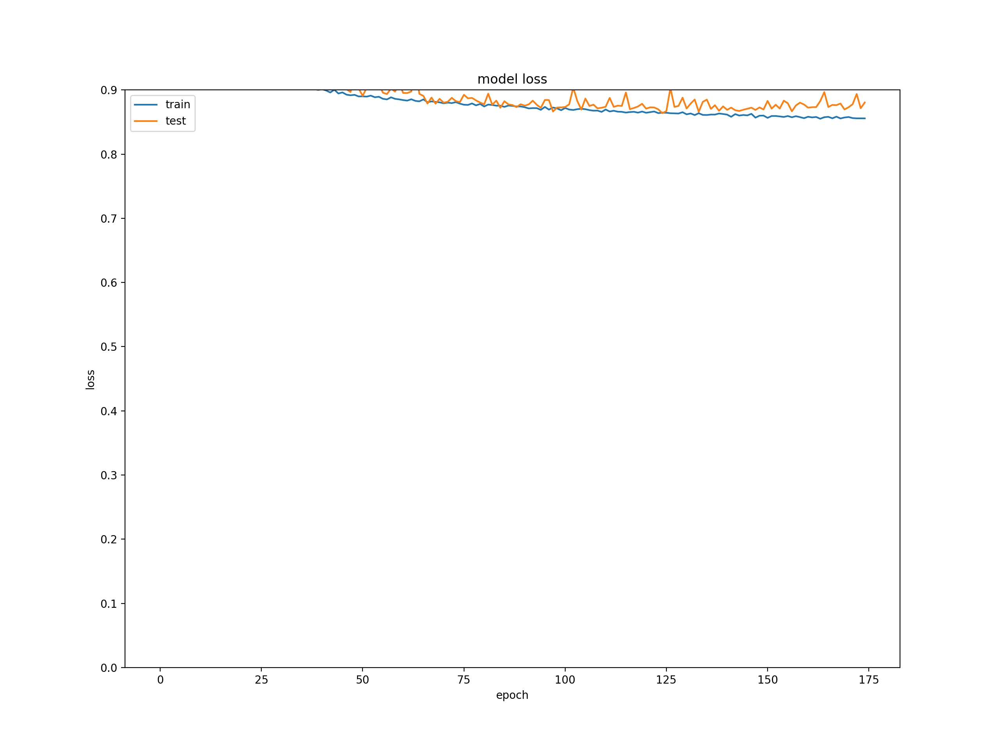

<IPython.core.display.Javascript object>


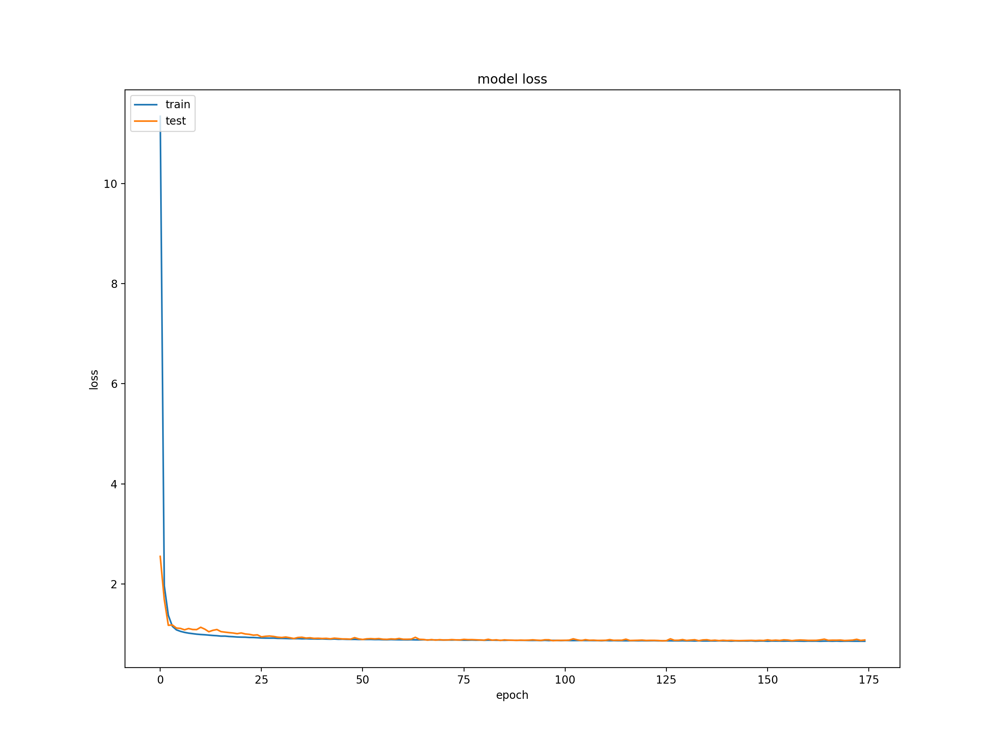

In [9]:


num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: tail_loss_new_pipeline_33/assets
5357/5357 [==============================] - 6s 1ms/step - loss: 0.8625 - mean_squared_error: 0.7075
[0.8625203967094421, 0.7074905037879944]


<IPython.core.display.Javascript object>


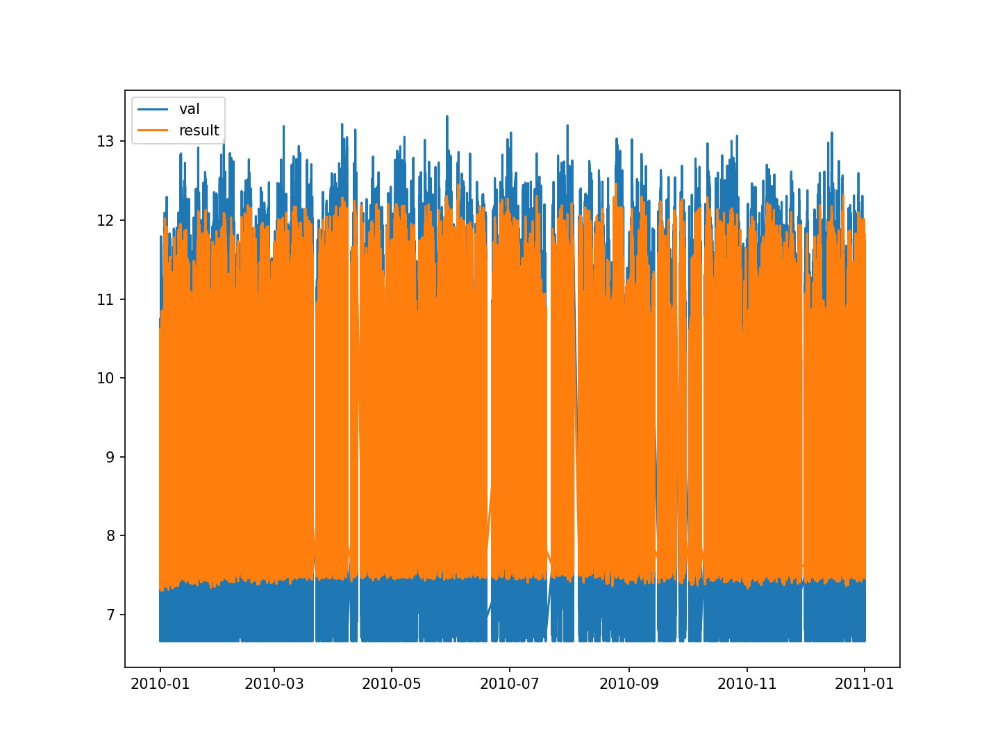

<IPython.core.display.Javascript object>


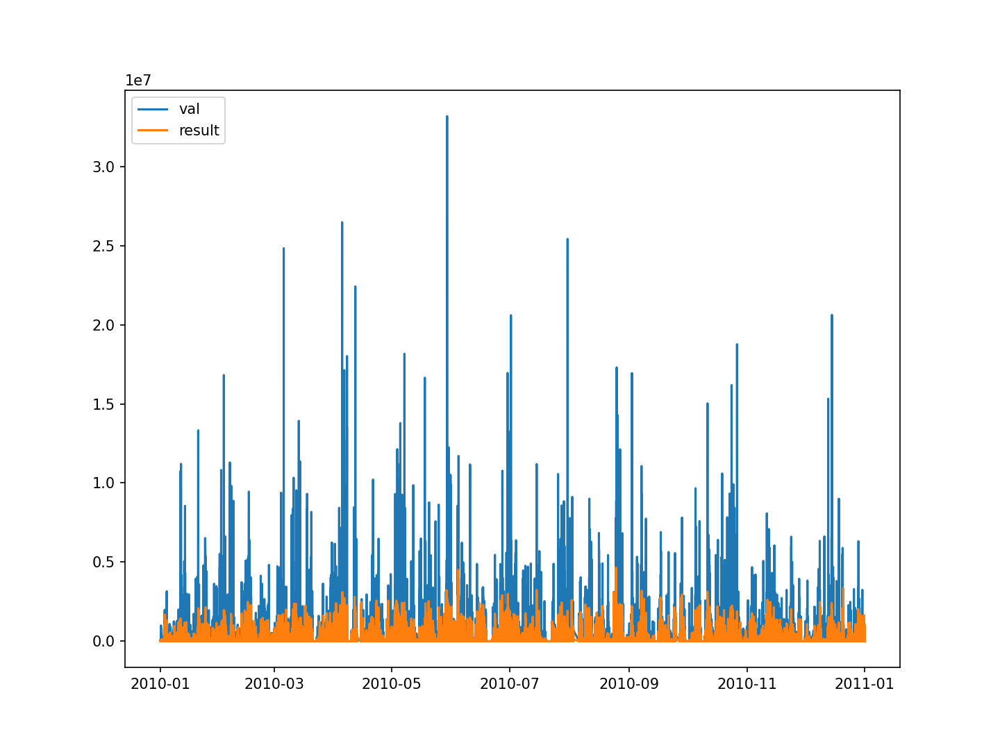

<IPython.core.display.Javascript object>


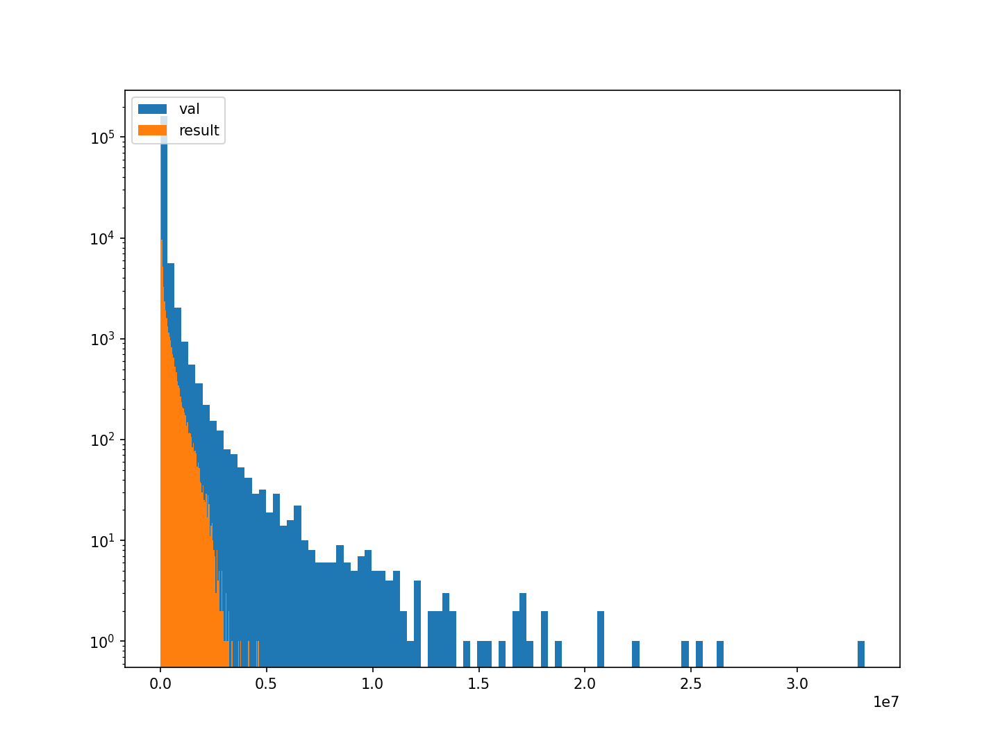

<IPython.core.display.Javascript object>


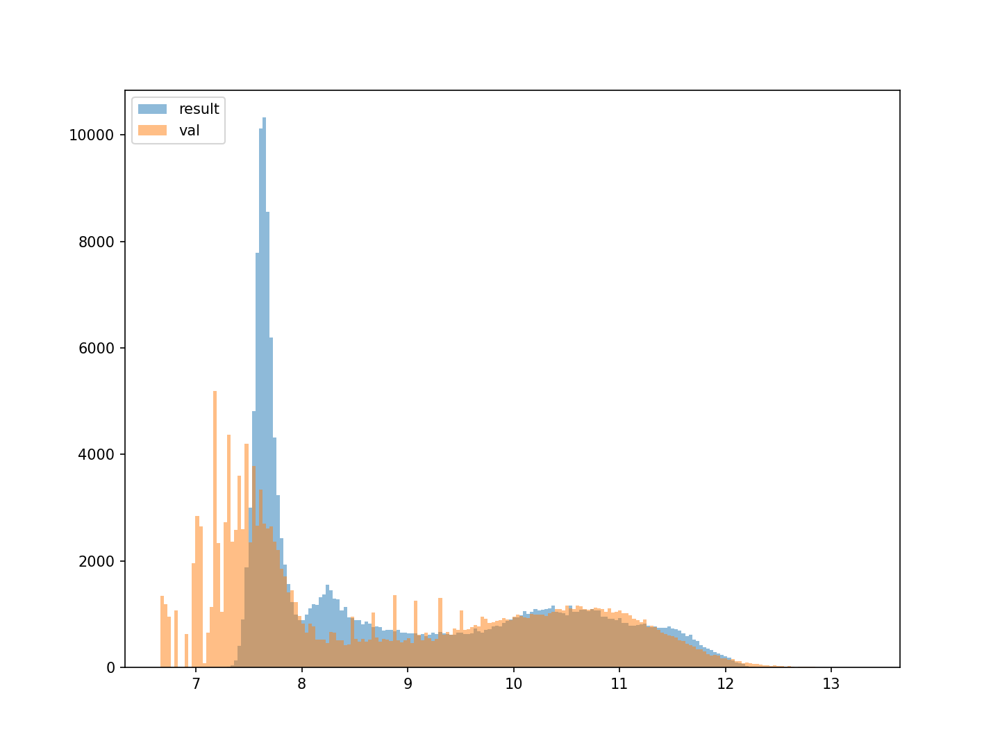

<IPython.core.display.Javascript object>


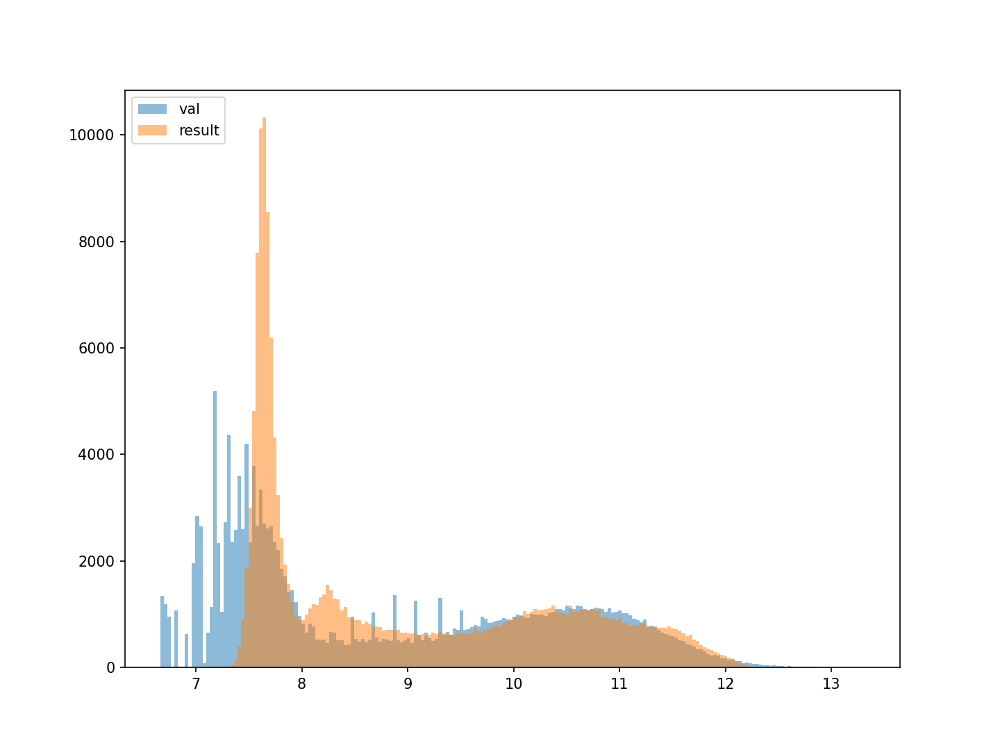

<IPython.core.display.Javascript object>


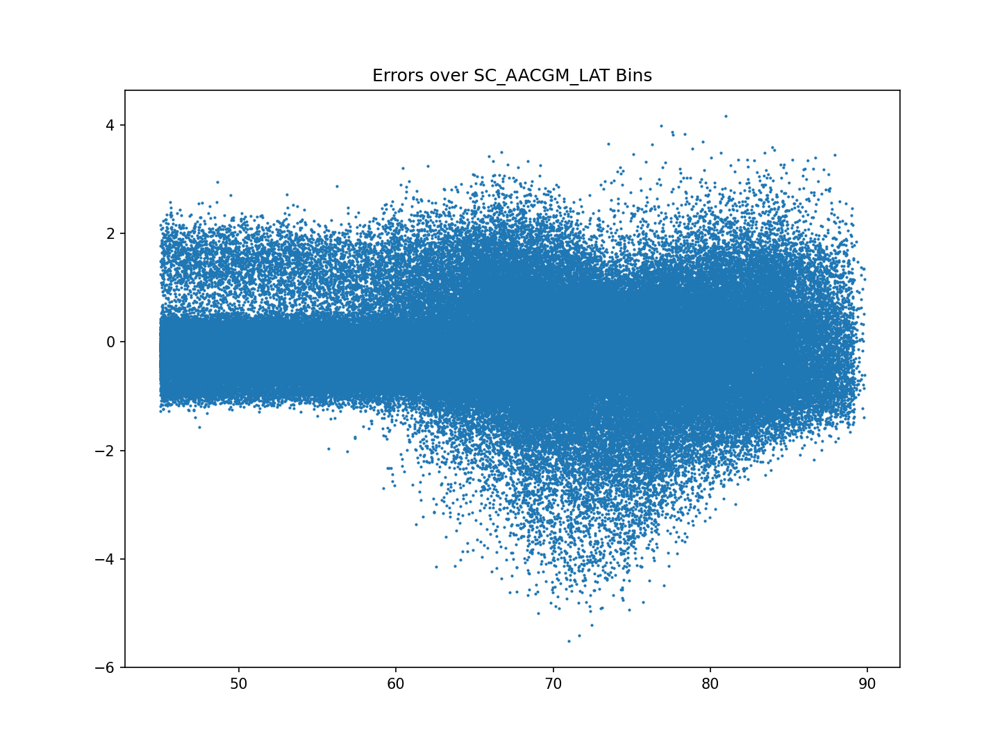

<IPython.core.display.Javascript object>


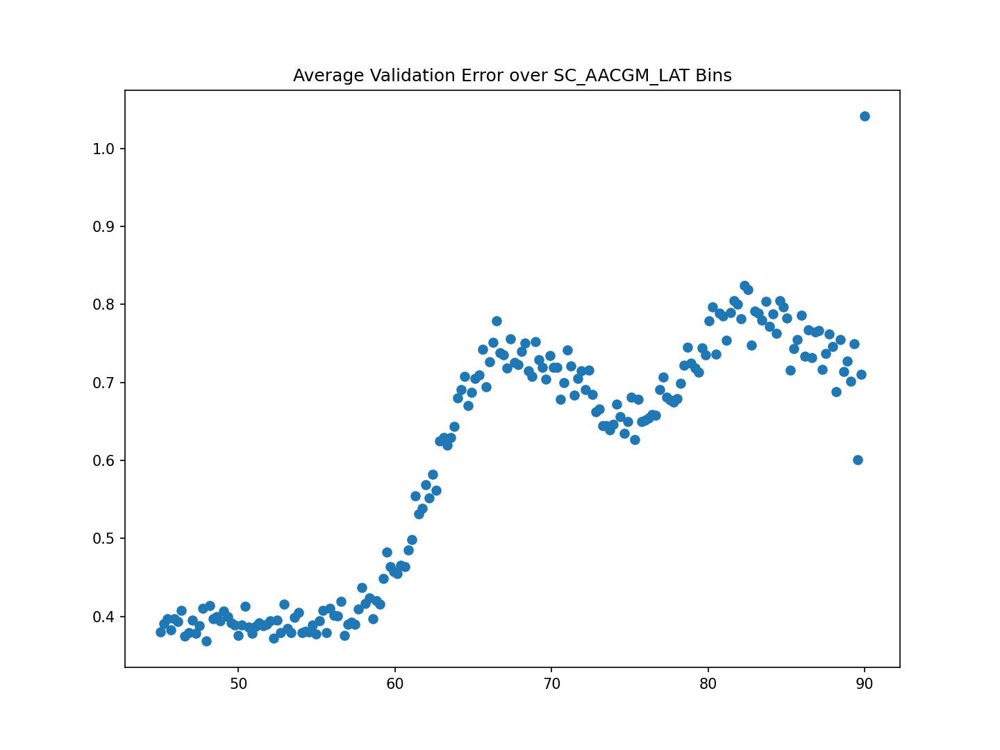

<IPython.core.display.Javascript object>


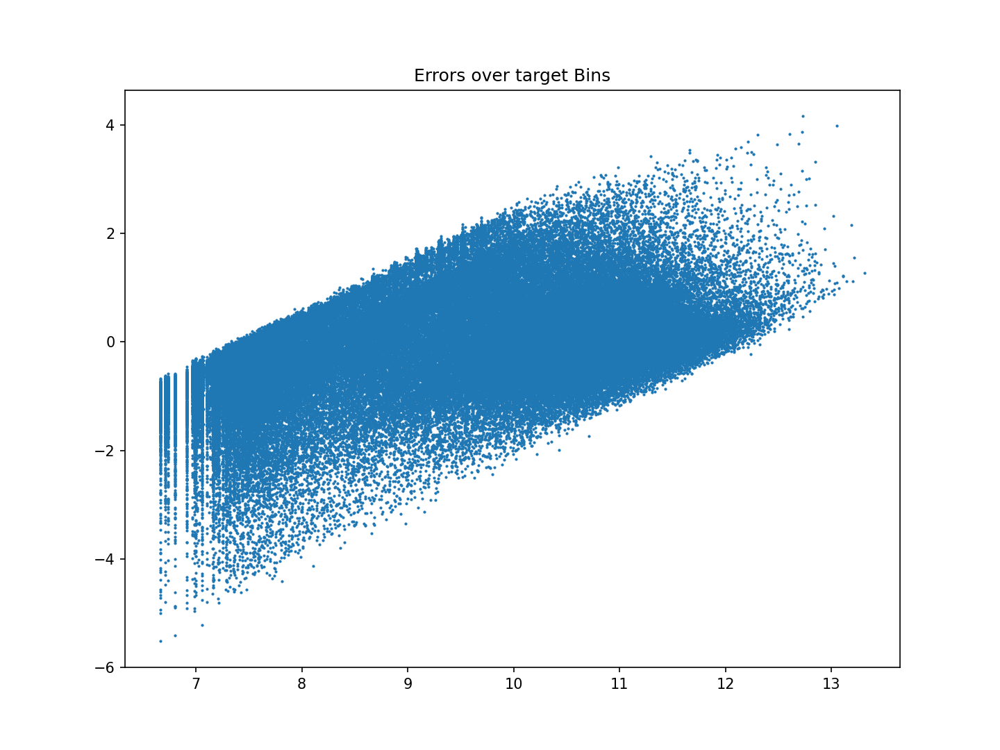

<IPython.core.display.Javascript object>


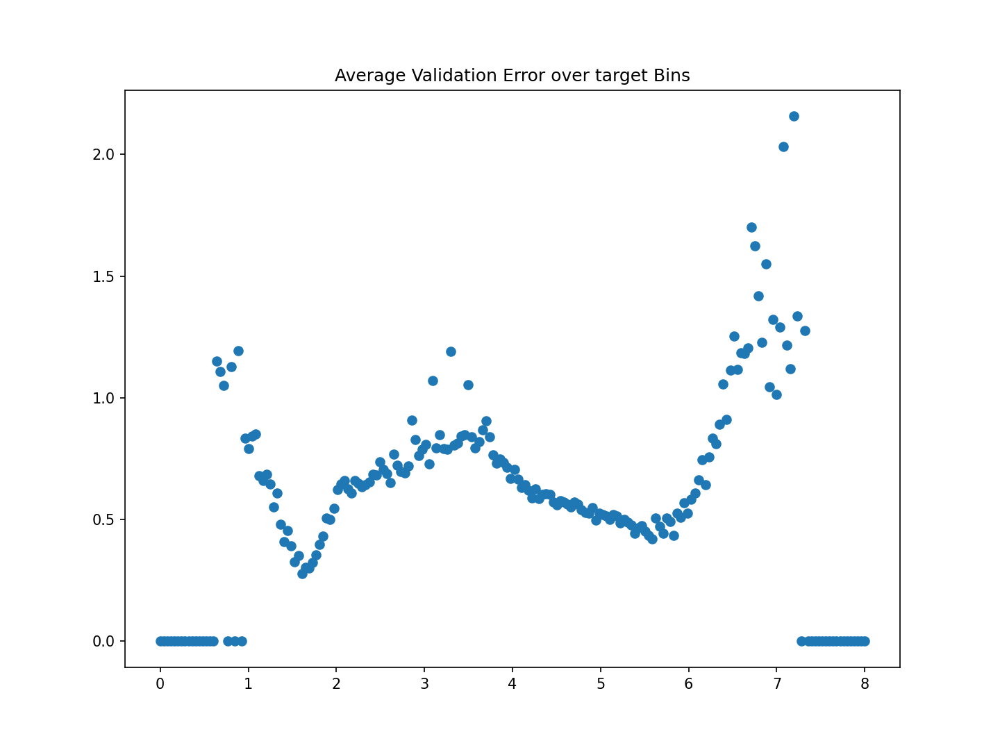

<IPython.core.display.Javascript object>


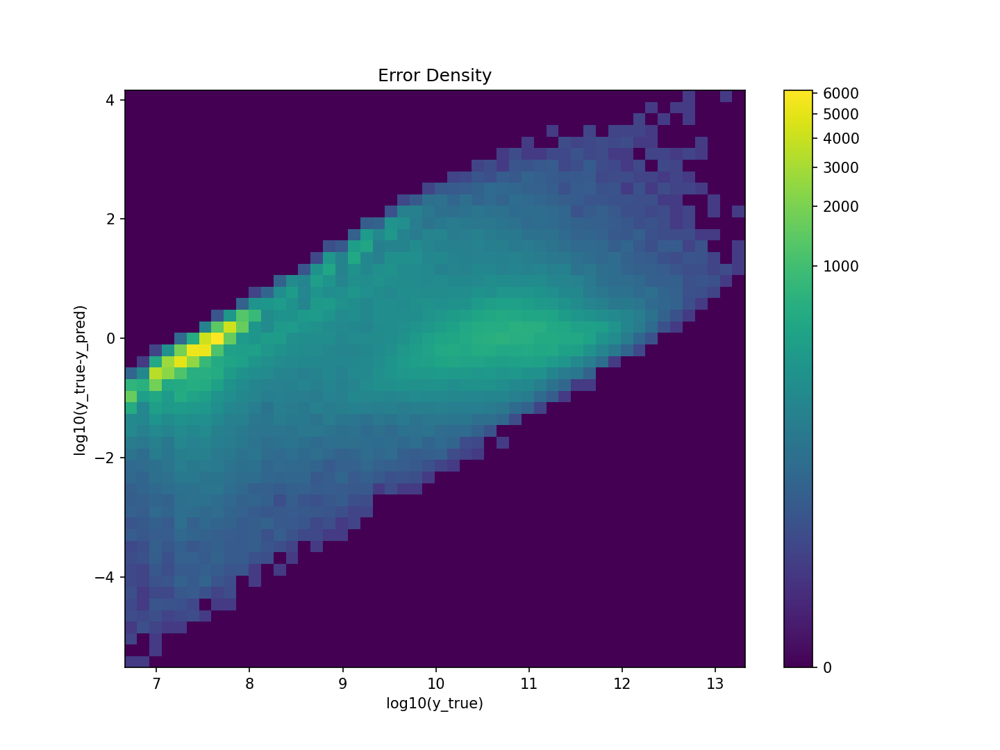

In [8]:
filename='tail_loss_new_pipeline_33'
model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

with open ('scalar_X_33_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

tail_loss_new_pipeline2_reduced = df_results

plot_model(df_results)



In [2]:


# import pickle

# years = {6:[1987], 7:[1987],8:[1987],9:[1988]
#          ,12:[2000,2001,2002], 13:[2000,2001,2002,2003,2004,2005,2006,2007],14:[2000,2001,2002,2003,2004,2005],
#          15:[2000,2001,2002,2003,2004,2005,2006,2007,2008,2009],
#          16:[2010,2011,2012,2013,2014], #year 2003-2009 is not accessible on site
#          17:[2009,2010,2011,2012,2013,2014],
#          18:[2010,2011,2012,2013,2014],#2009 not accessible
#         } 


# dmsp_feature_list = ['ELE_AVG_ENERGY','ELE_AVG_ENERGY_STD','ELE_TOTAL_ENERGY_FLUX','ELE_TOTAL_ENERGY_FLUX_STD',
#                      'SC_AACGM_LAT',  'SC_AACGM_LON','SC_AACGM_LTIME',] 
# #                     'ION_AVG_ENERGY','ION_AVG_ENERGY_STD','ION_TOTAL_ENERGY_FLUX','ION_TOTAL_ENERGY_FLUX_STD','SC_GEOCENTRIC_LAT','SC_GEOCENTRIC_LON','SC_GEOCENTRIC_R']
# dmsp_feature_list_19 =['ELE_COUNTS_BKG','ELE_COUNTS_OBS','ELE_DIFF_ENERGY_FLUX','ELE_DIFF_ENERGY_FLUX_STD',
#                   'CHANNEL_ENERGIES','ELE_COUNTS_BKG','ELE_COUNTS_OBS',]
# #                  'ELE_GEOMETRIC','ION_COUNTS_BKG','ION_COUNTS_OBS','ION_DIFF_ENERGY_FLUX','ION_DIFF_ENERGY_FLUX_STD','ION_GEOMETRIC',
# #                  'SC_ECI','SC_ECI_LABEL']
                 
# import glob
# all_sc_df = pd.DataFrame()
# count = 0
# for ii in [14,15,16,17,18,6,7,8,9,12,13,]:
#     sc_df = pd.DataFrame()
#     print(ii)
#     directory = '/home/jackalak/Desktop/pub/data/dmsp/dmspf'
#     if ii <10:
#         directory = directory + '0'
#     directory = directory + str(ii) + '/ssj/precipitating-electrons-ions'
#     for year in years[ii]:
#         print(year)
#         file_list=glob.glob(directory + '/'+str(year)+'/*')
#         for file in file_list:

#             try:
                
#                 count = count+1
#                 month = int(file[-15:-13])
#                 day = int(file[-13:-11])
#                 base = datetime.datetime(year, month, day)
#                 indices = np.array([base + datetime.timedelta(minutes=iii) for iii in range(0,60*24)])
#                 df = pd.DataFrame(data=indices,columns=['index'])
#                 cdf = pycdf.CDF(file)
#                 count = count+1
#                 for feature in dmsp_feature_list:
#                     df[feature] = cdf[feature][0:60*60*24:60]
                    
#                 ch_energies = cdf['CHANNEL_ENERGIES']
#                 ch_energies = np.flip((ch_energies[:]))
#                 temp_jN = np.zeros((24*60,19))
#                 for kk in range(0,19):
#                     temp_jN[:,kk] =( cdf['ELE_COUNTS_OBS'][0:60*60*24:60,kk]- cdf['ELE_COUNTS_BKG'][0:60*60*24:60,kk]
#                          )/          cdf['ELE_GEOMETRIC'][kk]
#                 print(temp_jN.shape)
#                 df['ELE_TOTAL_COUNTS'] = temp_jN[:,0]*(ch_energies[1]-ch_energies[0])
#                 + temp_jN[:,18]*(ch_energies[18]-ch_energies[17])
#                 for i in range(1,18):
#                     df['ELE_TOTAL_COUNTS'] = df['ELE_TOTAL_COUNTS']  +     temp_jN[:,i]*(ch_energies[i+1]-ch_energies[i-1])/2.
                
#                 for i in range(1,19):
#                     name = 'ELE_COUNT_'+str(i+1)
#                     df[name]=temp_jN[:,i]
#                 for i in range(1,19):
#                     name = 'ELE_diff_'+str(i+1)
#                     df[name]=cdf['ELE_DIFF_ENERGY_FLUX'][0:60*60*24:60,i]
                
#                 df = df.set_index('index')
#                 df.index = pd.to_datetime(df.index)
                
#                 #print('df',df.shape)#, df)
#                 #Create a time window
#                 df = df[df['ELE_TOTAL_ENERGY_FLUX'] > 0].dropna(subset=['ELE_TOTAL_ENERGY_FLUX'])
               
#                 sc_df = pd.concat([sc_df,df])
# #                 #print('sc_df',sc_df.shape)#, sc_df)
#             except Exception as e: 
#                 print('Error')
#                 print(e)
#                 print(file)

       
        

#         sc_df['SC_ID']= ii
    
#     filescname = "./dmsp_only_sc_df_GFi_" + str(ii) + ".pkl"
#     pickling_on = open(filescname,"wb")
#     pickle.dump(sc_df, pickling_on,protocol=4)

#     all_sc_df = pd.concat([all_sc_df,sc_df])   
#     #print(i, 'all_sc_df',all_sc_df.shape, all_sc_df)

# print(count)
# all_sc_df    

14
2000
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
2001
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 1

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
2005
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
2004
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
2006
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf16/ssj/precipitating-electrons-ions/2011/SHA1SUM
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)


(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
2014
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
2010
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf17/ssj/precipitating-electrons-ions/2010/SHA1SUM
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440,

Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf17/ssj/precipitating-electrons-ions/2012/SHA1SUM
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)


(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
2003
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
2005
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440

(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
2007
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440, 19)
(1440

,ELE_AVG_ENERGY,ELE_AVG_ENERGY_STD,ELE_TOTAL_ENERGY_FLUX,ELE_TOTAL_ENERGY_FLUX_STD,SC_AACGM_LAT,SC_AACGM_LON,SC_AACGM_LTIME,ELE_TOTAL_COUNTS,ELE_COUNT_2,ELE_COUNT_3,...,ELE_diff_11,ELE_diff_12,ELE_diff_13,ELE_diff_14,ELE_diff_15,ELE_diff_16,ELE_diff_17,ELE_diff_18,ELE_diff_19,SC_ID
index,,,,,,,,,,,,,,,,,,,,,
2000-12-28 00:01:00,72.344139,0.310994,9.029036e+08,0.218289,-39.430193,198.559184,8.107699,1.317380e+09,0.0,0.0,...,227479.0,908120.56250,1.110599e+06,1090566.375,7.854434e+05,1332927.125,2610055.750,5551117.50,15231300.00,14
2000-12-28 00:02:00,66.581474,0.350761,8.293084e+08,0.266575,-42.780846,197.666897,8.065301,2.030242e+09,0.0,0.0,...,454958.0,454060.28125,6.663592e+05,0.000,2.356330e+06,1666158.875,0.000,10485444.00,13055399.00,14
2000-12-28 00:03:00,88.315414,0.318361,1.031112e+09,0.224906,-46.198616,196.648838,8.014518,1.068020e+09,0.0,0.0,...,682437.0,681090.37500,1.554838e+06,872453.125,7.854434e+05,1666158.875,2175046.500,4317535.50,14143349.00,14
2000-12-28 00:04:00,109.932526,0.412207,1.316415e+09,0.338605,-49.653814,195.473519,7.953252,1.082748e+09,0.0,0.0,...,0.0,0.00000,0.000000e+00,1090566.375,1.047258e+06,1999390.625,870018.625,4934326.50,16319250.00,14
2000-12-28 00:05:00,62.130581,0.446399,6.911104e+08,0.347931,-53.126295,194.105598,7.879145,6.469754e+08,0.0,0.0,...,682437.0,454060.28125,0.000000e+00,0.000,1.047258e+06,1666158.875,1305027.875,2467163.25,17407200.00,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2007-04-07 23:45:00,95.000000,2.465765,2.143751e+07,1.743559,-63.586162,21.606159,20.414064,2.268777e+07,0.0,0.0,...,0.0,0.00000,0.000000e+00,0.000,0.000000e+00,579392.000,0.000,0.00,0.00,13
2007-04-07 23:49:00,45.386181,0.711705,1.185059e+08,0.464275,-52.263747,9.879977,19.697402,2.283319e+08,0.0,0.0,...,0.0,0.00000,0.000000e+00,0.000,4.562738e+05,579392.000,0.000,1078714.75,3808857.25,13
2007-04-07 23:50:00,44.000000,2.465766,1.887751e+07,1.743560,-49.341407,7.793330,19.575217,1.973557e+08,0.0,0.0,...,0.0,0.00000,0.000000e+00,0.000,0.000000e+00,0.000,0.000,1078714.75,0.00,13


In [ ]:
#### NOW REPEATING FOR ELE_TOTAL_COUNTS INSTEAD OF TOTAL FLUX

In [9]:

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_COUNTS', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
 'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', ]]


# #### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 3])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

# y_train[y_train == 0] = 0.0001
# y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,6.25),'float32')*K.cast(K.less_equal(y_pred,6.25),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,6.75),'float32')*K.cast(K.less_equal(y_pred,6.75),'float32') +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,7),'float32')*K.cast(K.less_equal(y_pred,7),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,7.25),'float32')*K.cast(K.less_equal(y_pred,7.25),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,7.5),'float32')*K.cast(K.less_equal(y_pred,7.5),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

['SC_AACGM_LAT', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'AE', 'AL', 'AU', 'SymH', 'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr']


Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 33)]              0         
_________________________________________________________________
dense_9 (Dense)              (None, 256)               8704      
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_11 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_12 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_13 (Dense)             (None, 1024)             

<IPython.core.display.Javascript object>


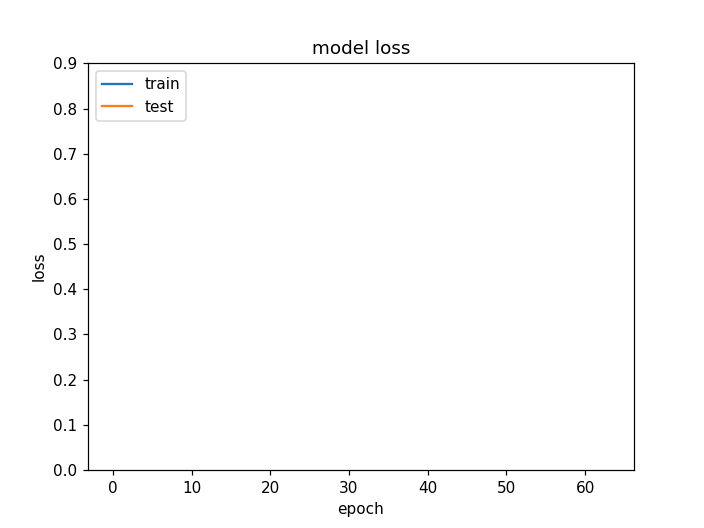

<IPython.core.display.Javascript object>


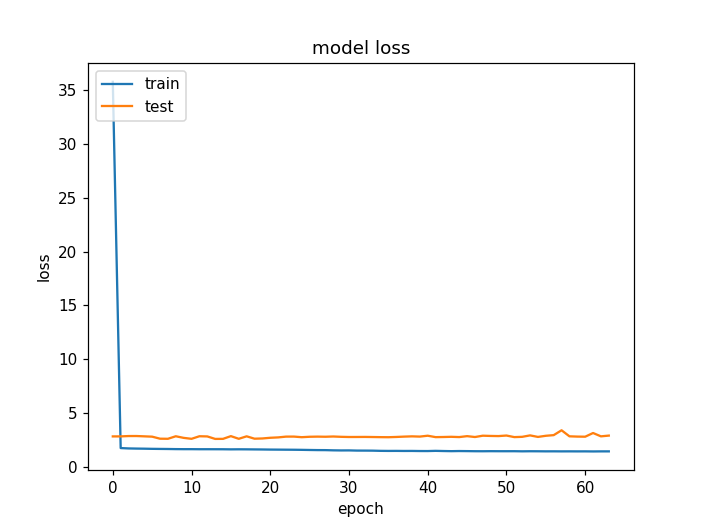

In [10]:



num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


INFO:tensorflow:Assets written to: counts_tail_loss_new_pipeline_33/assets
3735/3735 [==============================] - 5s 1ms/step - loss: 2.5958 - mean_squared_error: 2.3765
[2.595839500427246, 2.3765177726745605]


<IPython.core.display.Javascript object>


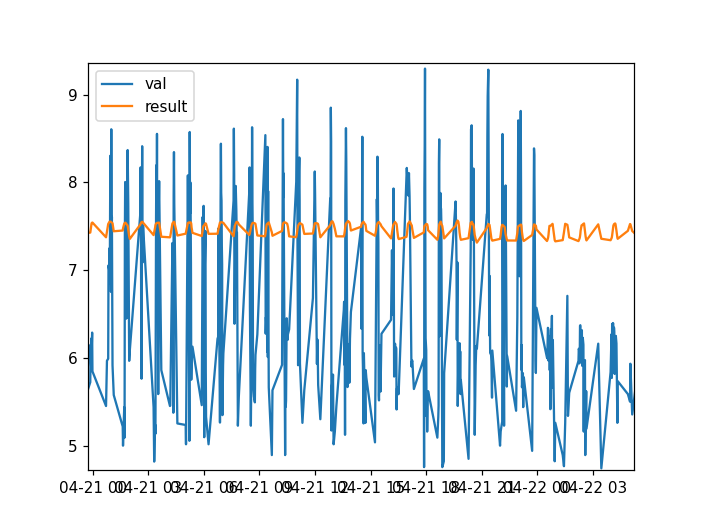

<IPython.core.display.Javascript object>


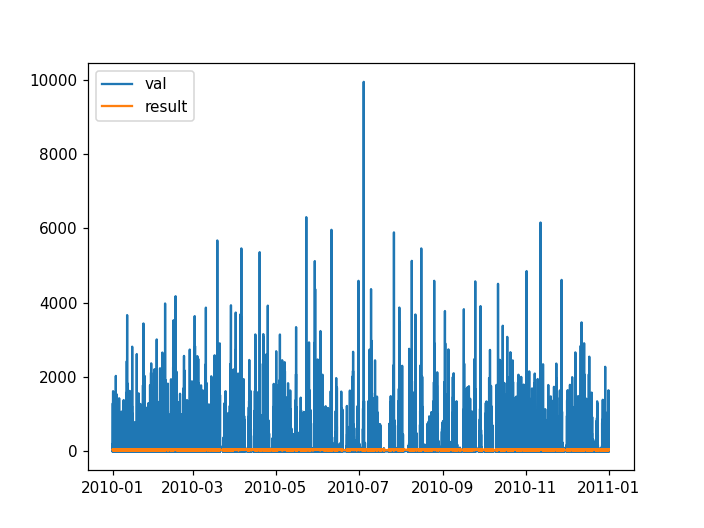

<IPython.core.display.Javascript object>


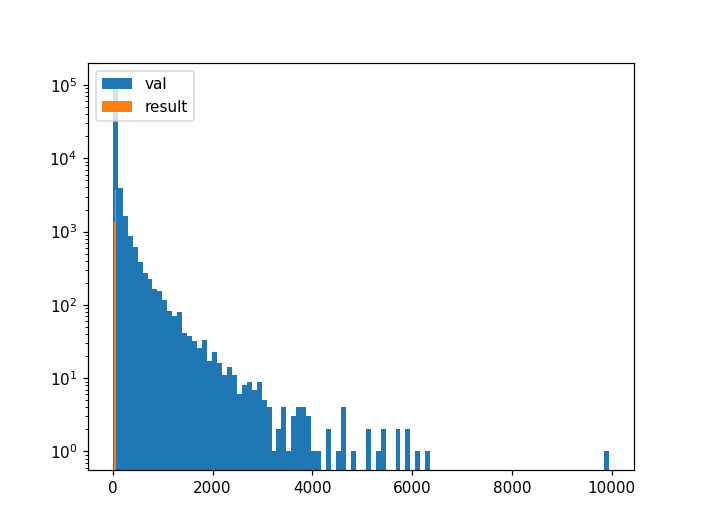

<IPython.core.display.Javascript object>


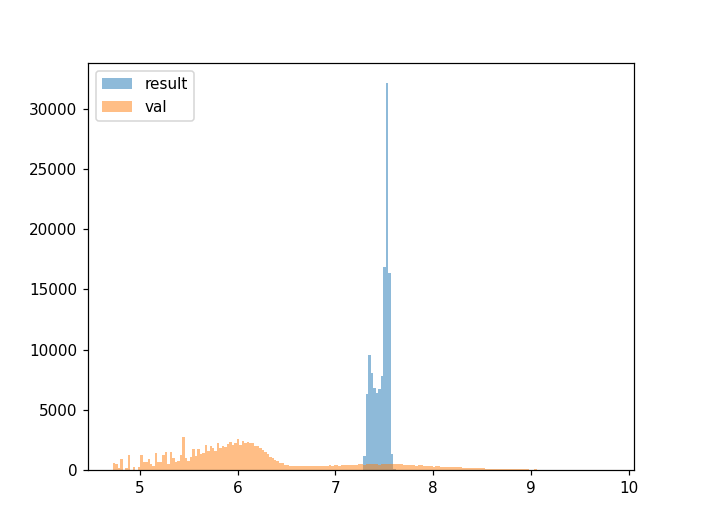

<IPython.core.display.Javascript object>


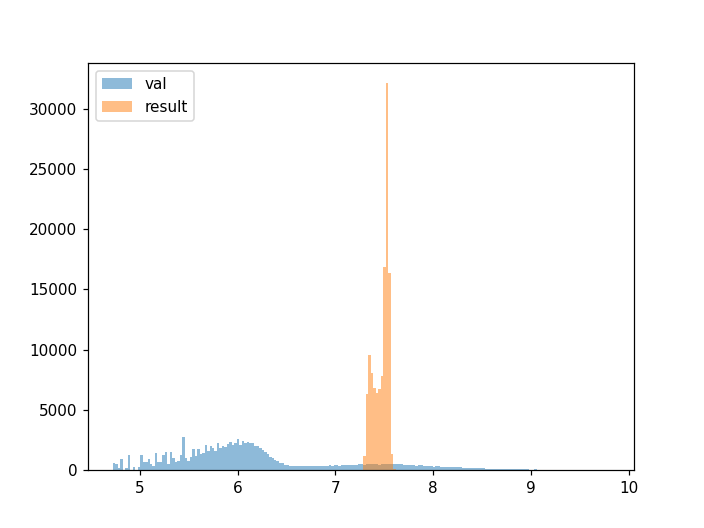

<IPython.core.display.Javascript object>


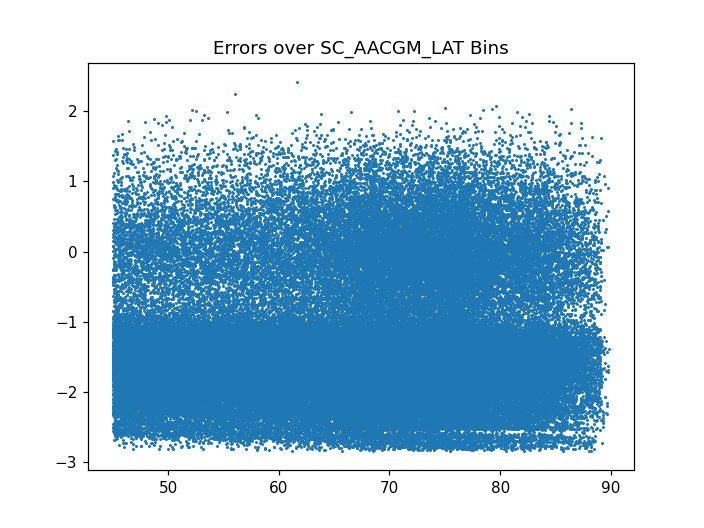

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


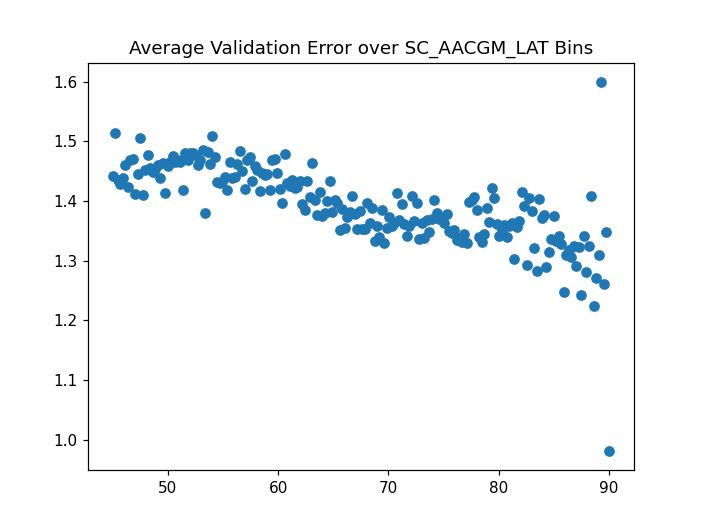

<IPython.core.display.Javascript object>


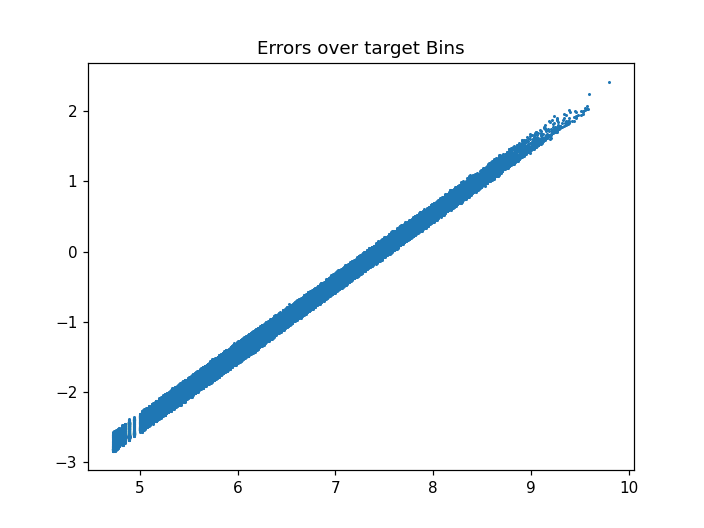

<IPython.core.display.Javascript object>


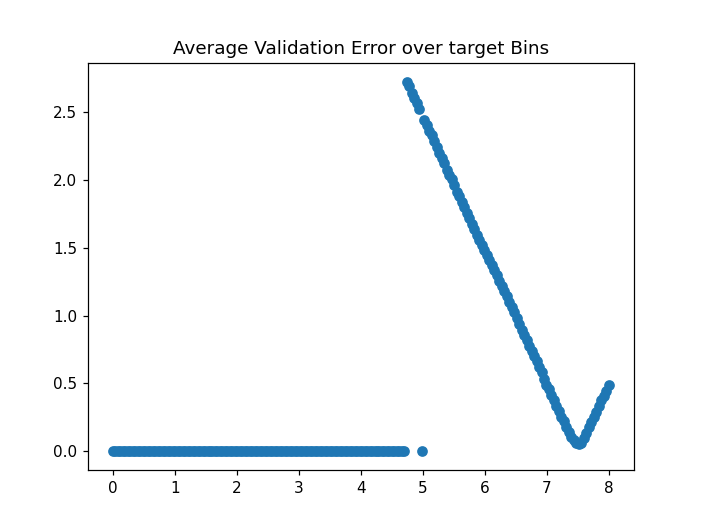

<IPython.core.display.Javascript object>


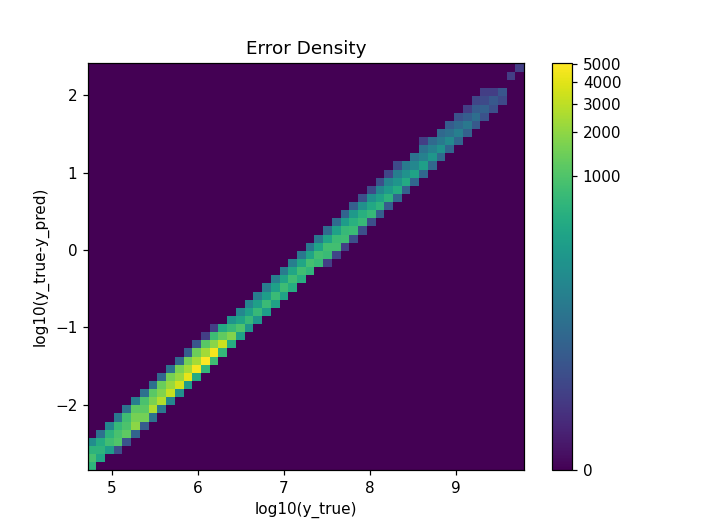

In [11]:
filename='counts_tail_loss_new_pipeline_33'
model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

with open ('scalar_X_33_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)


In [3]:


# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_COUNTS', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
 'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', ]]


# #### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 3])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

# y_train[y_train == 0] = 0.0001
# y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


['SC_AACGM_LAT', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'AE', 'AL', 'AU', 'SymH', 'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr']
Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 33)]              0         
_________________________________________________________________
dense (Dense)                (None, 256)               8704      
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                16448     
______________________

Epoch 66/4000
147/147 - 3s - loss: 0.4546 - mse: 0.4546 - val_loss: 0.7834 - val_mse: 0.7834
Epoch 67/4000
147/147 - 3s - loss: 0.4543 - mse: 0.4543 - val_loss: 0.7780 - val_mse: 0.7780
Epoch 68/4000
147/147 - 3s - loss: 0.4540 - mse: 0.4540 - val_loss: 0.7936 - val_mse: 0.7936
Epoch 69/4000
147/147 - 3s - loss: 0.4540 - mse: 0.4540 - val_loss: 0.7824 - val_mse: 0.7824
Epoch 70/4000
147/147 - 3s - loss: 0.4549 - mse: 0.4549 - val_loss: 0.7760 - val_mse: 0.7760
Epoch 71/4000
147/147 - 3s - loss: 0.4534 - mse: 0.4534 - val_loss: 0.7774 - val_mse: 0.7774
Epoch 72/4000
147/147 - 3s - loss: 0.4538 - mse: 0.4538 - val_loss: 0.7831 - val_mse: 0.7831
Epoch 73/4000
147/147 - 3s - loss: 0.4530 - mse: 0.4530 - val_loss: 0.7817 - val_mse: 0.7817
Epoch 74/4000
147/147 - 3s - loss: 0.4532 - mse: 0.4532 - val_loss: 0.7806 - val_mse: 0.7806
Epoch 75/4000
147/147 - 3s - loss: 0.4530 - mse: 0.4530 - val_loss: 0.7760 - val_mse: 0.7760
Epoch 76/4000
147/147 - 3s - loss: 0.4529 - mse: 0.4529 - val_loss: 0.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [8]:
filename='counts_tail_loss_new_pipeline_33'
model.save(filename)
model = tensorflow.keras.models.load_model(filename)

with open ('scalar_X_33_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

INFO:tensorflow:Assets written to: counts_tail_loss_new_pipeline_33/assets
3735/3735 [==============================] - 4s 954us/step - loss: 0.7723 - mean_squared_error: 0.7723
[0.772321879863739, 0.772321879863739]


<IPython.core.display.Javascript object>


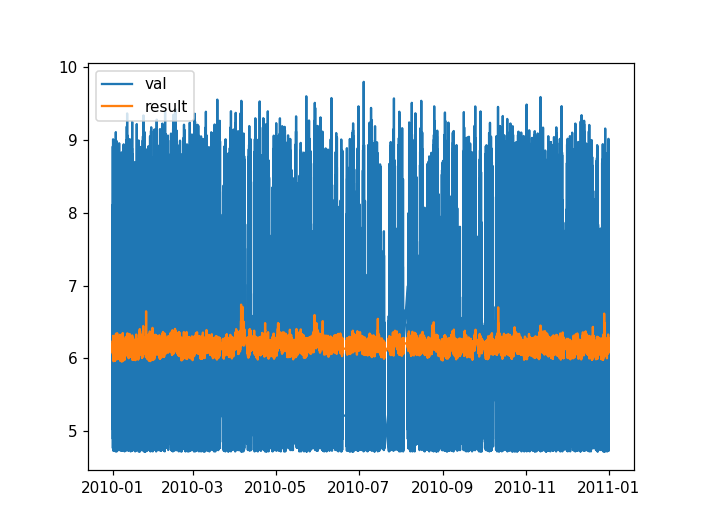

<IPython.core.display.Javascript object>


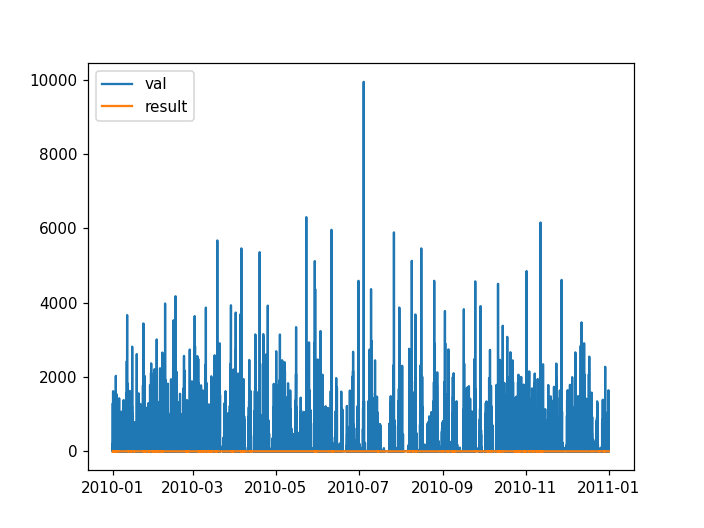

<IPython.core.display.Javascript object>


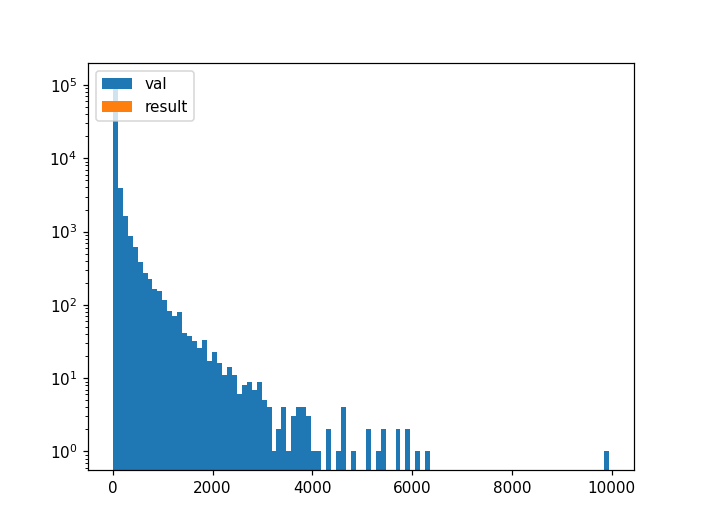

<IPython.core.display.Javascript object>


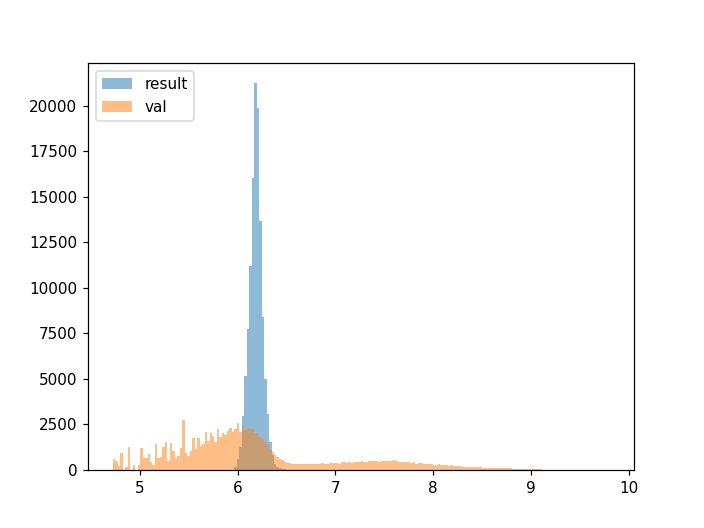

<IPython.core.display.Javascript object>


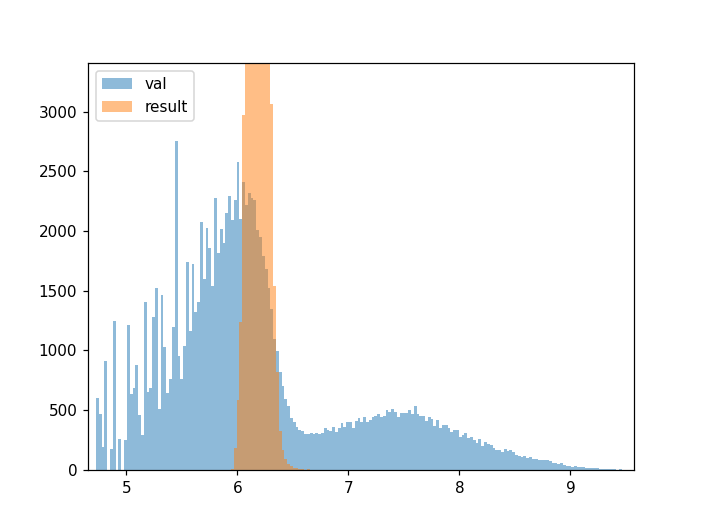

<IPython.core.display.Javascript object>


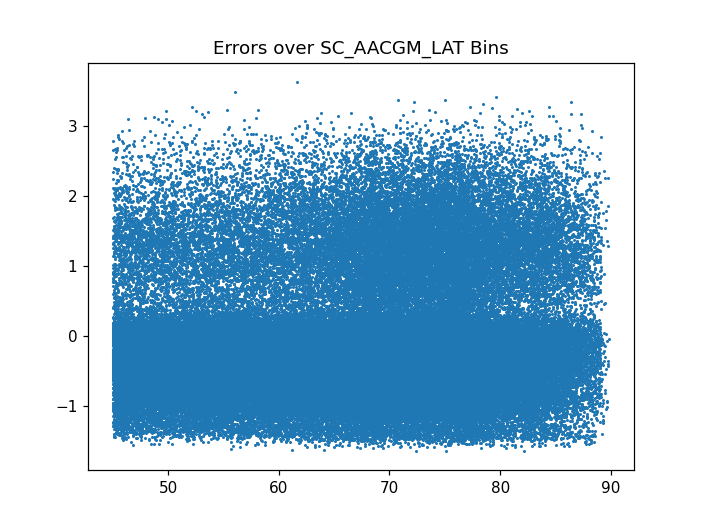

<IPython.core.display.Javascript object>


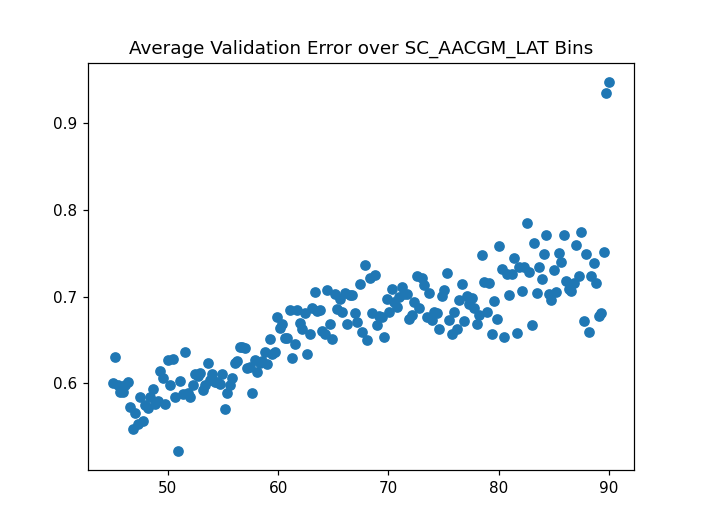

<IPython.core.display.Javascript object>


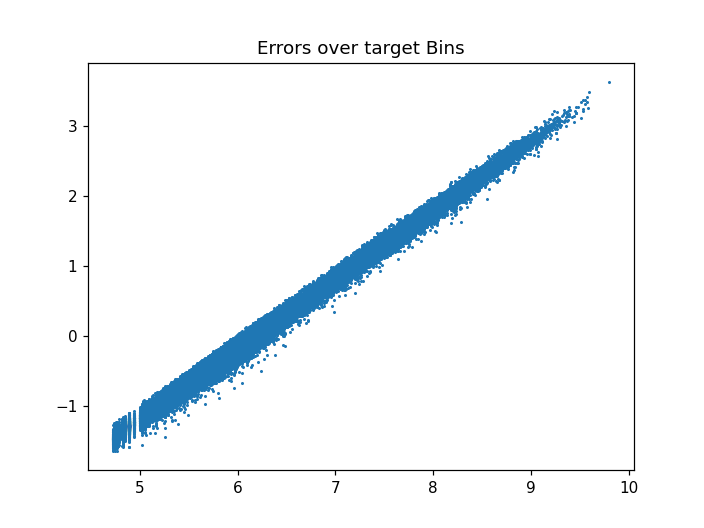

<IPython.core.display.Javascript object>


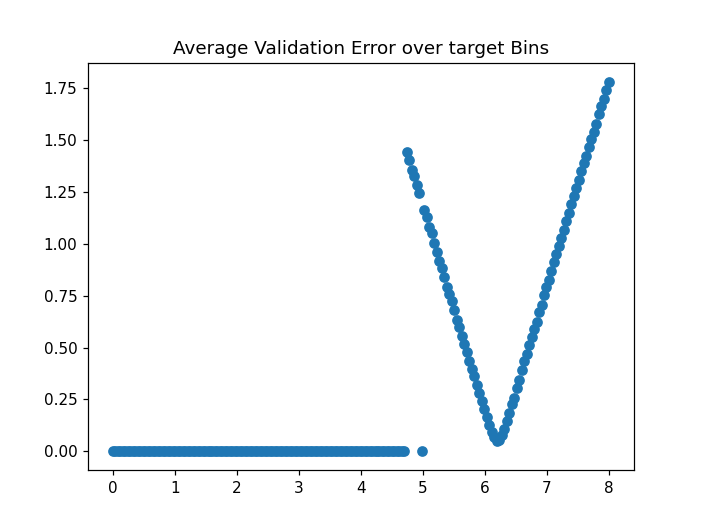

<IPython.core.display.Javascript object>


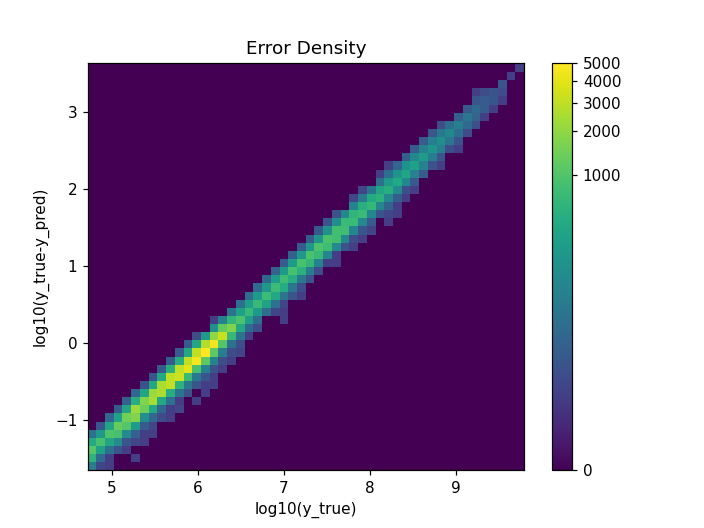

In [7]:
results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)

In [54]:

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_COUNTS', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
 'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', ]]


# #### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[np.log10(df_cumulative['ELE_TOTAL_COUNTS']) < 5])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

# y_train[y_train == 0] = 0.0001
# y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K

num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

filename='counts_tail_loss_new_pipeline_33'
model.save(filename)
model = tensorflow.keras.models.load_model(filename,)

with open ('scalar_X_33_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)


KeyboardInterrupt: 

INFO:tensorflow:Assets written to: counts_tail_loss_new_pipeline_33/assets
5159/5159 [==============================] - 5s 979us/step - loss: 0.3460 - mean_squared_error: 0.3460
[0.34597256779670715, 0.34597256779670715]


<IPython.core.display.Javascript object>


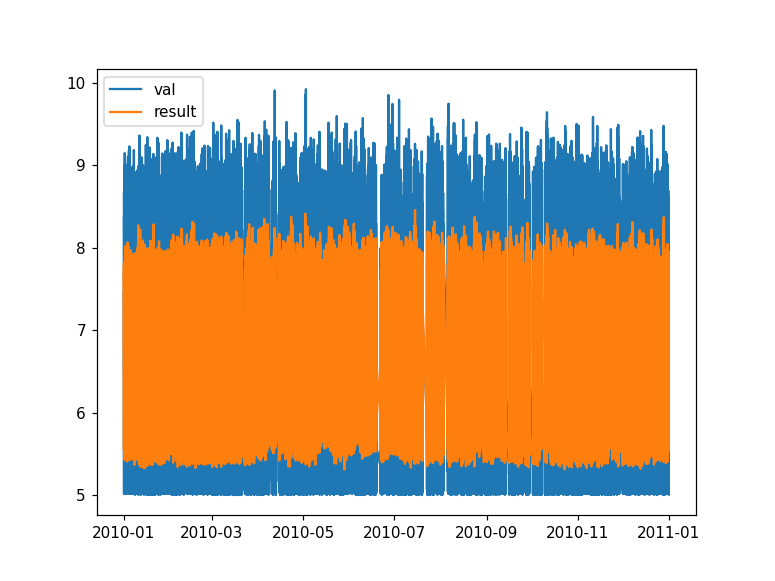

<IPython.core.display.Javascript object>


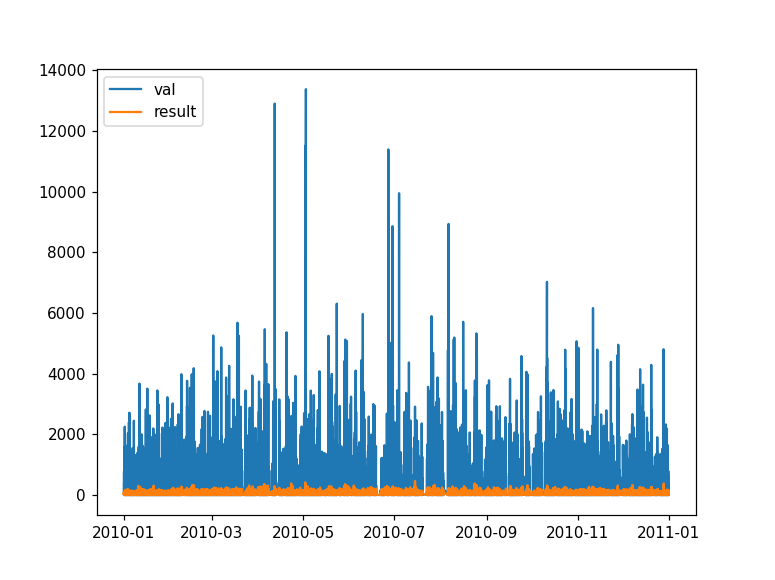

<IPython.core.display.Javascript object>


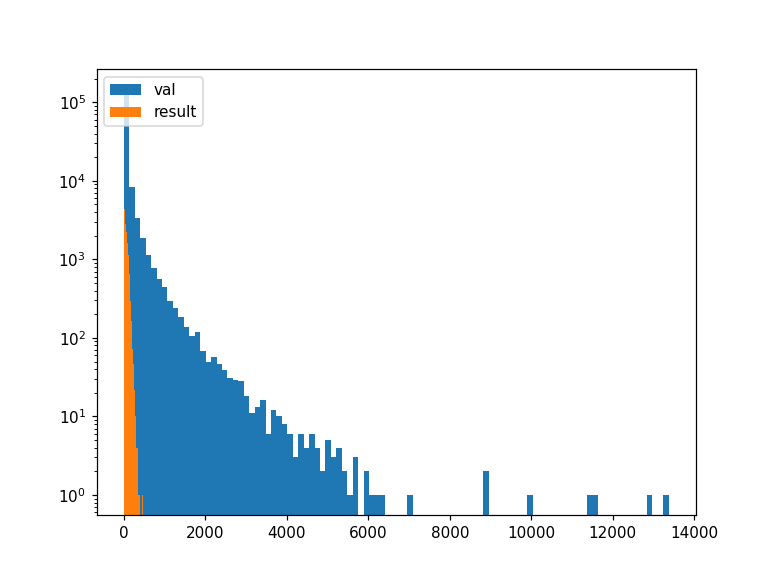

<IPython.core.display.Javascript object>


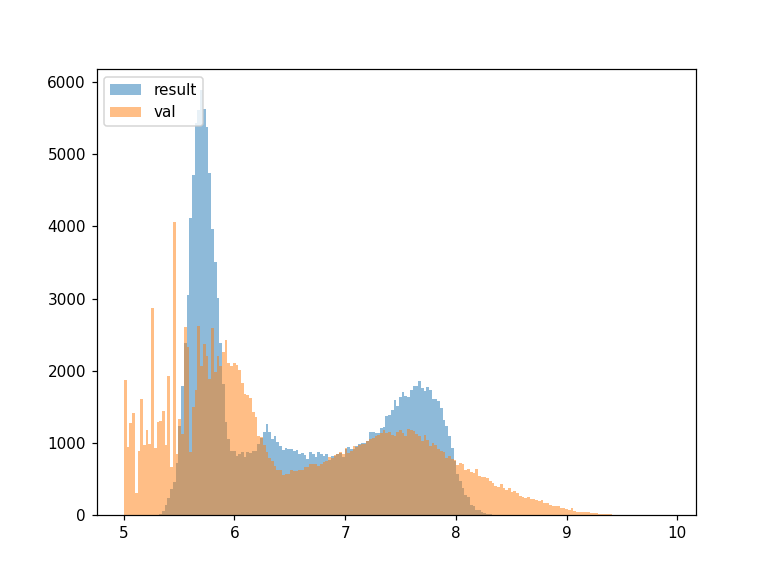

<IPython.core.display.Javascript object>


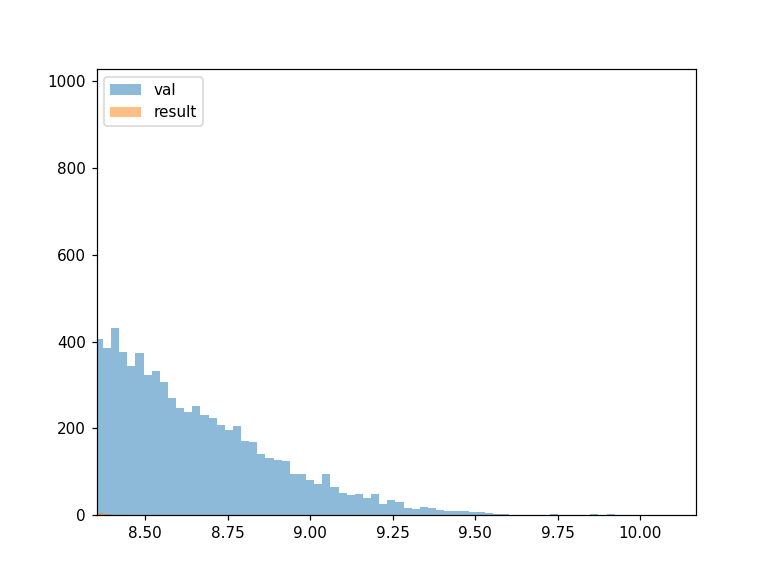

<IPython.core.display.Javascript object>


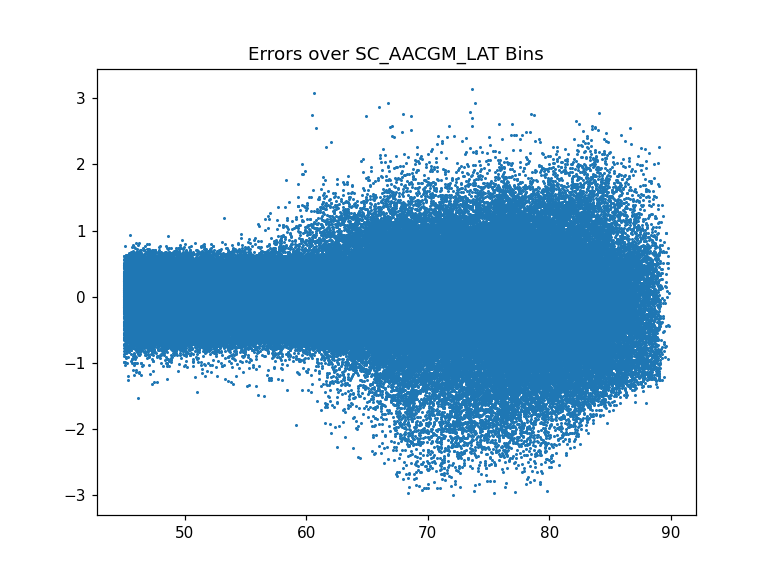

<IPython.core.display.Javascript object>


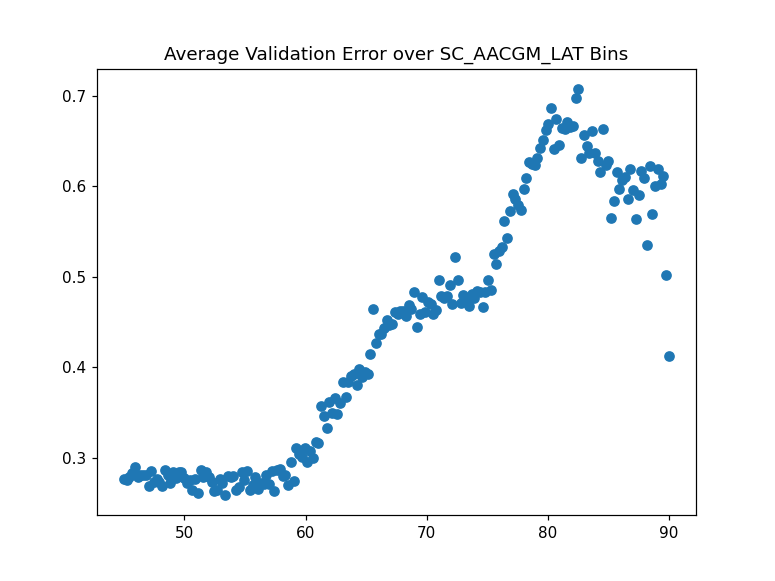

<IPython.core.display.Javascript object>


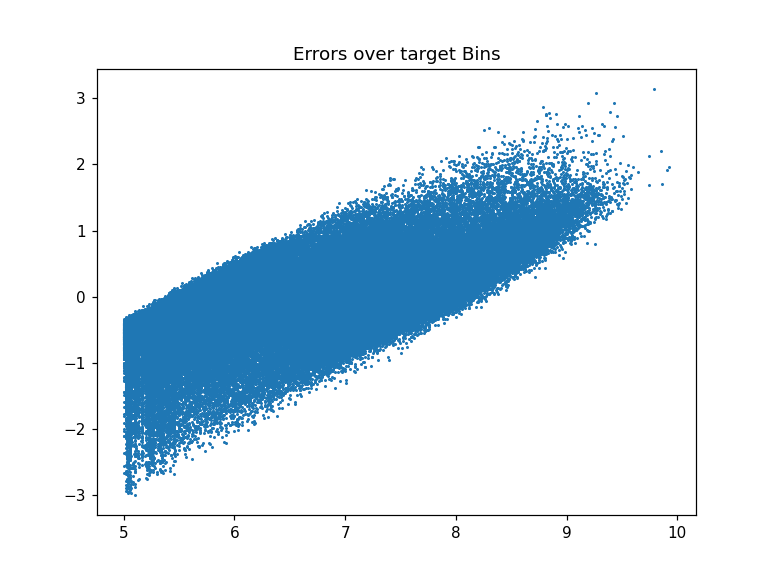

<IPython.core.display.Javascript object>


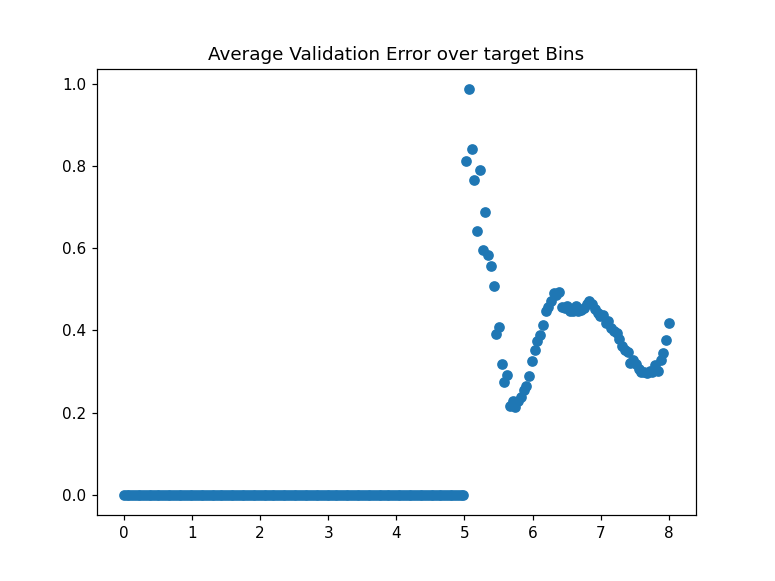

<IPython.core.display.Javascript object>


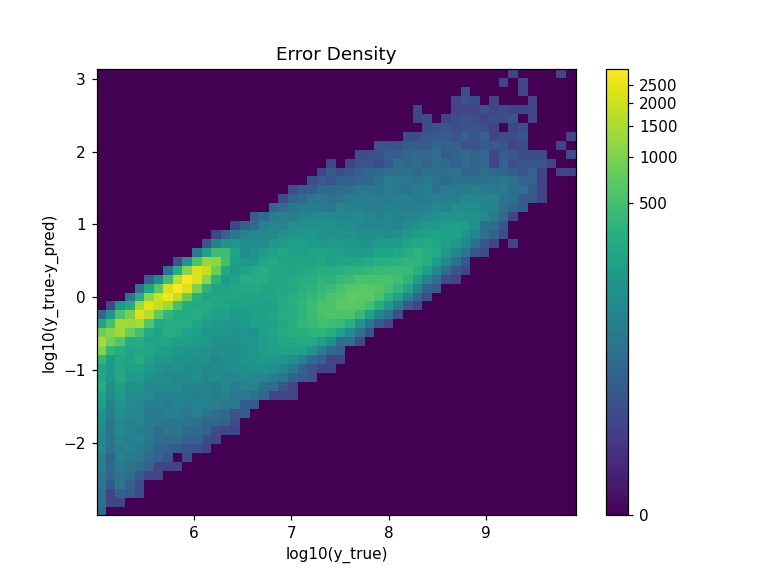

In [30]:
filename='counts_tail_loss_new_pipeline_33'
model.save(filename)
model = tensorflow.keras.models.load_model(filename,)

with open ('scalar_X_33_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)

Model: "functional_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 33)]              0         
_________________________________________________________________
dense_70 (Dense)             (None, 256)               8704      
_________________________________________________________________
dropout_8 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_71 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_72 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_73 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_74 (Dense)             (None, 1024)            

Epoch 70/4000
193/193 - 4s - loss: 0.7294 - mse: 0.4483 - val_loss: 0.7385 - val_mse: 0.4773
Epoch 71/4000
193/193 - 4s - loss: 0.7289 - mse: 0.4480 - val_loss: 0.7328 - val_mse: 0.4710
Epoch 72/4000
193/193 - 4s - loss: 0.7305 - mse: 0.4489 - val_loss: 0.7468 - val_mse: 0.4802
Epoch 73/4000
193/193 - 4s - loss: 0.7267 - mse: 0.4466 - val_loss: 0.6951 - val_mse: 0.5062
Epoch 74/4000
193/193 - 4s - loss: 0.7293 - mse: 0.4484 - val_loss: 0.7192 - val_mse: 0.5107
Epoch 75/4000
193/193 - 4s - loss: 0.7268 - mse: 0.4469 - val_loss: 0.7300 - val_mse: 0.4584
Epoch 76/4000
193/193 - 4s - loss: 0.7274 - mse: 0.4469 - val_loss: 0.7206 - val_mse: 0.5480
Epoch 77/4000
193/193 - 4s - loss: 0.7260 - mse: 0.4465 - val_loss: 0.7821 - val_mse: 0.5277
Epoch 78/4000
193/193 - 4s - loss: 0.7277 - mse: 0.4471 - val_loss: 0.6939 - val_mse: 0.4917
Epoch 79/4000
193/193 - 4s - loss: 0.7248 - mse: 0.4457 - val_loss: 0.7140 - val_mse: 0.4715
Epoch 80/4000
193/193 - 4s - loss: 0.7231 - mse: 0.4448 - val_loss: 0.

<IPython.core.display.Javascript object>


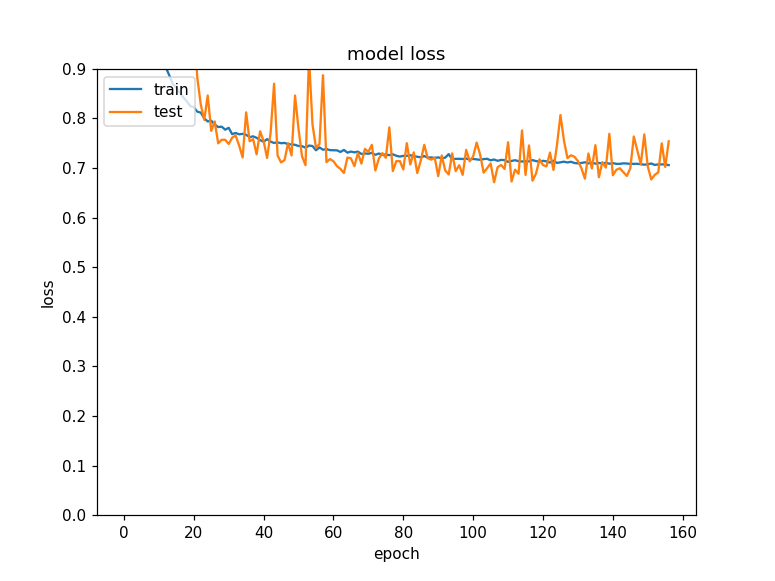

<IPython.core.display.Javascript object>


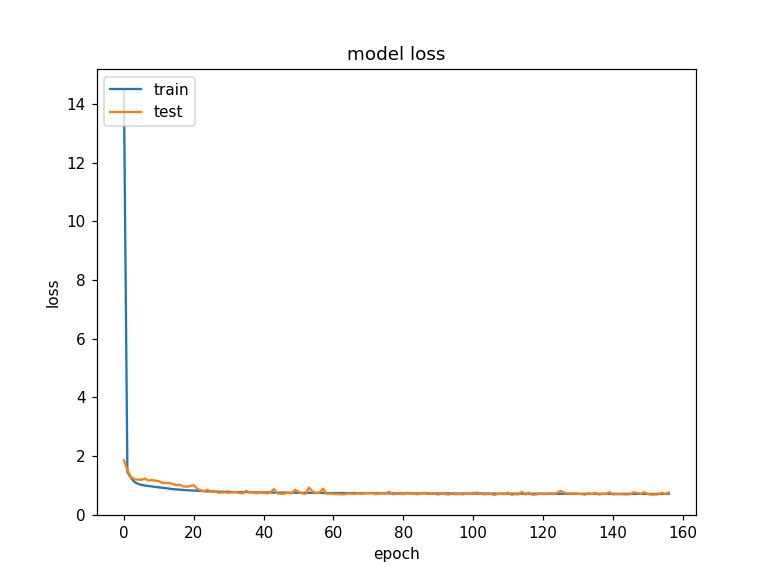

INFO:tensorflow:Assets written to: counts_tail_loss_new_pipeline_33/assets
5159/5159 [==============================] - 6s 1ms/step - loss: 0.6714 - mean_squared_error: 0.5089
[0.6714099645614624, 0.5088513493537903]


<IPython.core.display.Javascript object>


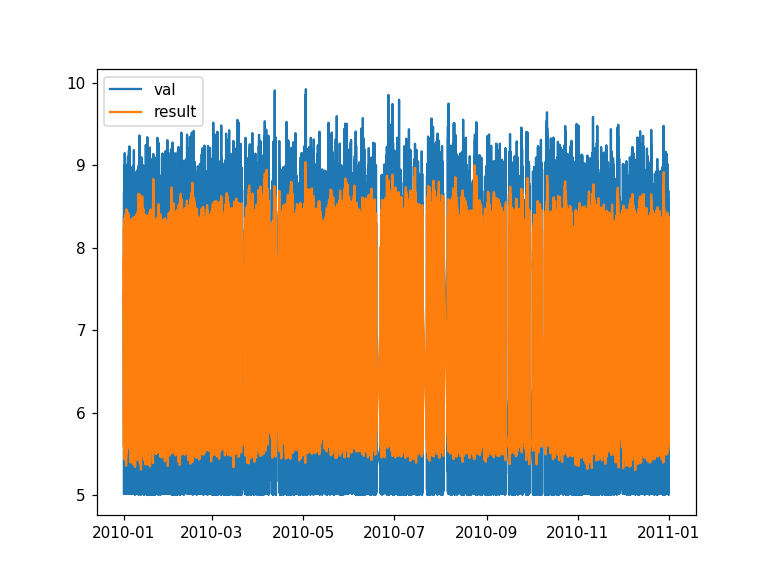

<IPython.core.display.Javascript object>


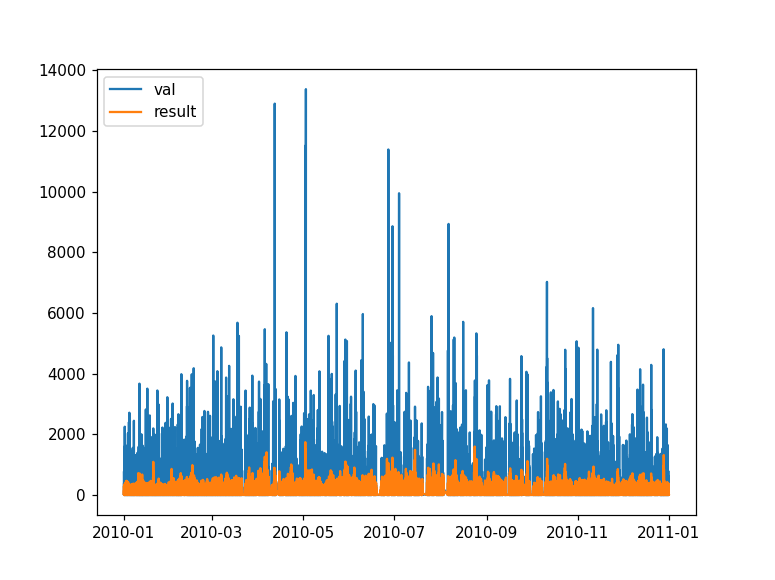

<IPython.core.display.Javascript object>


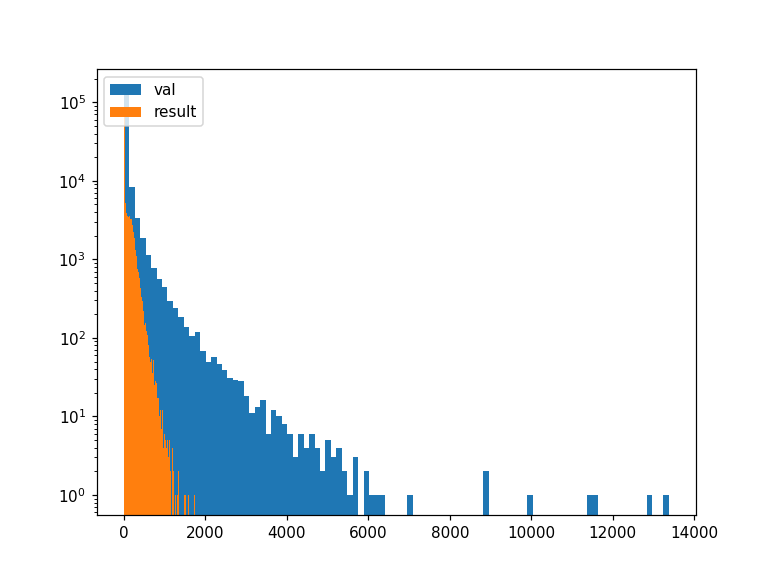

<IPython.core.display.Javascript object>


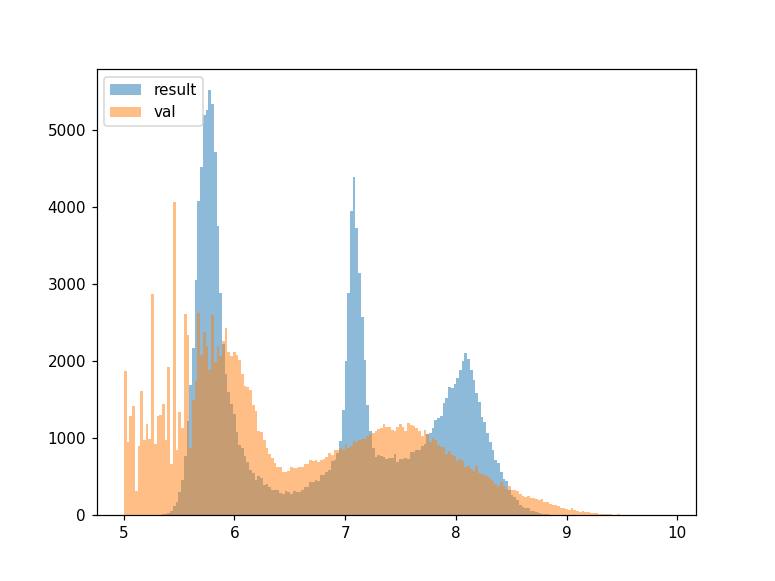

<IPython.core.display.Javascript object>


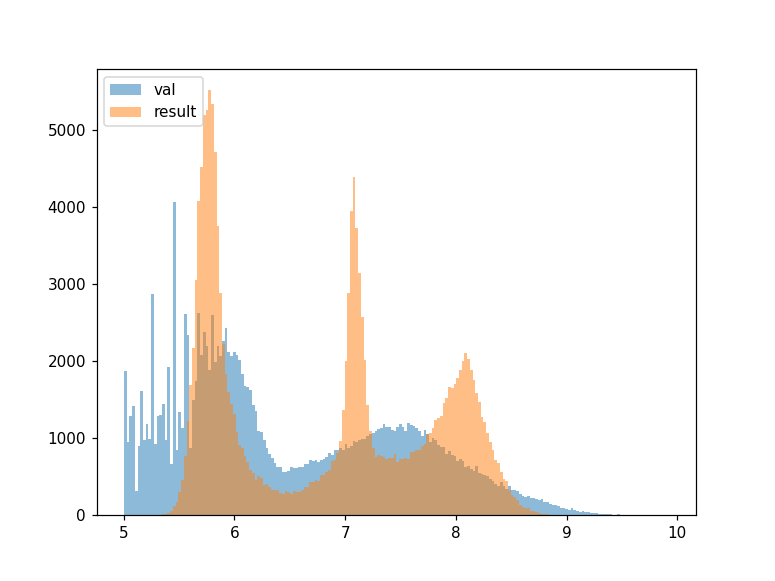

<IPython.core.display.Javascript object>


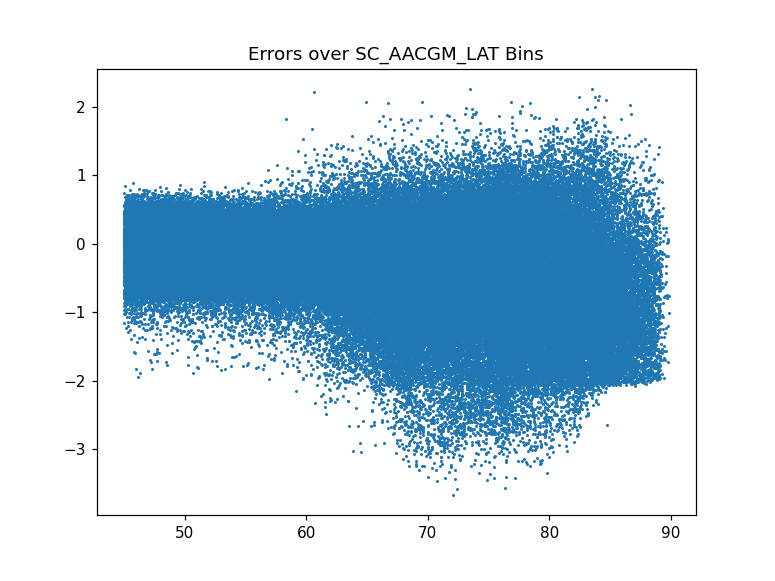

<IPython.core.display.Javascript object>


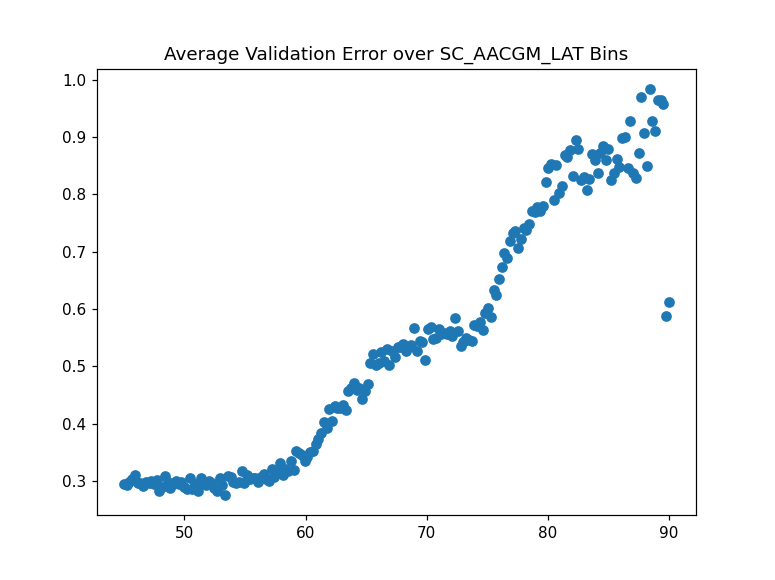

<IPython.core.display.Javascript object>


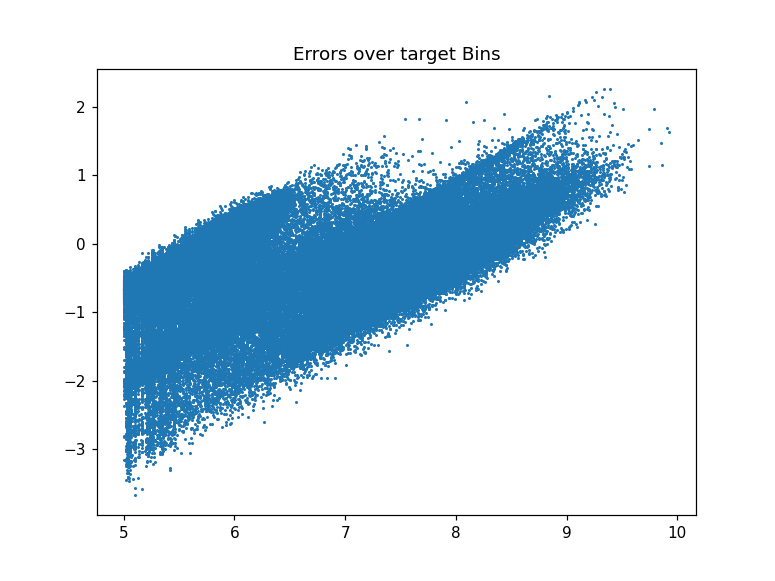

<IPython.core.display.Javascript object>


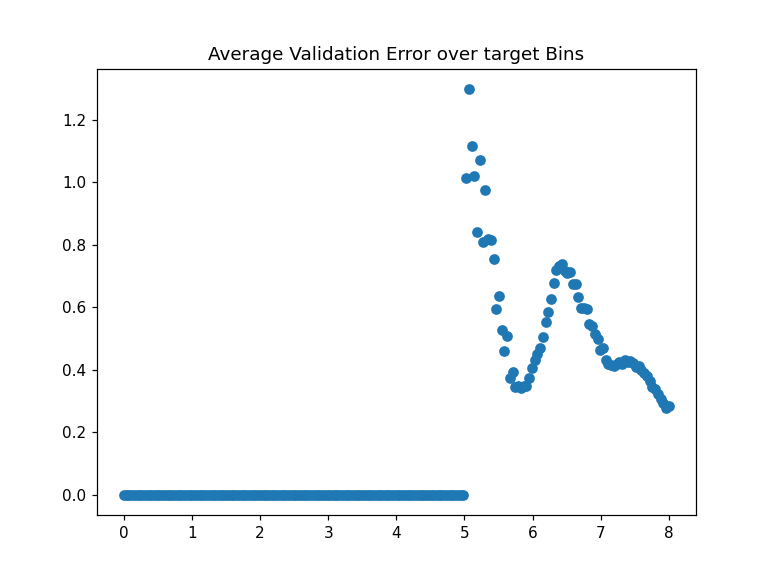

<IPython.core.display.Javascript object>


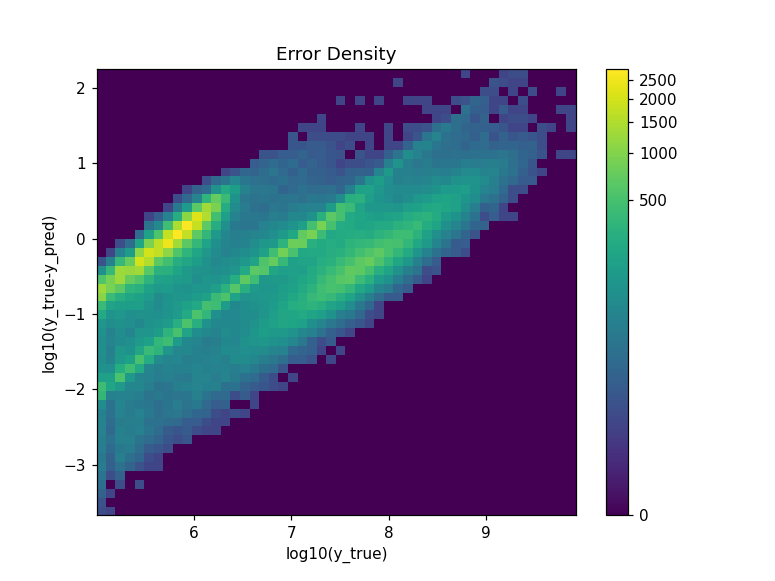

In [31]:

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,8.),'float32')*K.cast(K.less_equal(y_pred,8),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,8.75),'float32')*K.cast(K.less_equal(y_pred,8.75),'float32') +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,7),'float32')*K.cast(K.less_equal(y_pred,7),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,9.25),'float32')*K.cast(K.less_equal(y_pred,9.25),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,9.4),'float32')*K.cast(K.less_equal(y_pred,9.4),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

filename='counts_tail_loss_new_pipeline_33'
model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

with open ('scalar_X_33_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)

Epoch 1/4000
193/193 - 4s - loss: 0.7680 - mean_squared_error: 0.4713 - val_loss: 0.7203 - val_mean_squared_error: 0.4784
Epoch 2/4000
193/193 - 4s - loss: 0.7101 - mean_squared_error: 0.4376 - val_loss: 0.7181 - val_mean_squared_error: 0.4864
Epoch 3/4000
193/193 - 4s - loss: 0.7093 - mean_squared_error: 0.4374 - val_loss: 0.7025 - val_mean_squared_error: 0.4704
Epoch 4/4000
193/193 - 4s - loss: 0.7115 - mean_squared_error: 0.4383 - val_loss: 0.7010 - val_mean_squared_error: 0.4967
Epoch 5/4000
193/193 - 4s - loss: 0.7120 - mean_squared_error: 0.4391 - val_loss: 0.7013 - val_mean_squared_error: 0.4993
Epoch 6/4000
193/193 - 4s - loss: 0.7126 - mean_squared_error: 0.4392 - val_loss: 0.7489 - val_mean_squared_error: 0.5191
Epoch 7/4000
193/193 - 4s - loss: 0.7123 - mean_squared_error: 0.4387 - val_loss: 0.6837 - val_mean_squared_error: 0.5045
Epoch 8/4000
193/193 - 4s - loss: 0.7145 - mean_squared_error: 0.4400 - val_loss: 0.6744 - val_mean_squared_error: 0.5030
Epoch 9/4000
193/193 - 4

Epoch 68/4000
193/193 - 5s - loss: 0.7049 - mean_squared_error: 0.4354 - val_loss: 0.7922 - val_mean_squared_error: 0.4518
Epoch 69/4000
193/193 - 4s - loss: 0.7061 - mean_squared_error: 0.4357 - val_loss: 0.7161 - val_mean_squared_error: 0.5088
Epoch 70/4000
193/193 - 4s - loss: 0.7083 - mean_squared_error: 0.4375 - val_loss: 0.7459 - val_mean_squared_error: 0.4509
Epoch 71/4000
193/193 - 4s - loss: 0.7069 - mean_squared_error: 0.4362 - val_loss: 0.6965 - val_mean_squared_error: 0.4928
Epoch 72/4000
193/193 - 4s - loss: 0.7048 - mean_squared_error: 0.4353 - val_loss: 0.6842 - val_mean_squared_error: 0.4800


<IPython.core.display.Javascript object>


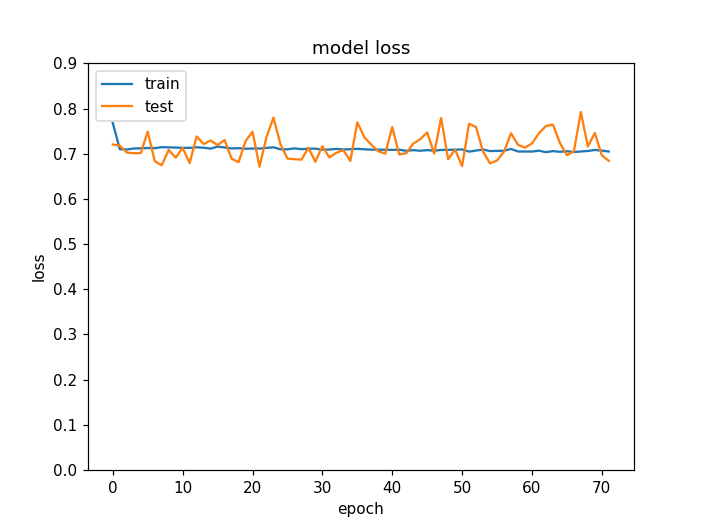

<IPython.core.display.Javascript object>


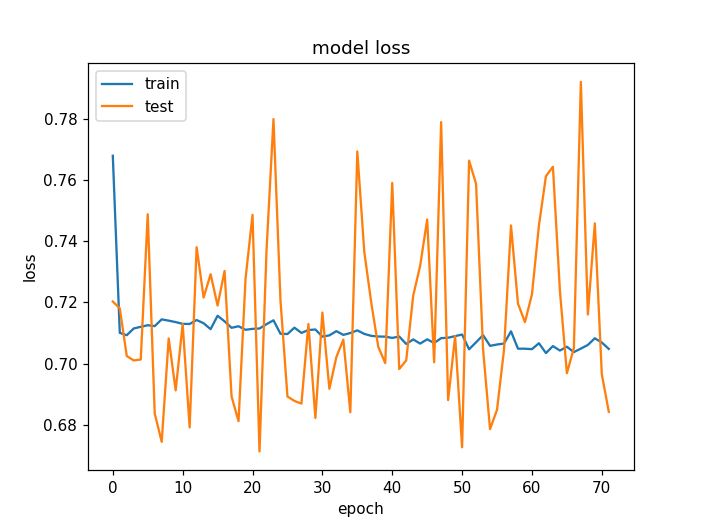

INFO:tensorflow:Assets written to: counts_tail_loss_new_pipeline_33/assets
5159/5159 [==============================] - 9s 2ms/step - loss: 0.6713 - mean_squared_error: 0.4815
[0.6712711453437805, 0.48152273893356323]


<IPython.core.display.Javascript object>


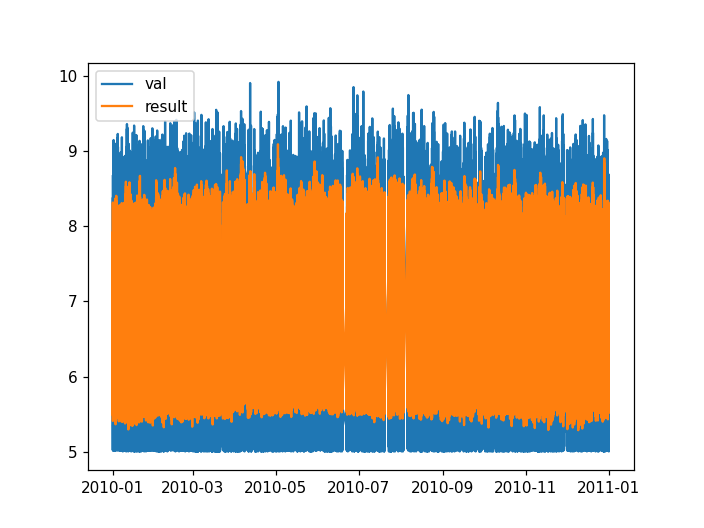

<IPython.core.display.Javascript object>


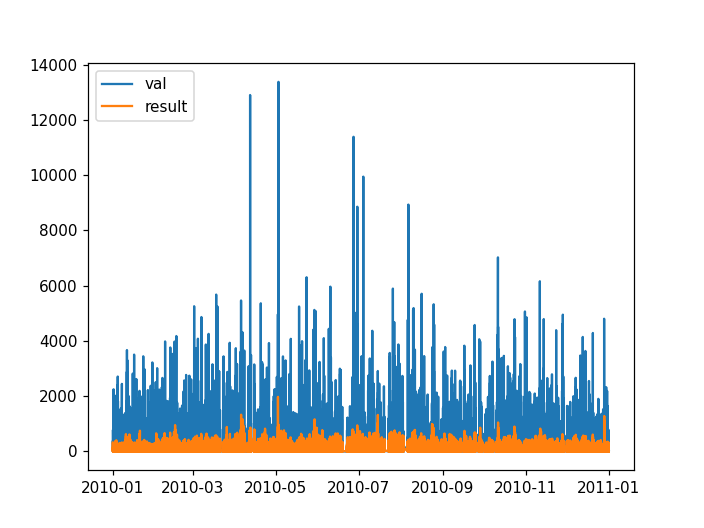

<IPython.core.display.Javascript object>


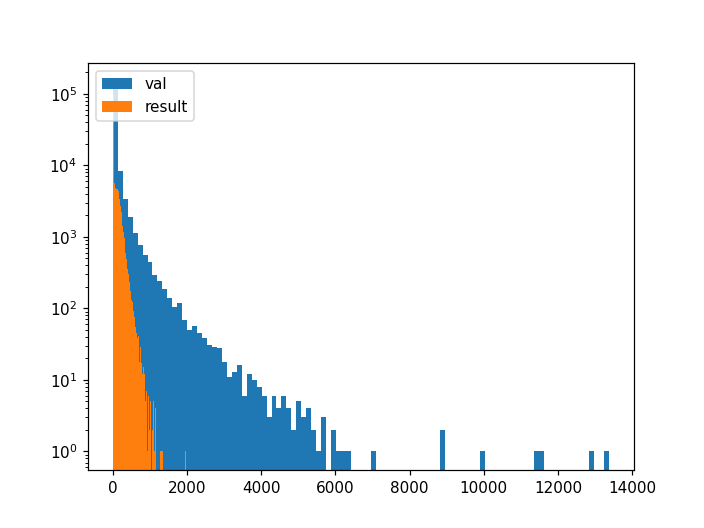

<IPython.core.display.Javascript object>


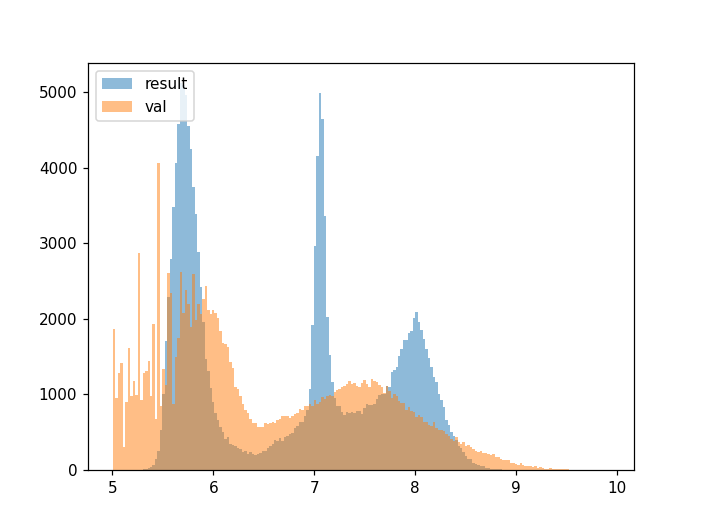

<IPython.core.display.Javascript object>


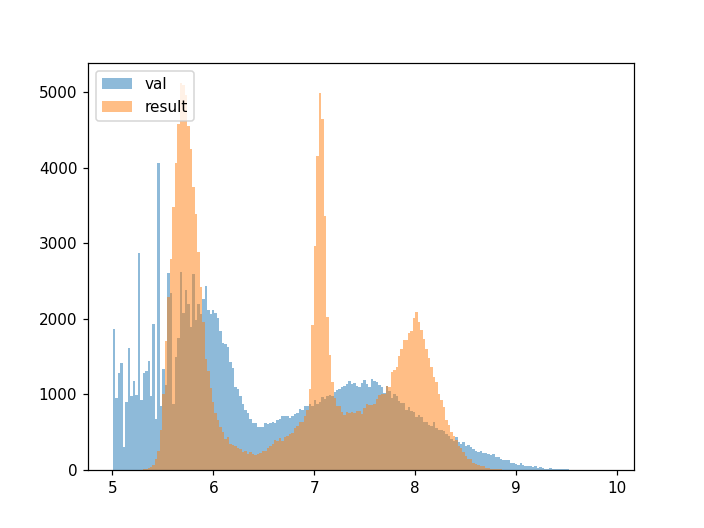

<IPython.core.display.Javascript object>


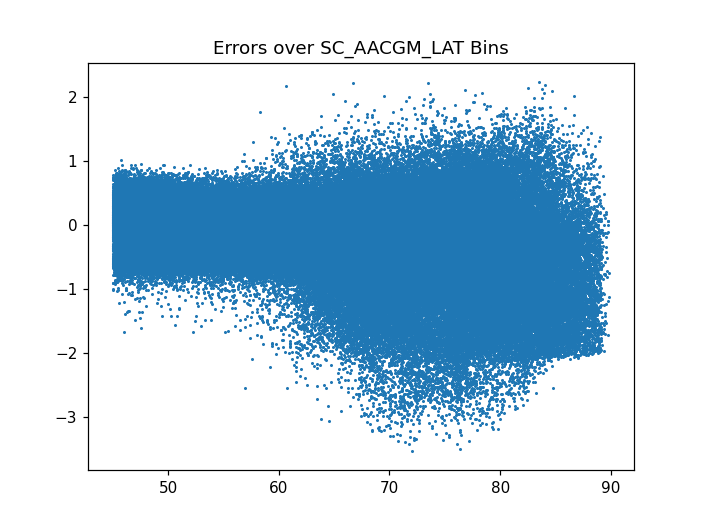

<IPython.core.display.Javascript object>


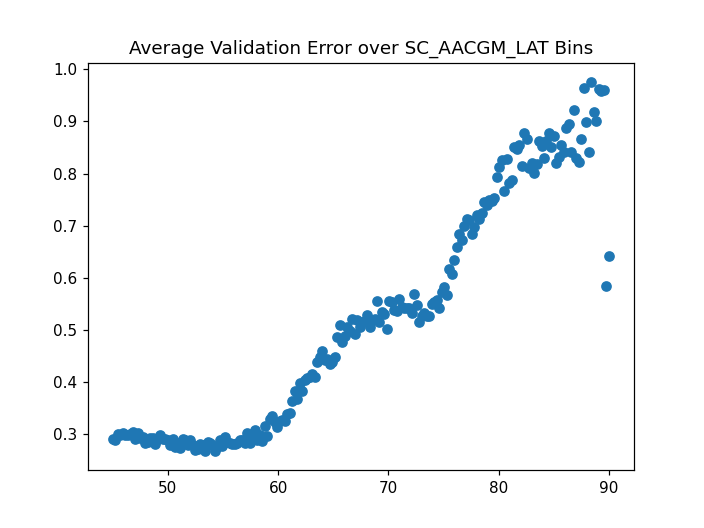

<IPython.core.display.Javascript object>


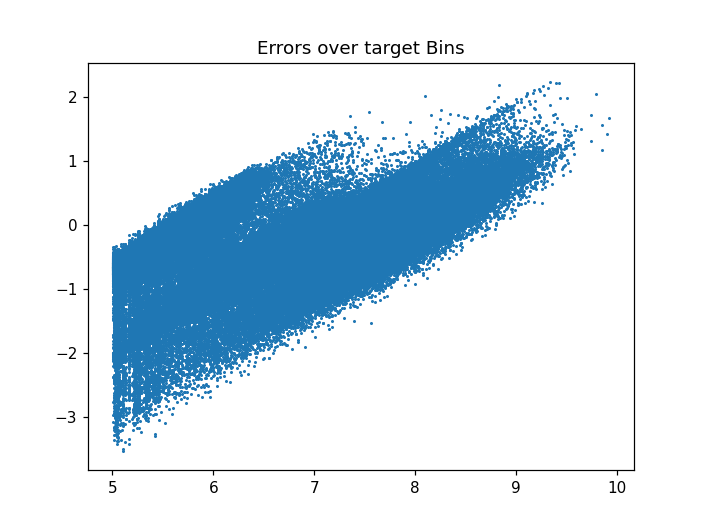

<IPython.core.display.Javascript object>


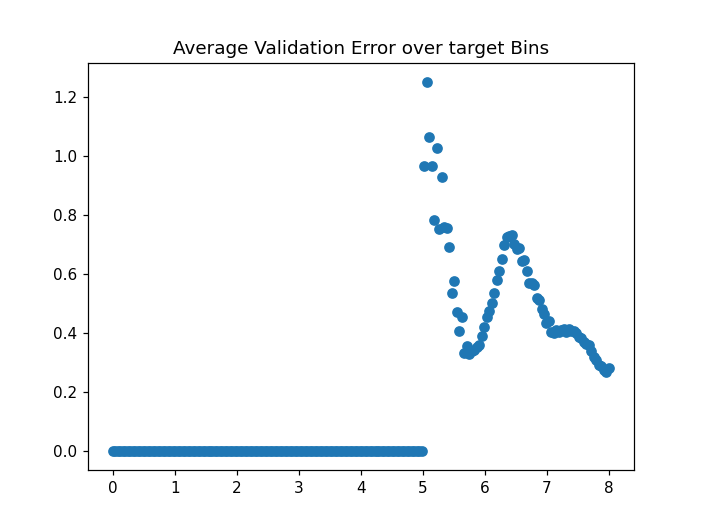

<IPython.core.display.Javascript object>


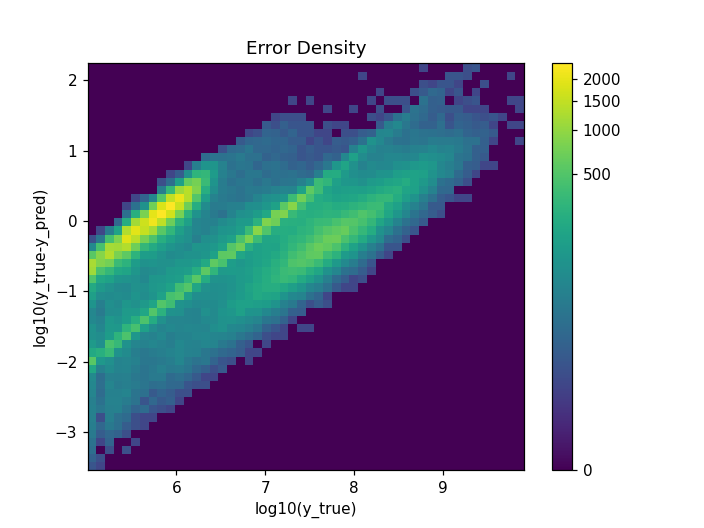

In [32]:
history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

filename='counts_tail_loss_new_pipeline_33'
model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

with open ('scalar_X_33_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)

In [ ]:
# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_COUNTS', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
 'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', ]]


# #### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[np.log10(df_cumulative['ELE_TOTAL_COUNTS']) < 5])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

# y_train[y_train == 0] = 0.0001
# y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K

Model: "functional_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 33)]              0         
_________________________________________________________________
dense_139 (Dense)            (None, 256)               8704      
_________________________________________________________________
dropout_16 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_140 (Dense)            (None, 128)               32896     
_________________________________________________________________
dense_141 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_142 (Dense)            (None, 256)               16640     
_________________________________________________________________
dense_143 (Dense)            (None, 1024)            

Epoch 65/4000
193/193 - 31s - loss: 0.3111 - mse: 0.3111 - val_loss: 0.3676 - val_mse: 0.3676
Epoch 66/4000
193/193 - 31s - loss: 0.3098 - mse: 0.3098 - val_loss: 0.3622 - val_mse: 0.3622
Epoch 67/4000
193/193 - 28s - loss: 0.3110 - mse: 0.3110 - val_loss: 0.3762 - val_mse: 0.3762
Epoch 68/4000
193/193 - 31s - loss: 0.3094 - mse: 0.3094 - val_loss: 0.3573 - val_mse: 0.3573
Epoch 69/4000
193/193 - 31s - loss: 0.3099 - mse: 0.3099 - val_loss: 0.3654 - val_mse: 0.3654
Epoch 70/4000
193/193 - 31s - loss: 0.3108 - mse: 0.3108 - val_loss: 0.3604 - val_mse: 0.3604
Epoch 71/4000
193/193 - 31s - loss: 0.3086 - mse: 0.3086 - val_loss: 0.3751 - val_mse: 0.3751
Epoch 72/4000
193/193 - 31s - loss: 0.3105 - mse: 0.3105 - val_loss: 0.3751 - val_mse: 0.3751
Epoch 73/4000
193/193 - 31s - loss: 0.3066 - mse: 0.3066 - val_loss: 0.3596 - val_mse: 0.3596
Epoch 74/4000
193/193 - 30s - loss: 0.3086 - mse: 0.3086 - val_loss: 0.3680 - val_mse: 0.3680
Epoch 75/4000
193/193 - 31s - loss: 0.3081 - mse: 0.3081 - v

<IPython.core.display.Javascript object>


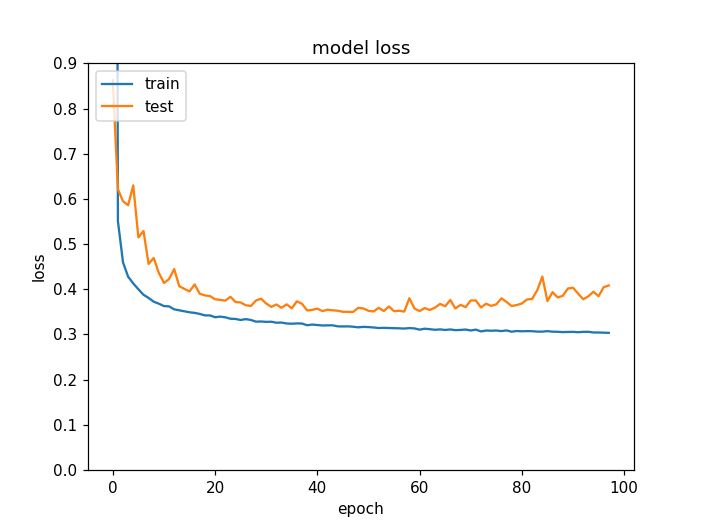

<IPython.core.display.Javascript object>


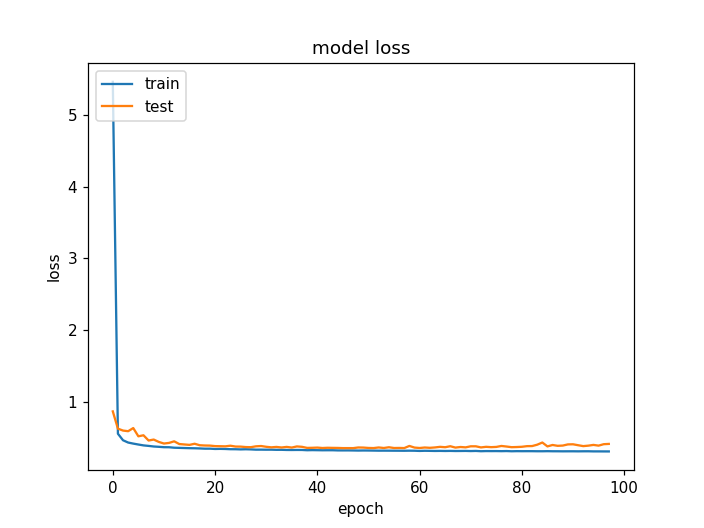

INFO:tensorflow:Assets written to: counts_tail_loss_new_pipeline_33/assets
5159/5159 [==============================] - 14s 3ms/step - loss: 0.3497 - mean_squared_error: 0.3497
[0.3497130870819092, 0.3497130870819092]


<IPython.core.display.Javascript object>


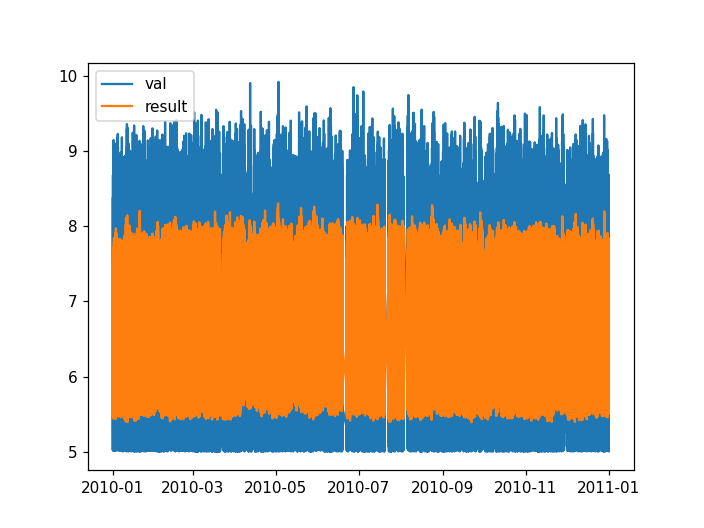

<IPython.core.display.Javascript object>


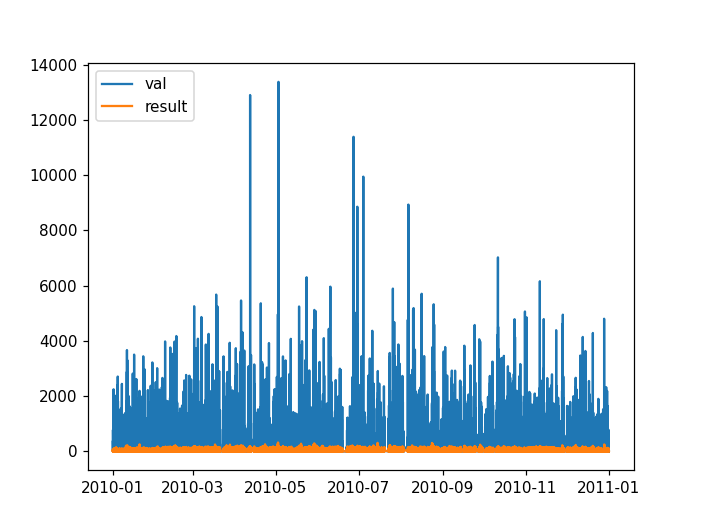

<IPython.core.display.Javascript object>


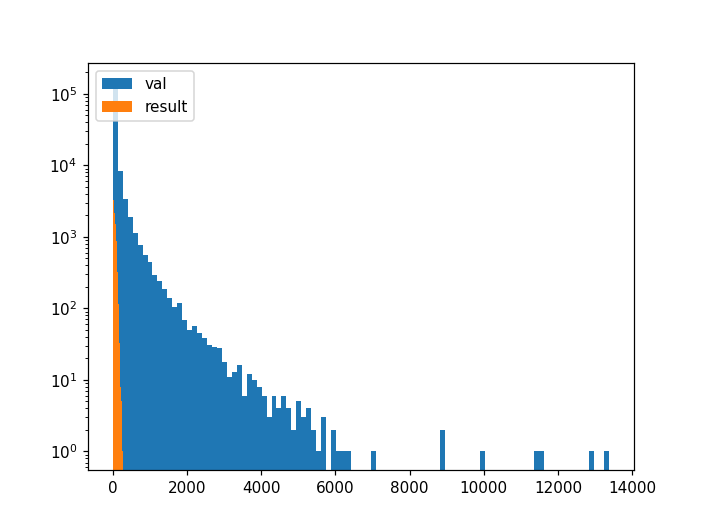

<IPython.core.display.Javascript object>


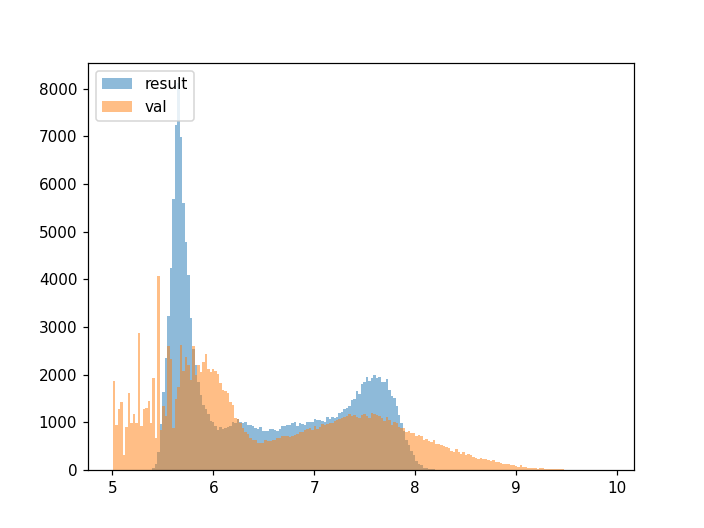

<IPython.core.display.Javascript object>


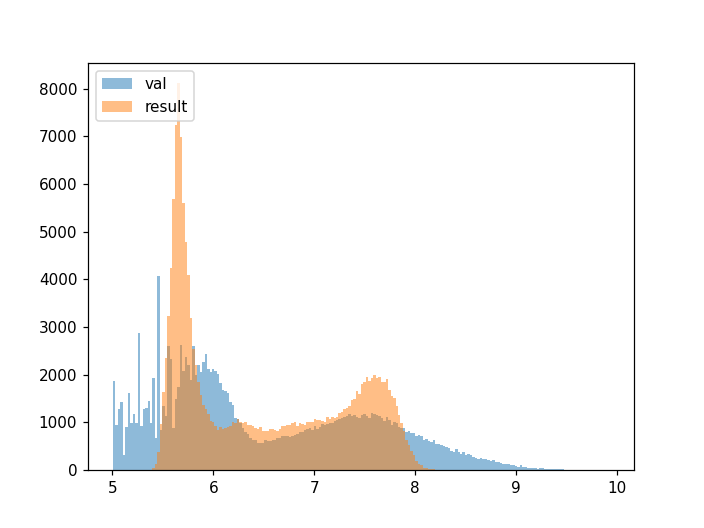

<IPython.core.display.Javascript object>


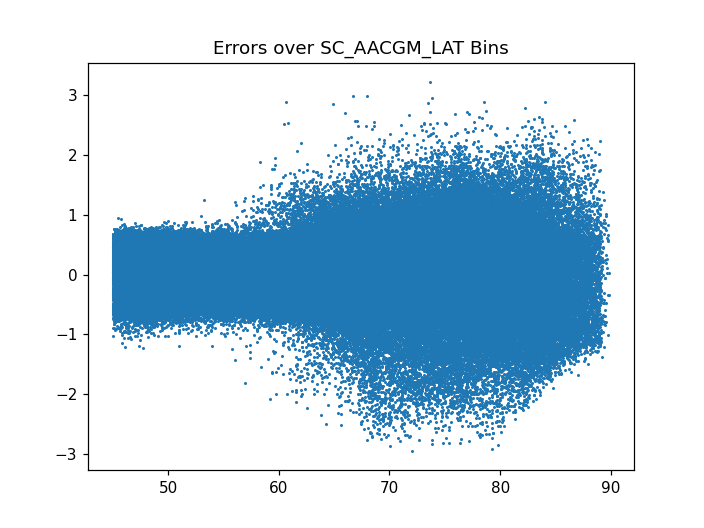

<IPython.core.display.Javascript object>


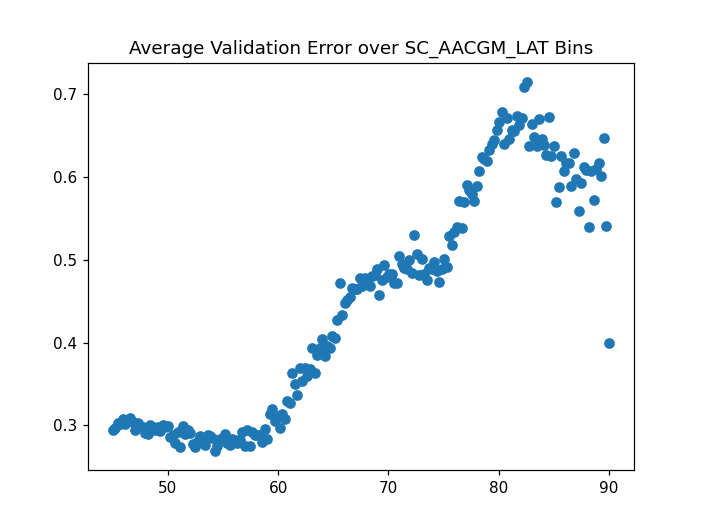

<IPython.core.display.Javascript object>


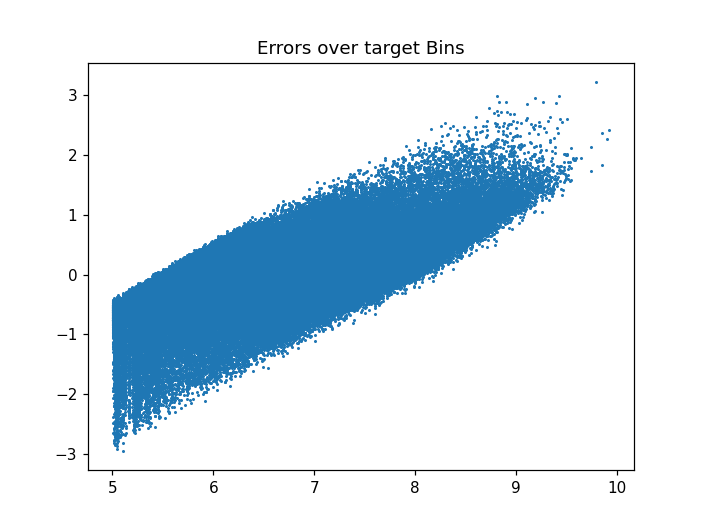

<IPython.core.display.Javascript object>


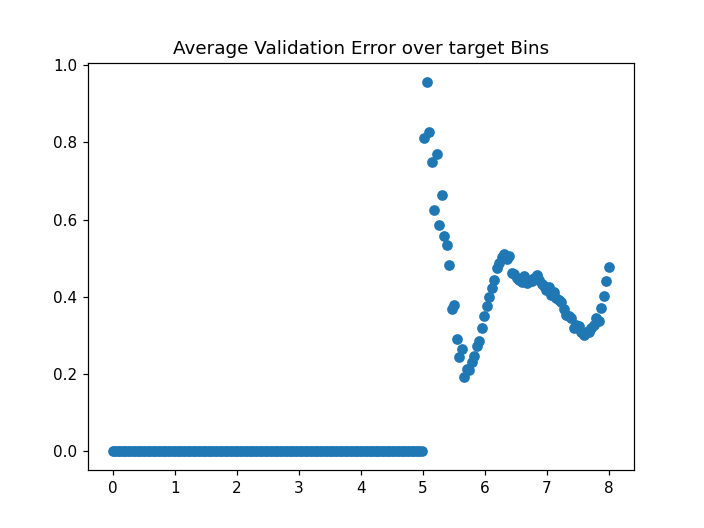

<IPython.core.display.Javascript object>


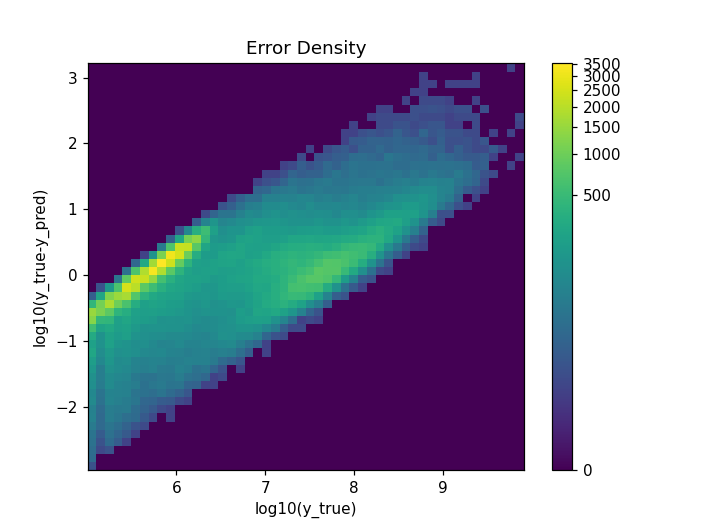

In [59]:
num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(128, activation='relu')(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(2048),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

filename='counts_tail_loss_new_pipeline_33'
model.save(filename)
model = tensorflow.keras.models.load_model(filename,)

with open ('scalar_X_33_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)

In [60]:

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,8.),'float32')*K.cast(K.less_equal(y_pred,8),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,8.75),'float32')*K.cast(K.less_equal(y_pred,8.75),'float32') 
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,9.25),'float32')*K.cast(K.less_equal(y_pred,9.25),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,9.4),'float32')*K.cast(K.less_equal(y_pred,9.4),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(128, activation='relu')(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(2048),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

filename='counts_tail_loss_new_pipeline_33'
model.save(filename)
model = tensorflow.keras.models.load_model(filename,)

with open ('scalar_X_33_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)

Model: "functional_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        [(None, 33)]              0         
_________________________________________________________________
dense_150 (Dense)            (None, 256)               8704      
_________________________________________________________________
dropout_17 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_151 (Dense)            (None, 128)               32896     
_________________________________________________________________
dense_152 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_153 (Dense)            (None, 256)               16640     
_________________________________________________________________
dense_154 (Dense)            (None, 1024)            

Epoch 65/4000
193/193 - 29s - loss: 0.6315 - mse: 0.4053 - val_loss: 0.5882 - val_mse: 0.4182
Epoch 66/4000
193/193 - 30s - loss: 0.6316 - mse: 0.4056 - val_loss: 0.5855 - val_mse: 0.4050
Epoch 67/4000
193/193 - 30s - loss: 0.6310 - mse: 0.4048 - val_loss: 0.5842 - val_mse: 0.4394
Epoch 68/4000
193/193 - 30s - loss: 0.6322 - mse: 0.4061 - val_loss: 0.6169 - val_mse: 0.4429
Epoch 69/4000
193/193 - 30s - loss: 0.6313 - mse: 0.4052 - val_loss: 0.6002 - val_mse: 0.4167
Epoch 70/4000
193/193 - 30s - loss: 0.6294 - mse: 0.4038 - val_loss: 0.5875 - val_mse: 0.4143
Epoch 71/4000
193/193 - 31s - loss: 0.6292 - mse: 0.4045 - val_loss: 0.5875 - val_mse: 0.4078
Epoch 72/4000
193/193 - 32s - loss: 0.6305 - mse: 0.4054 - val_loss: 0.5873 - val_mse: 0.4310
Epoch 73/4000
193/193 - 31s - loss: 0.6285 - mse: 0.4044 - val_loss: 0.5915 - val_mse: 0.4333
Epoch 74/4000
193/193 - 32s - loss: 0.6287 - mse: 0.4041 - val_loss: 0.6402 - val_mse: 0.4568
Epoch 75/4000
193/193 - 33s - loss: 0.6283 - mse: 0.4038 - v

Epoch 152/4000
193/193 - 34s - loss: 0.6074 - mse: 0.3946 - val_loss: 0.6053 - val_mse: 0.4699
Epoch 153/4000
193/193 - 33s - loss: 0.6081 - mse: 0.3952 - val_loss: 0.6209 - val_mse: 0.4787
Epoch 154/4000
193/193 - 33s - loss: 0.6090 - mse: 0.3954 - val_loss: 0.6831 - val_mse: 0.5401
Epoch 155/4000
193/193 - 33s - loss: 0.6082 - mse: 0.3946 - val_loss: 0.6243 - val_mse: 0.4557
Epoch 156/4000
193/193 - 33s - loss: 0.6070 - mse: 0.3944 - val_loss: 0.6234 - val_mse: 0.4651
Epoch 157/4000
193/193 - 33s - loss: 0.6088 - mse: 0.3951 - val_loss: 0.6168 - val_mse: 0.4547
Epoch 158/4000
193/193 - 33s - loss: 0.6086 - mse: 0.3950 - val_loss: 0.6199 - val_mse: 0.4855
Epoch 159/4000
193/193 - 33s - loss: 0.6070 - mse: 0.3945 - val_loss: 0.6433 - val_mse: 0.4815


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

INFO:tensorflow:Assets written to: counts_tail_loss_new_pipeline_33/assets


ValueError: Unknown loss function: custom_loss

<IPython.core.display.Javascript object>


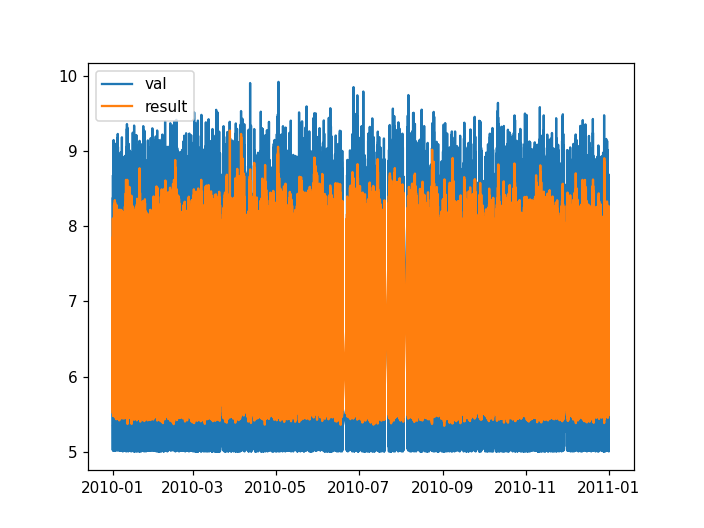

<IPython.core.display.Javascript object>


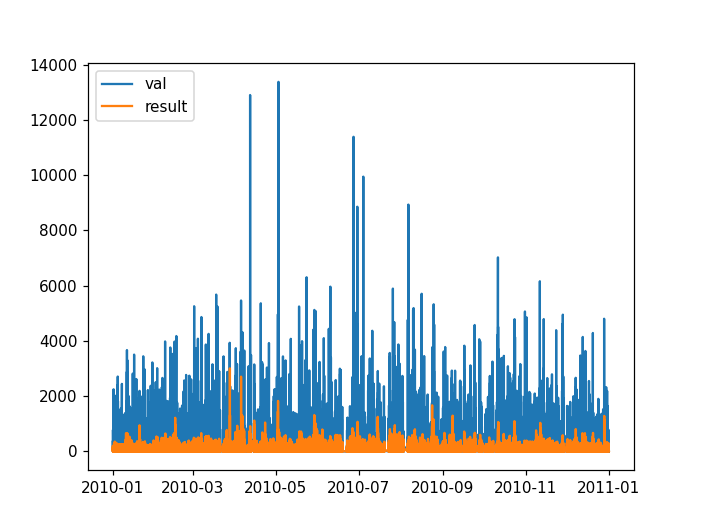

<IPython.core.display.Javascript object>


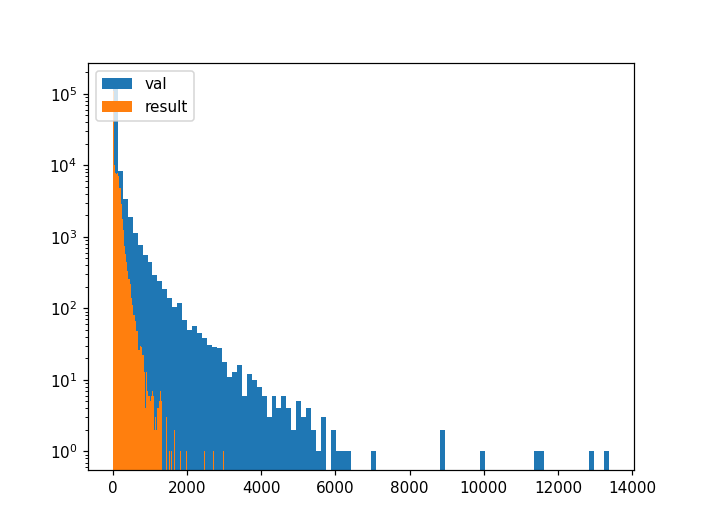

<IPython.core.display.Javascript object>


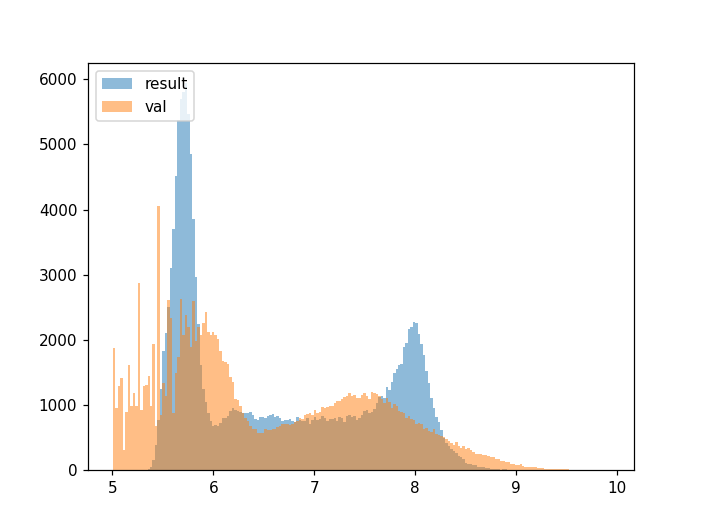

<IPython.core.display.Javascript object>


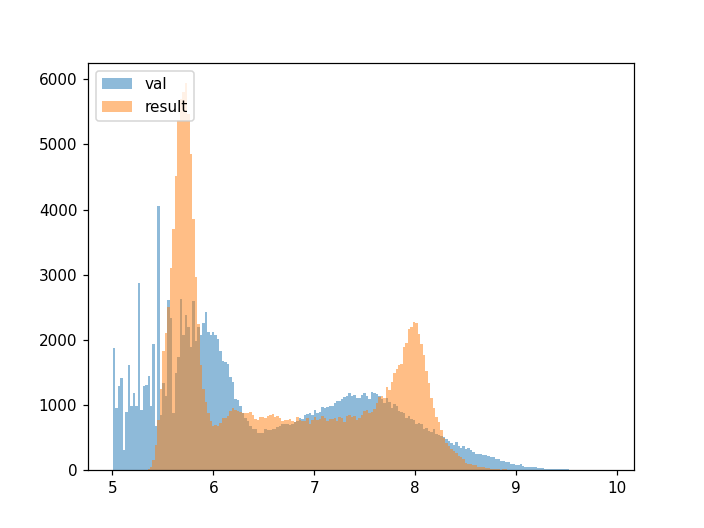

<IPython.core.display.Javascript object>


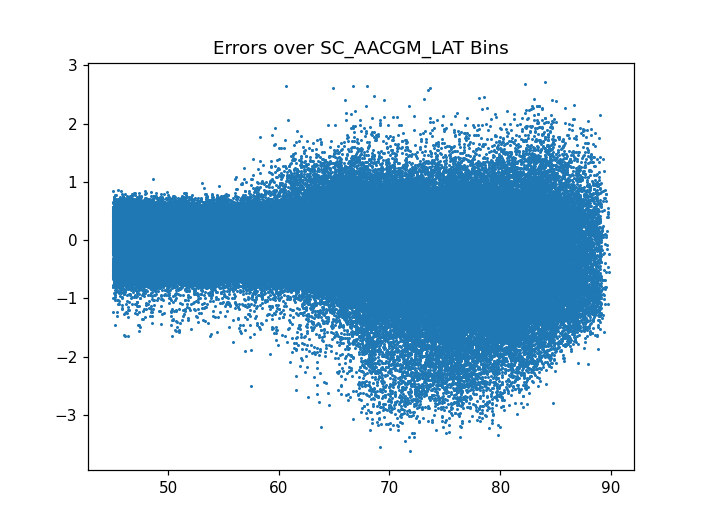

<IPython.core.display.Javascript object>


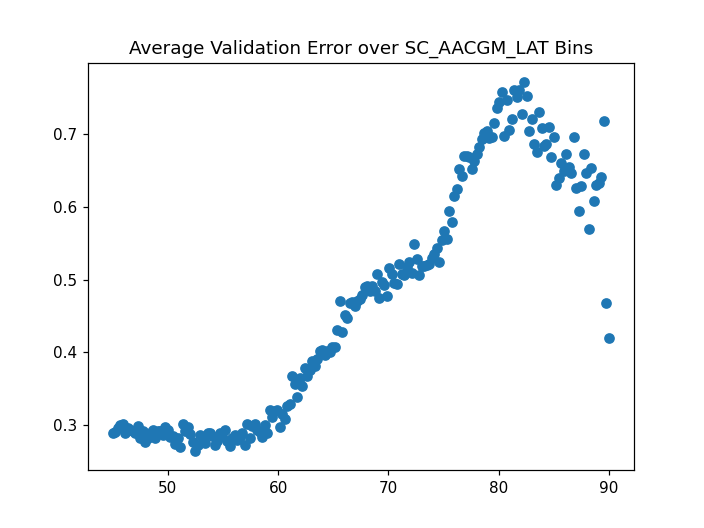

<IPython.core.display.Javascript object>


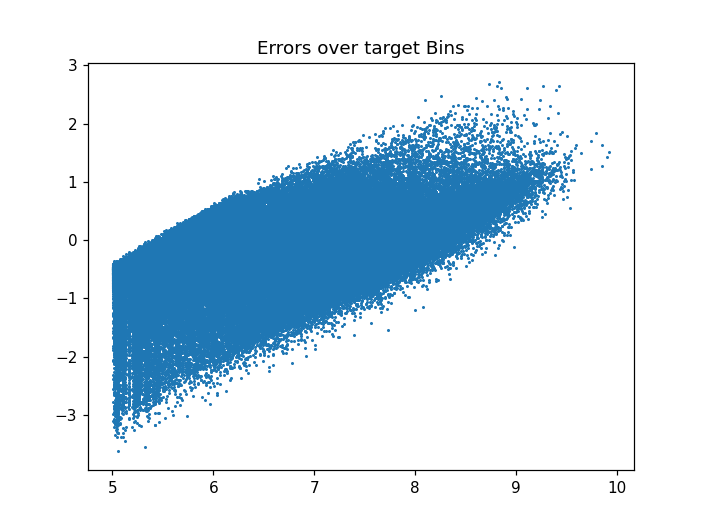

<IPython.core.display.Javascript object>


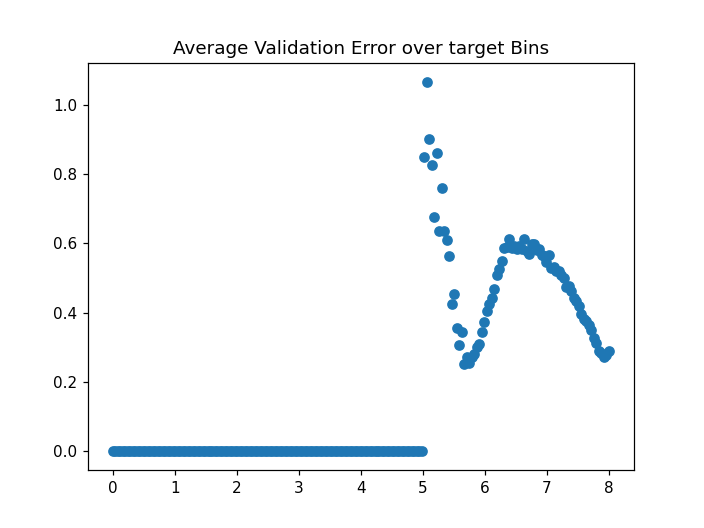

<IPython.core.display.Javascript object>


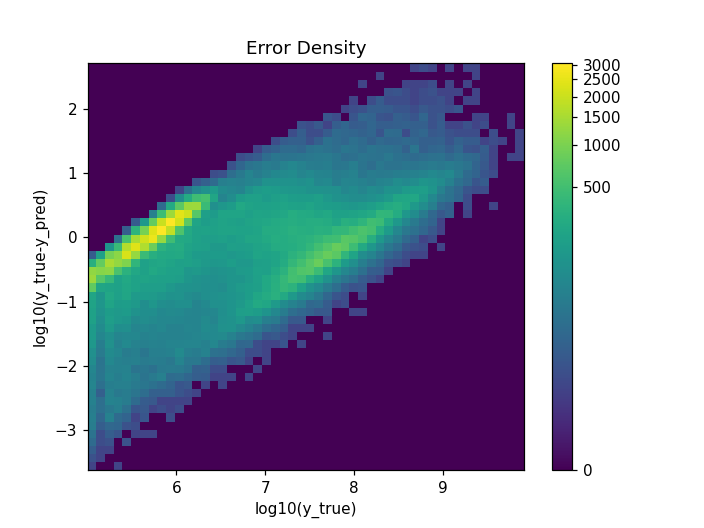

In [61]:
results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)

In [ ]:
results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

plot_model_counts(df_results)

In [43]:
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
#         10*(y_true-y_pred)*(y_true-y_pred)
#         *K.cast(K.greater(y_true,1.25),'float32')*K.cast(K.less_equal(y_pred,1.25),'float32') +
#         10*(y_true-y_pred)*(y_true-y_pred) 
#         *K.cast(K.greater(y_true,2.),'float32')*K.cast(K.less_equal(y_pred,2.0),'float32') +
#         10*(y_true-y_pred)*(y_true-y_pred)
#         *K.cast(K.greater(y_true,2.33),'float32')*K.cast(K.less_equal(y_pred,2.5),'float32')  
        +
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,2.66+3),'float32')*K.cast(K.less_equal(y_pred,2.66+3),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,3.+3),'float32')*K.cast(K.less_equal(y_pred,3.+3),'float32')  
                +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,3.5+3),'float32')*K.cast(K.less_equal(y_pred,3.33+3),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

## Now repeat training for each channel separately

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

    
print(df_cumulative.columns.tolist())
cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()
# #### GET RID OF THE REALLY SMALL VALUES
# df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 4])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])


del df_cumulative


# Construct X and y
feature_cols = ['SC_AACGM_LAT',  'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
 'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', ]


X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val[['ELE_COUNT_1','ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19']].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train[['ELE_COUNT_1','ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19']].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 1 #0.0001
y_val[y_val == 0] = 1 #0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train



['ELE_AVG_ENERGY', 'ELE_AVG_ENERGY_STD', 'ELE_TOTAL_ENERGY_FLUX', 'ELE_TOTAL_ENERGY_FLUX_STD', 'SC_AACGM_LAT', 'SC_AACGM_LON', 'SC_AACGM_LTIME', 'ELE_TOTAL_COUNTS', 'ELE_COUNT_1', 'ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19', 'ELE_diff_1', 'ELE_diff_2', 'ELE_diff_3', 'ELE_diff_4', 'ELE_diff_5', 'ELE_diff_6', 'ELE_diff_7', 'ELE_diff_8', 'ELE_diff_9', 'ELE_diff_10', 'ELE_diff_11', 'ELE_diff_12', 'ELE_diff_13', 'ELE_diff_14', 'ELE_diff_15', 'ELE_diff_16', 'ELE_diff_17', 'ELE_diff_18', 'ELE_diff_19', 'Bz', 'By', 'Vsw', 'Vx', 'Psw', 'AE', 'AL', 'AU', 'SymH', 'Clock Angle', 'newell', 'borovsky', 'Kp', 'F107', 'PC', 'Bx', 'Bz_6hr', 'By_6hr', 'Vsw_6hr', 'Vx_6hr', 'Psw_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'Clock Angle_6hr', 'newell_6hr', 'borovsky_6hr', 

Model: "functional_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 33)]              0         
_________________________________________________________________
dense_95 (Dense)             (None, 256)               8704      
_________________________________________________________________
dropout_11 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_96 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_97 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_98 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_99 (Dense)             (None, 1024)            

196/196 - 5s - loss: 1.8347 - mse: 1.5788 - val_loss: 1.5890 - val_mse: 1.3547
Epoch 72/1000
196/196 - 5s - loss: 1.8338 - mse: 1.5780 - val_loss: 1.5760 - val_mse: 1.3815
Epoch 73/1000
196/196 - 5s - loss: 1.8326 - mse: 1.5774 - val_loss: 1.5627 - val_mse: 1.3608
Epoch 74/1000
196/196 - 5s - loss: 1.8316 - mse: 1.5766 - val_loss: 1.5743 - val_mse: 1.4108
Epoch 75/1000
196/196 - 5s - loss: 1.8323 - mse: 1.5773 - val_loss: 1.5673 - val_mse: 1.3640
Epoch 76/1000
196/196 - 5s - loss: 1.8322 - mse: 1.5767 - val_loss: 1.5651 - val_mse: 1.3772
Epoch 77/1000
196/196 - 5s - loss: 1.8323 - mse: 1.5772 - val_loss: 1.5686 - val_mse: 1.3835
Epoch 78/1000
196/196 - 5s - loss: 1.8309 - mse: 1.5761 - val_loss: 1.5741 - val_mse: 1.4058
Epoch 79/1000
196/196 - 5s - loss: 1.8302 - mse: 1.5756 - val_loss: 1.5636 - val_mse: 1.3733
Epoch 80/1000
196/196 - 5s - loss: 1.8298 - mse: 1.5752 - val_loss: 1.5896 - val_mse: 1.3728
Epoch 81/1000
196/196 - 5s - loss: 1.8288 - mse: 1.5741 - val_loss: 1.5691 - val_mse

<IPython.core.display.Javascript object>


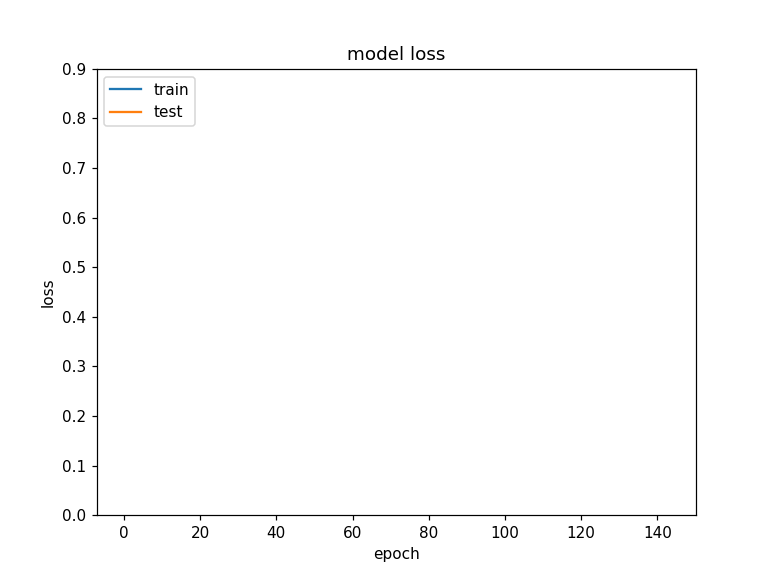

<IPython.core.display.Javascript object>


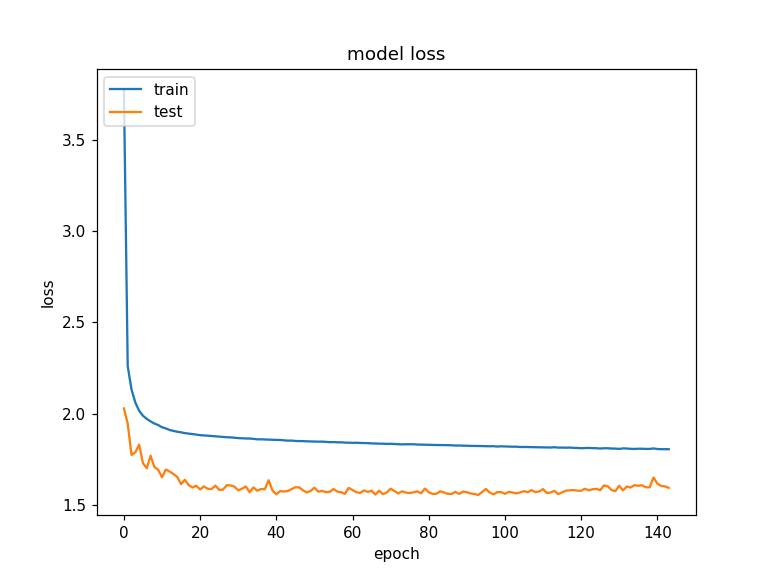

In [44]:
from tensorflow.keras.layers import Input
num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(64, activation='relu')(model1)
#model1 = Dense(4, activation='relu')(model1)
model1 = Dense(19, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=1000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [45]:
results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

model_3 = df_results

In [46]:
results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

model_3 = df_results
ch_energies = np.array([30000.0,20400.0,13900.0,9450.0,6460.0,4400.0,3000.0,2040.0,
                        1392.0,949.0,646.0,440.0,300.0,204.0,139.0,95.0,65.0,44.0,30.0])
ch_energies = np.flip((ch_energies[:]))
#need to fix this latter to add first channel back in
ELE_TOTAL_COUNTS = 10**(df_results.values[:,0])*(ch_energies[1]-ch_energies[0])
+ 10**(df_results.values[:,18])*(ch_energies[18]-ch_energies[17])
for i in range(1,18):
    ELE_TOTAL_COUNTS = ELE_TOTAL_COUNTS +     10**(df_results.values[:,i])*(ch_energies[i+1]-ch_energies[i-1])/2.
ELE_TOTAL_COUNTS= pd.DataFrame(data=np.log10(np.reshape(ELE_TOTAL_COUNTS,(ELE_TOTAL_COUNTS.shape[0])) ), index = df_val.index)
    
ELE_TOTAL_COUNTS_val = 10**(y_val_log.values[:,0])*(ch_energies[1]-ch_energies[0])
+ 10**(y_val_log.values[:,18])*(ch_energies[18]-ch_energies[17])
for i in range(1,18):
    ELE_TOTAL_COUNTS_val = ELE_TOTAL_COUNTS_val +     10**(y_val_log.values[:,i])*(ch_energies[i+1]-ch_energies[i-1])/2.
    
temp = y_val_log
y_val_log = pd.DataFrame(data=np.log10(np.reshape(ELE_TOTAL_COUNTS_val,(ELE_TOTAL_COUNTS_val.shape[0]) )), index = df_val.index)

df_results = ELE_TOTAL_COUNTS

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


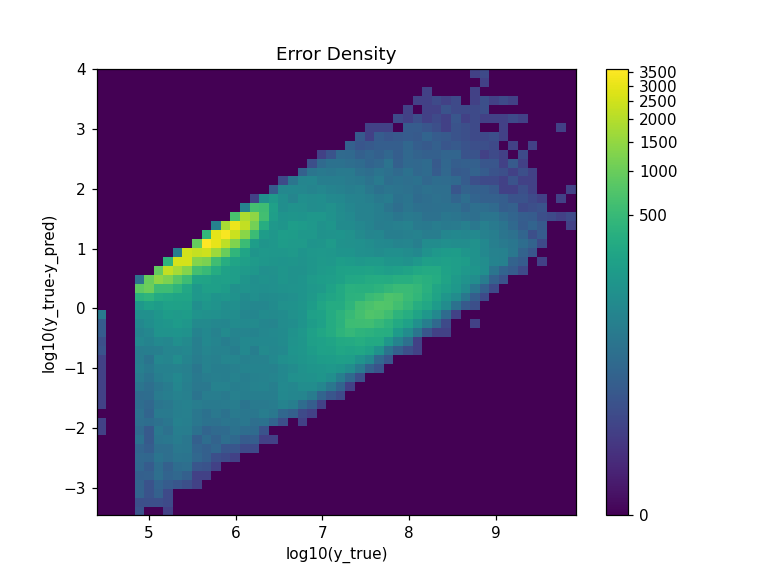

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


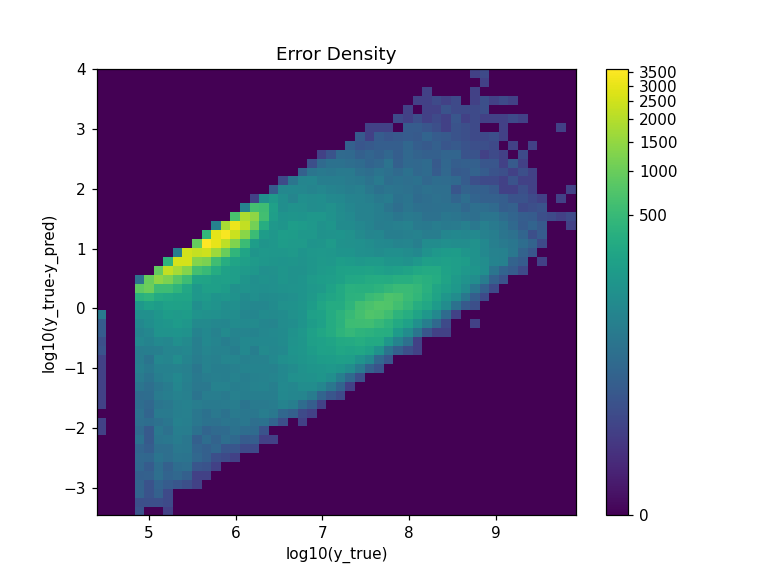

<IPython.core.display.Javascript object>


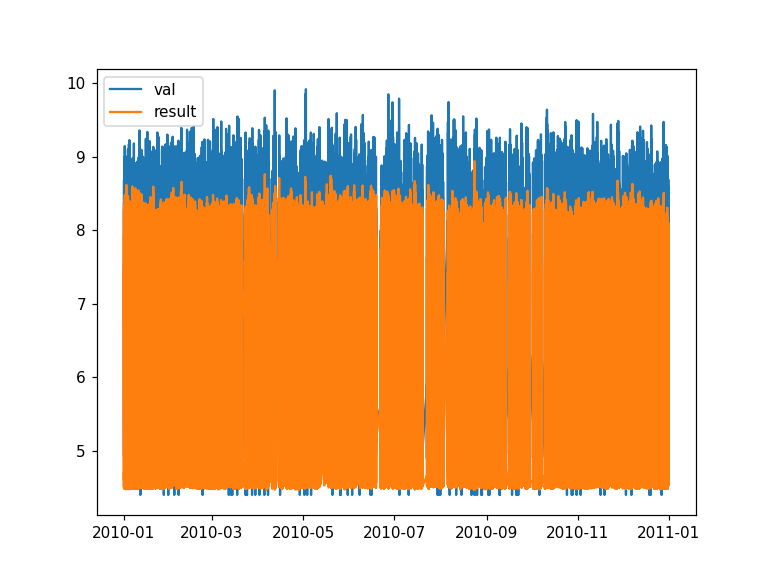

<IPython.core.display.Javascript object>


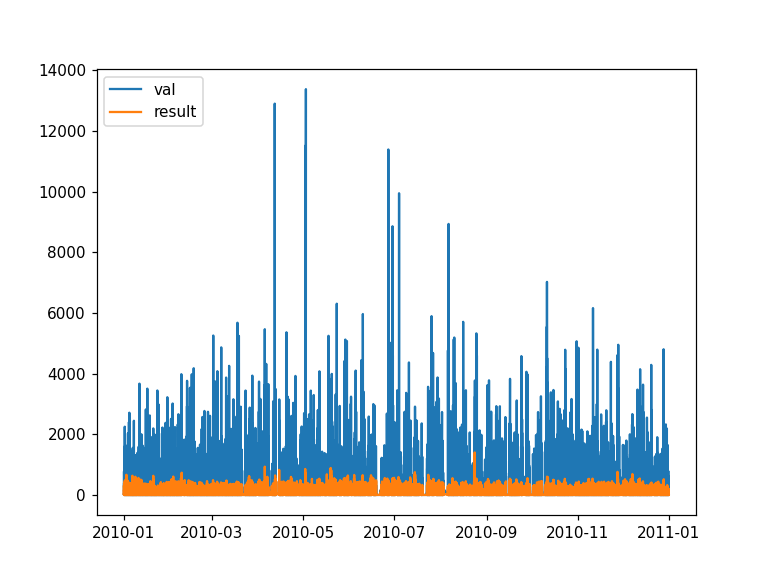

<IPython.core.display.Javascript object>


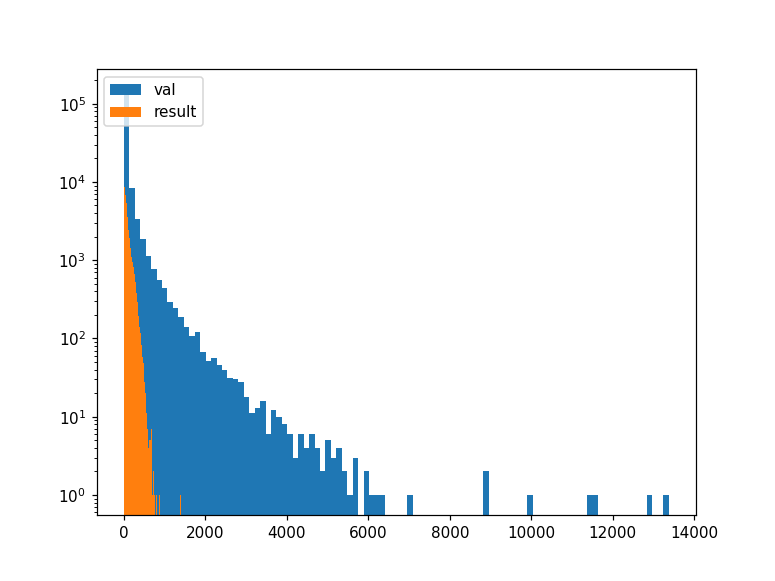

<IPython.core.display.Javascript object>


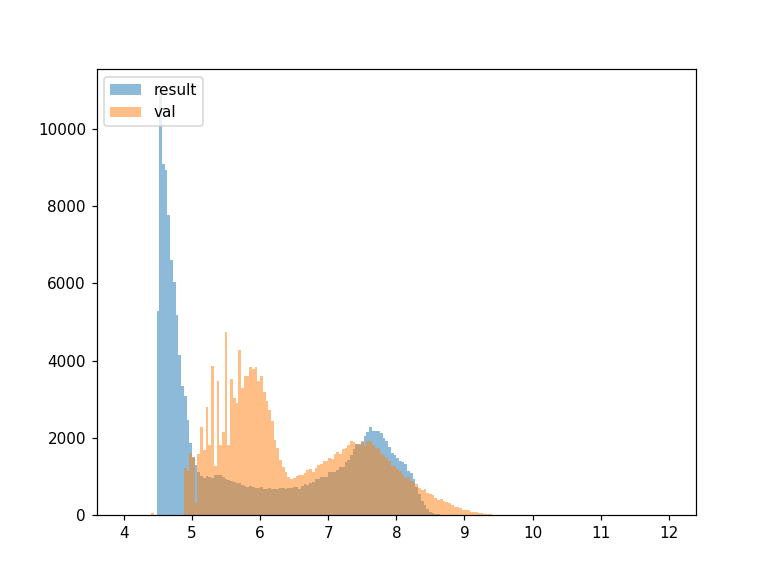

<IPython.core.display.Javascript object>


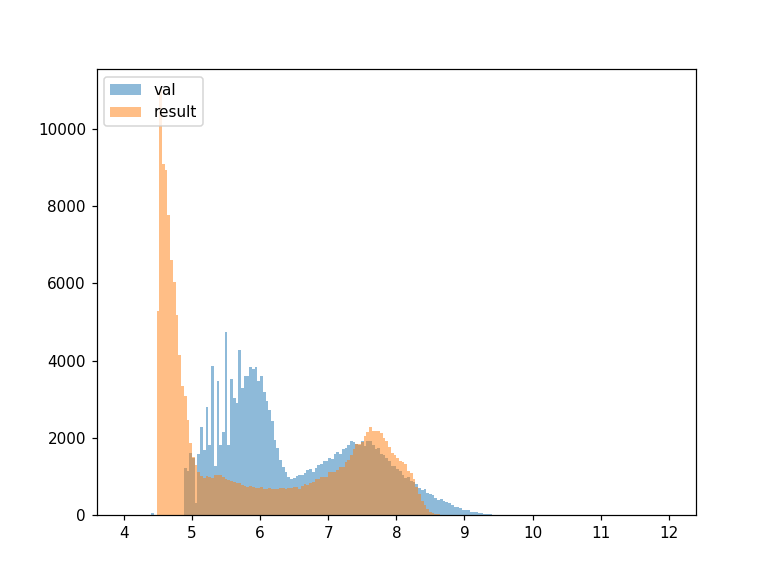

<IPython.core.display.Javascript object>


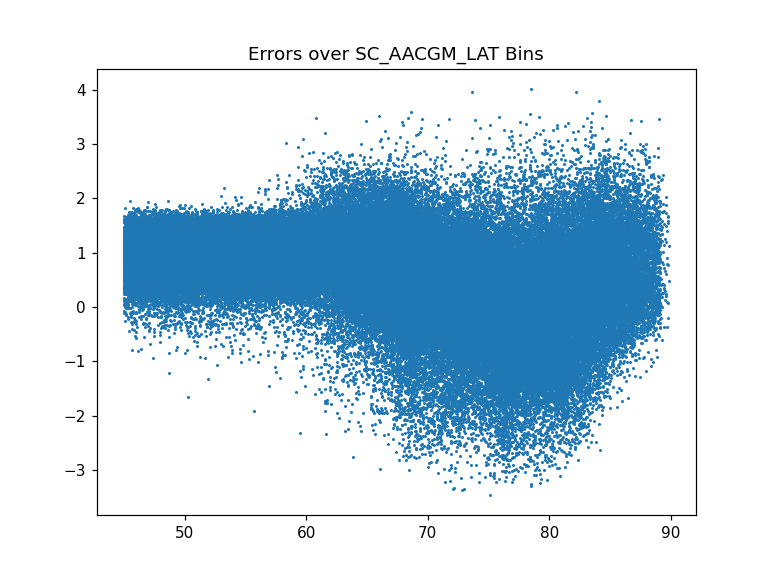

<IPython.core.display.Javascript object>


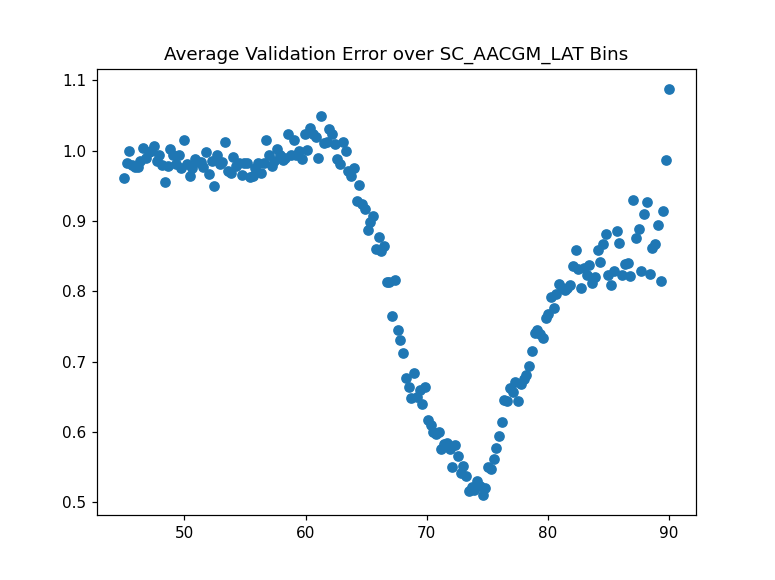

<IPython.core.display.Javascript object>


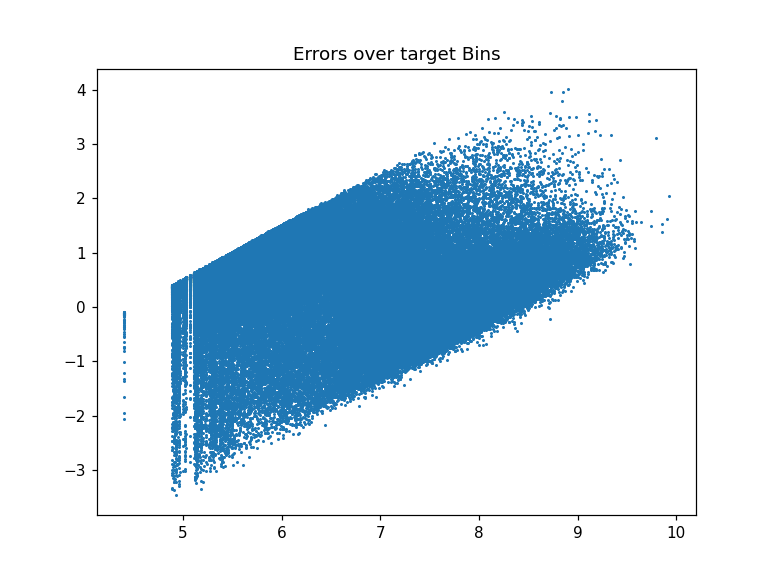

<IPython.core.display.Javascript object>


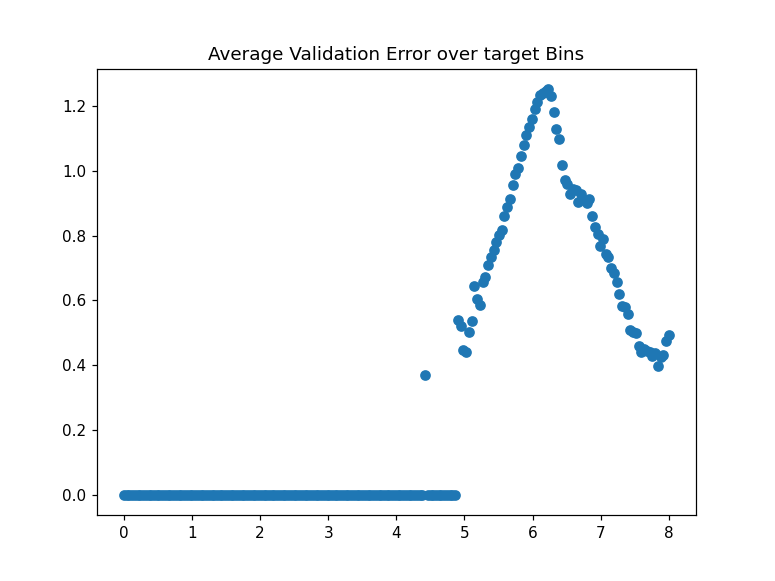

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [47]:
import matplotlib.colors as mcolors
gamma = 0.2#[0.8, 0.5, 0.3]
errors= y_val_log.values-df_results.values
print(y_val_log.values.shape, errors.shape)

plt.figure();
plt.hist2d(y_val_log.values[:,0], errors[:,0],
              bins=50, norm=mcolors.PowerNorm(gamma))
plt.colorbar()
plt.title('Error Density')
plt.xlabel('log10(y_true)')
plt.ylabel('log10(y_true-y_pred)')

plt.show()

import matplotlib.colors as mcolors
gamma = 0.2#[0.8, 0.5, 0.3]
errors= y_val_log.values-df_results.values
print(y_val_log.values.shape, errors.shape)

plt.figure();
plt.hist2d(y_val_log.values[:,0], errors[:,0],
              bins=50, norm=mcolors.PowerNorm(gamma))
plt.colorbar()
plt.title('Error Density')
plt.xlabel('log10(y_true)')
plt.ylabel('log10(y_true-y_pred)')

plt.show()

plt.figure()
plt.plot(y_val_log[:])
plt.plot(df_results[:])
plt.legend(['val', 'result'], loc='upper left')
plt.show()


plt.figure()
plt.plot(10**y_val_log[:]*1.6e-6)
plt.plot(10**df_results[:]*1.6e-6)
plt.legend(['val', 'result'], loc='upper left')
plt.show()

plt.figure()
plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
plt.legend(['val', 'result'], loc='upper left')
plt.show()


minr = 4 #np.min(y_val_log.values)
maxr = 12 #np.max(y_val_log.values)
plt.figure()
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['result','val'], loc='upper left')
plt.show()

plt.figure()
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['val', 'result'], loc='upper left')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
plt.title('Errors over SC_AACGM_LAT Bins')


import math
bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
    if not (math.isnan(i)):
        i = int(i)
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/bin_total
plt.figure()
plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
plt.title('Average Validation Error over SC_AACGM_LAT Bins')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(y_val_log.values,errors,s=1)
plt.title('Errors over target Bins')

bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((y_val_log.values[j]-0)/((8-0)/200))
    if not (math.isnan(i)):
        i = int(i)
        if (i < 200) and(i > 0):
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/(bin_total+.00001)
plt.figure()
plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
plt.title('Average Validation Error over target Bins')    
plt.show()

y_val_log = temp

0


<IPython.core.display.Javascript object>


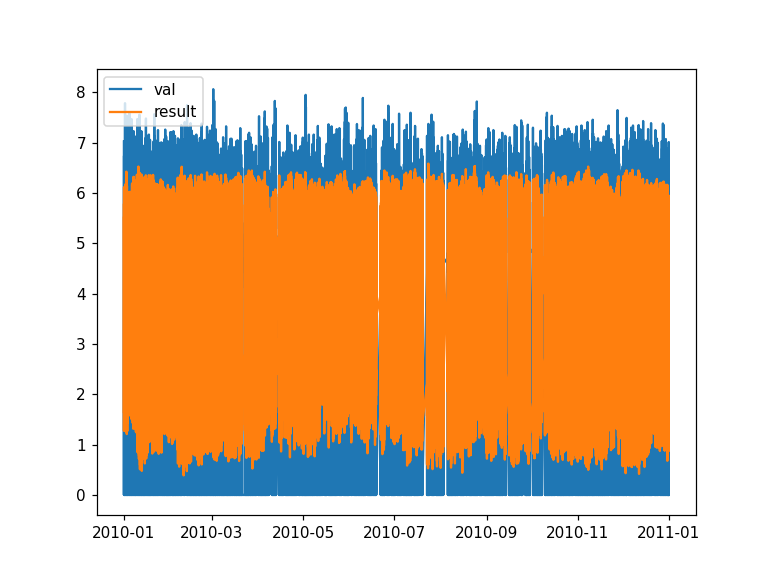

<IPython.core.display.Javascript object>


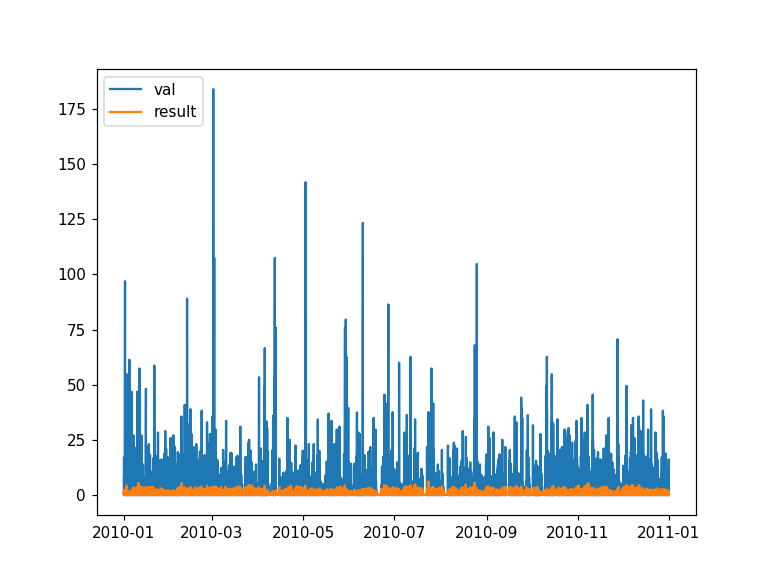

<IPython.core.display.Javascript object>


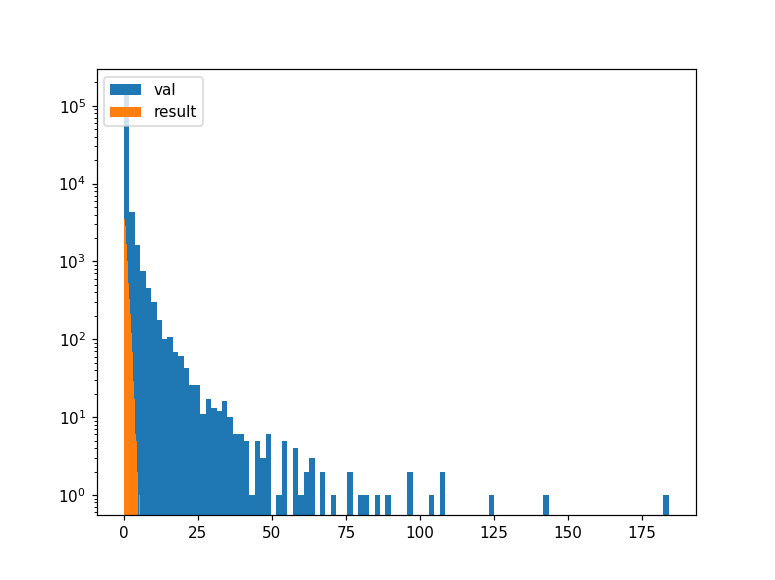

<IPython.core.display.Javascript object>


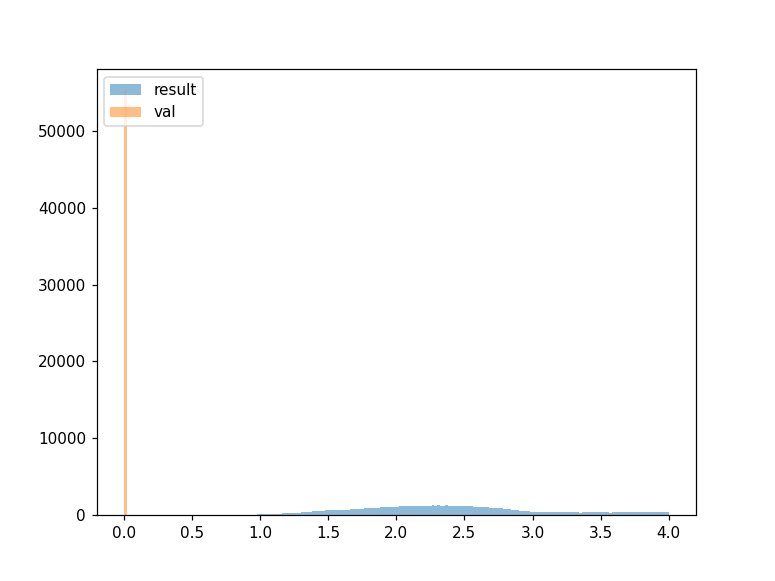

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>

1


<IPython.core.display.Javascript object>


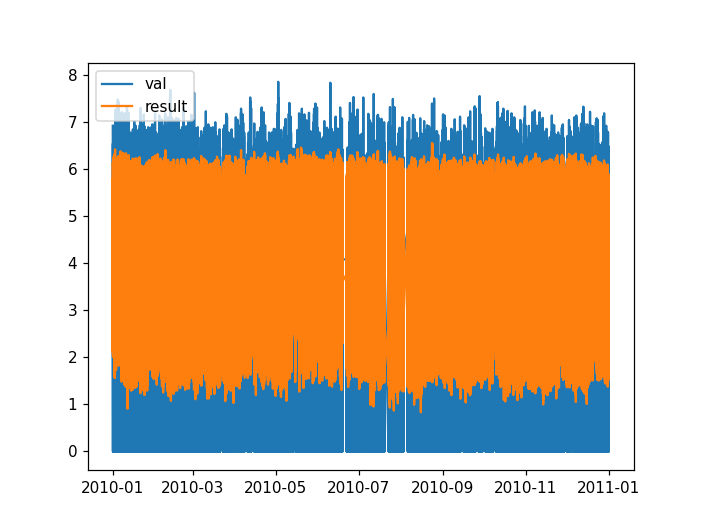

<IPython.core.display.Javascript object>


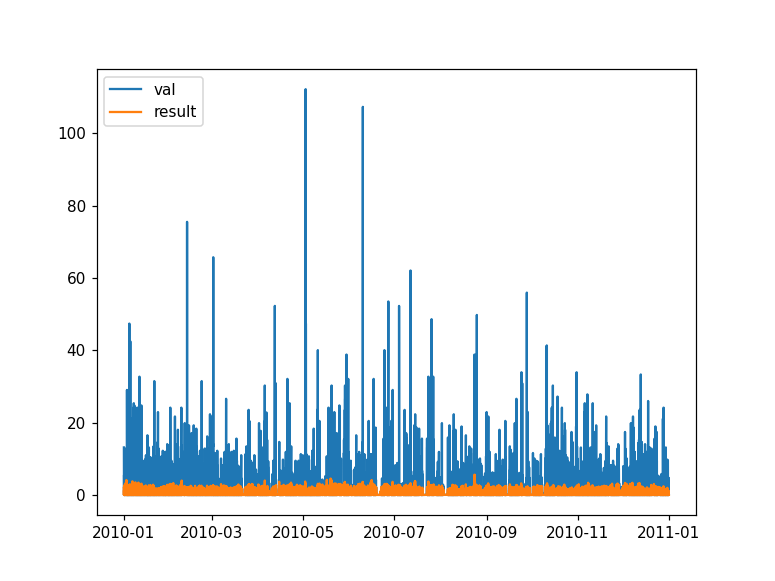

<IPython.core.display.Javascript object>


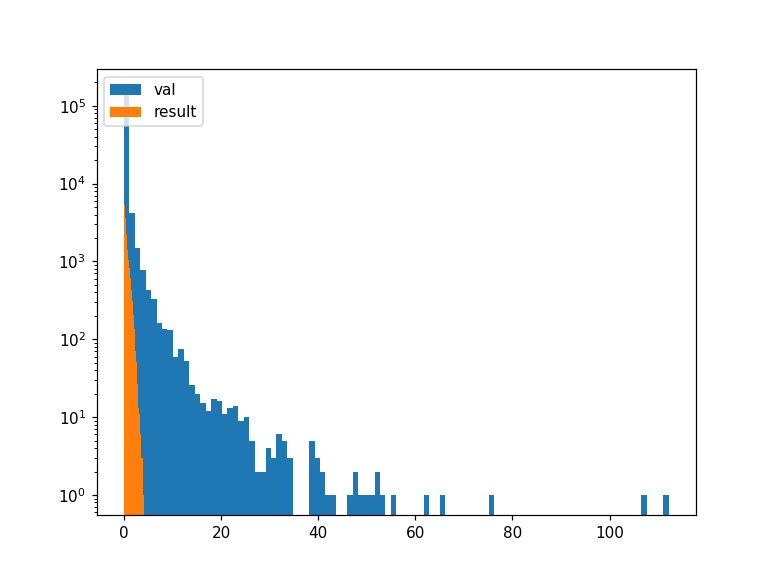

<IPython.core.display.Javascript object>


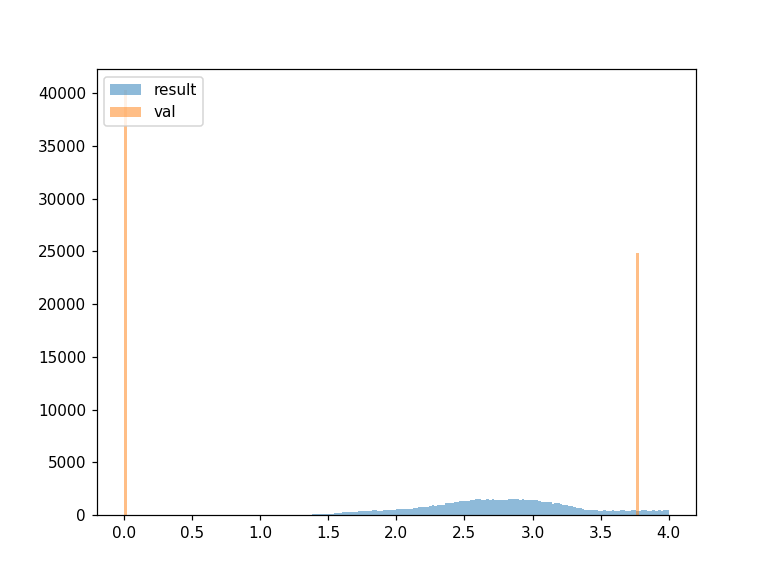

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


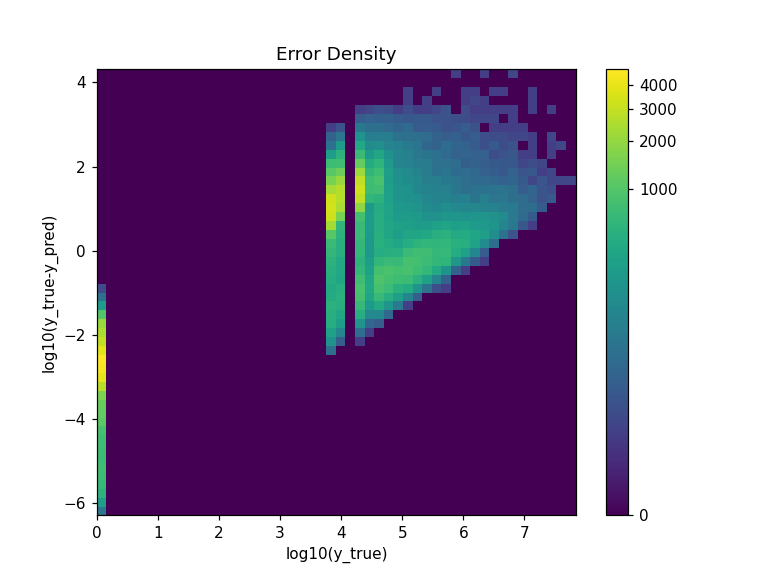

2


<IPython.core.display.Javascript object>


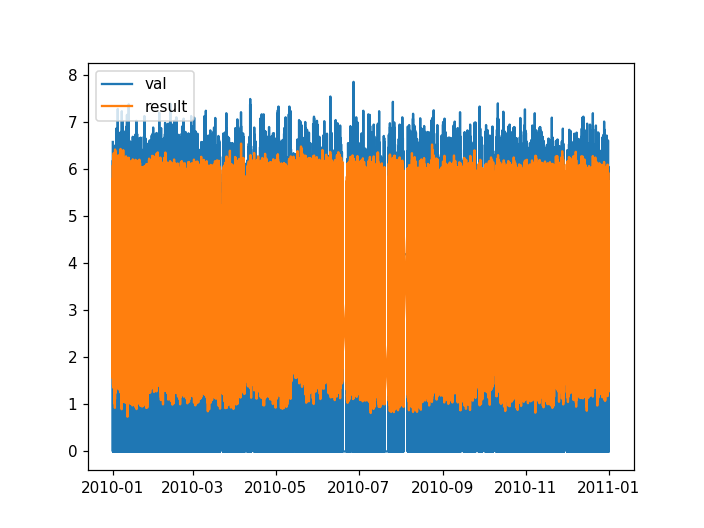

<IPython.core.display.Javascript object>


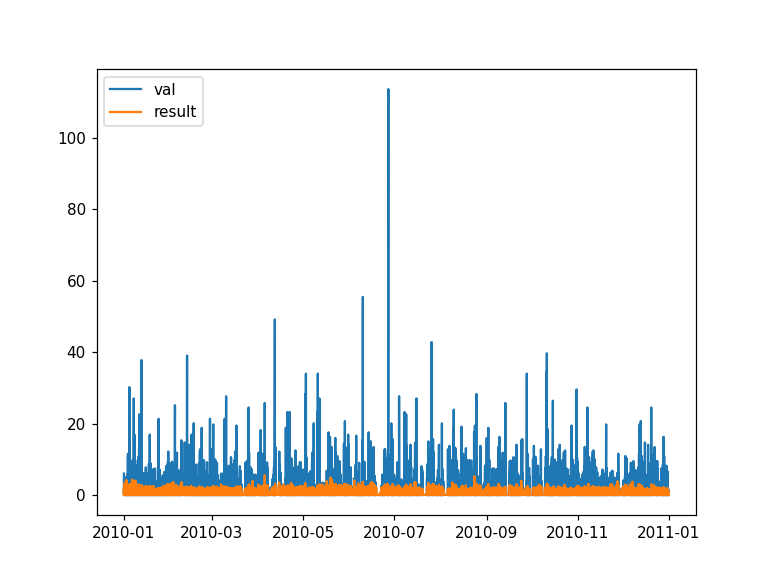

<IPython.core.display.Javascript object>


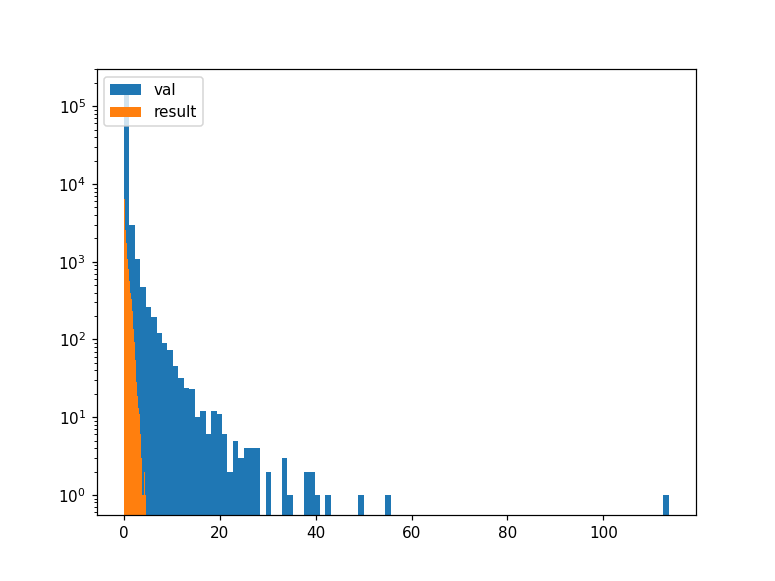

<IPython.core.display.Javascript object>

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


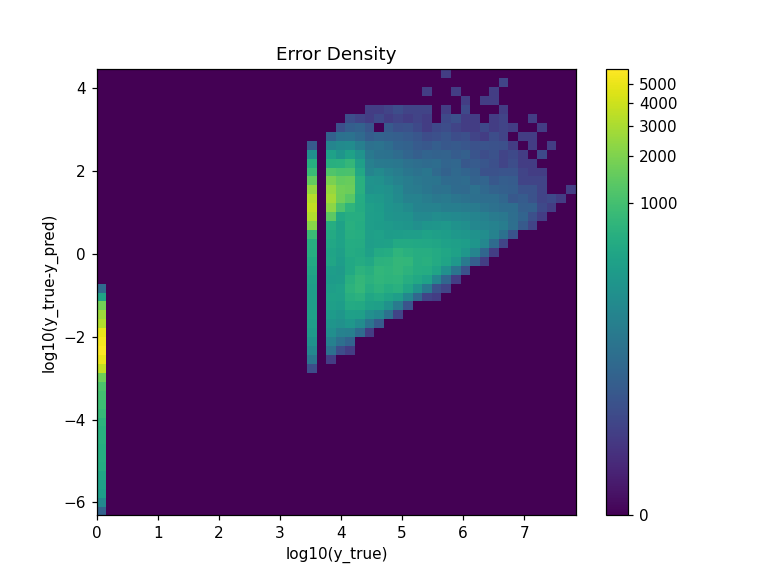

3


<IPython.core.display.Javascript object>


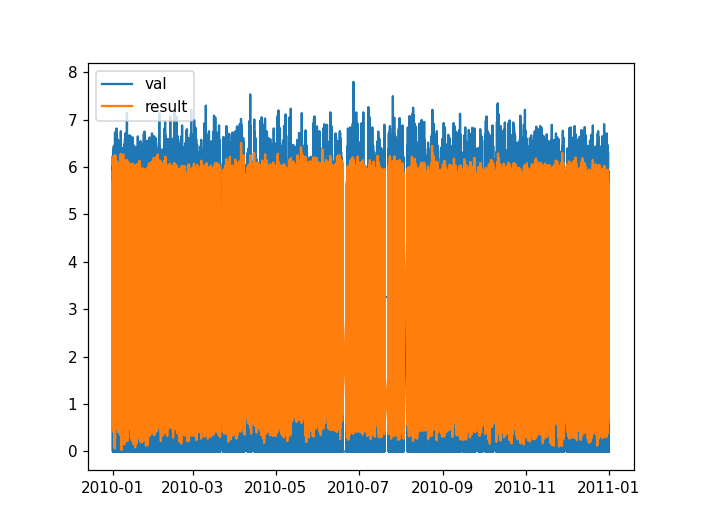

<IPython.core.display.Javascript object>


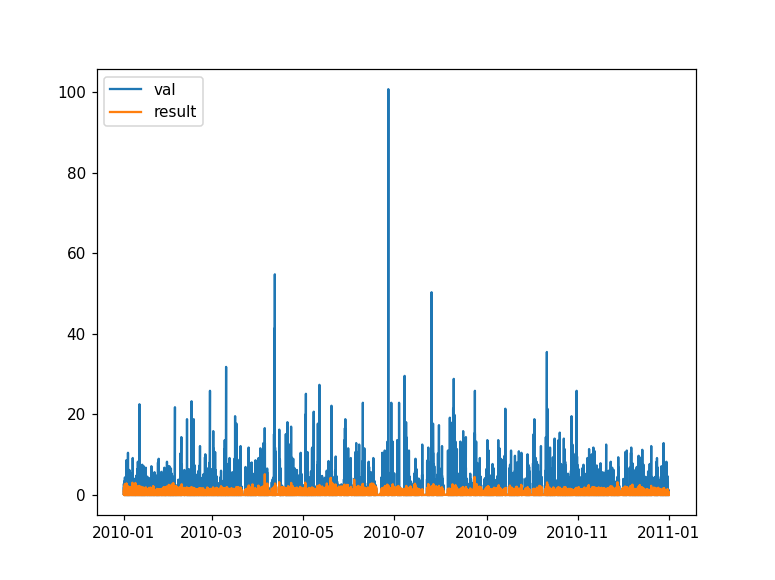

<IPython.core.display.Javascript object>


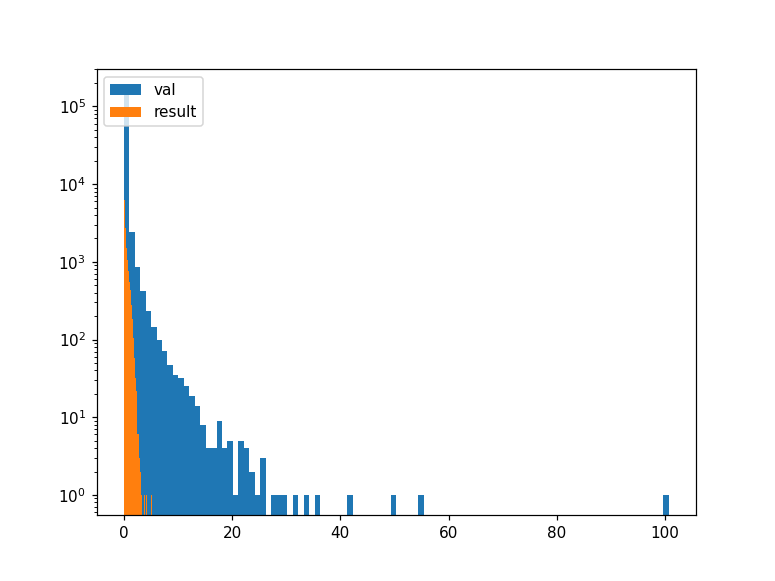

<IPython.core.display.Javascript object>


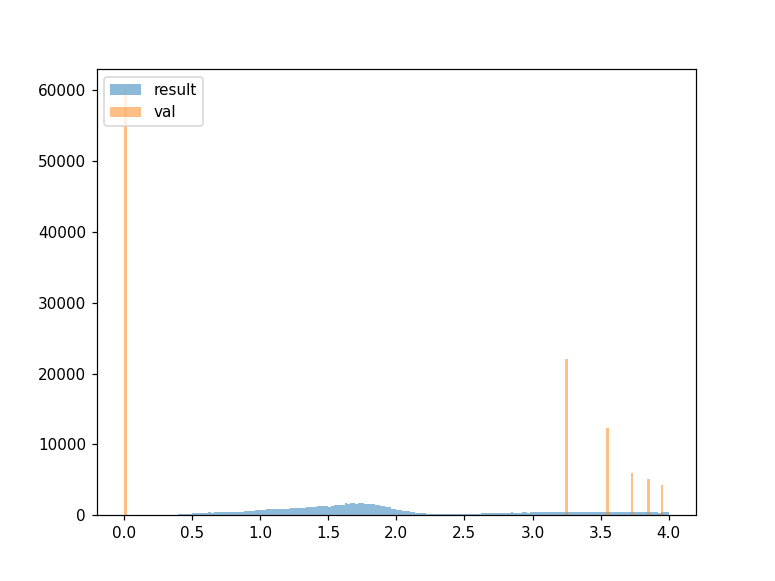

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>


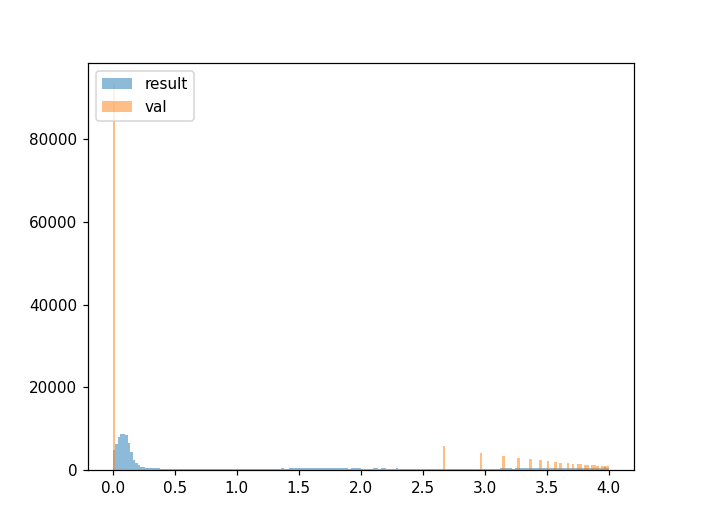

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


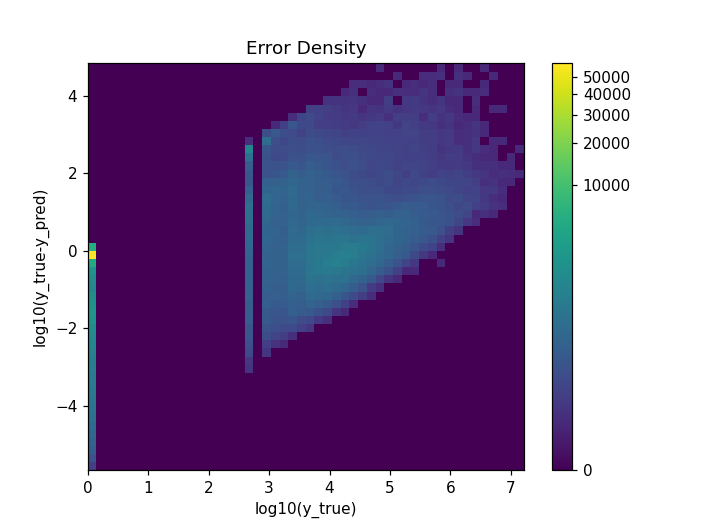

7


<IPython.core.display.Javascript object>


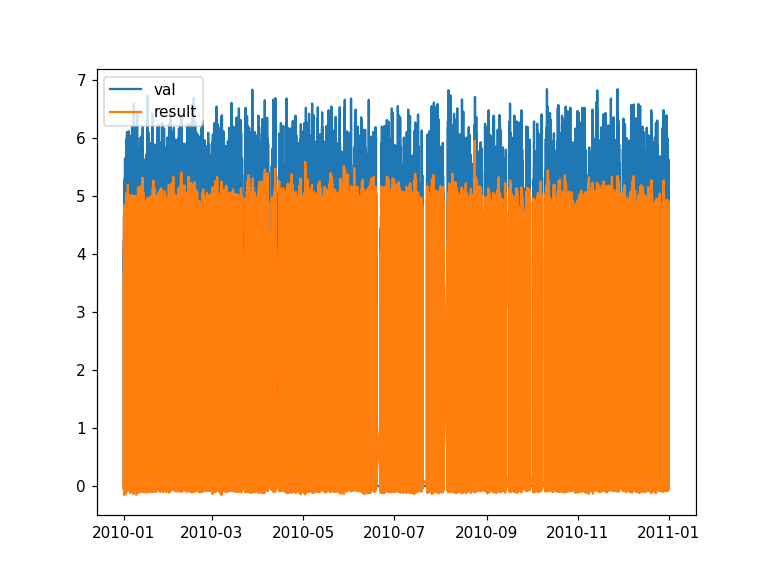

<IPython.core.display.Javascript object>


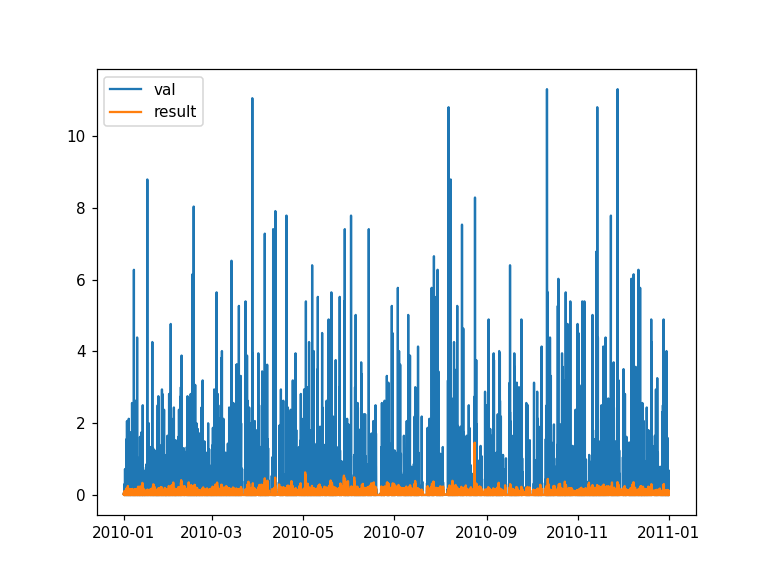

<IPython.core.display.Javascript object>


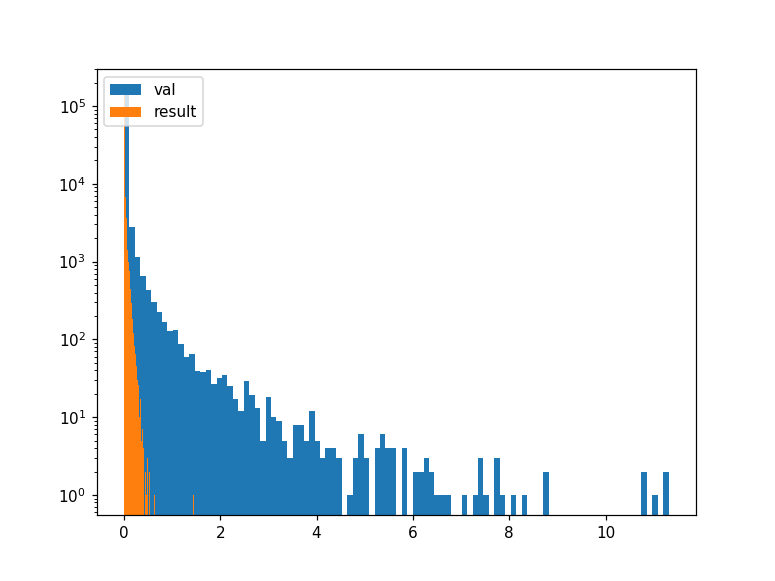

<IPython.core.display.Javascript object>


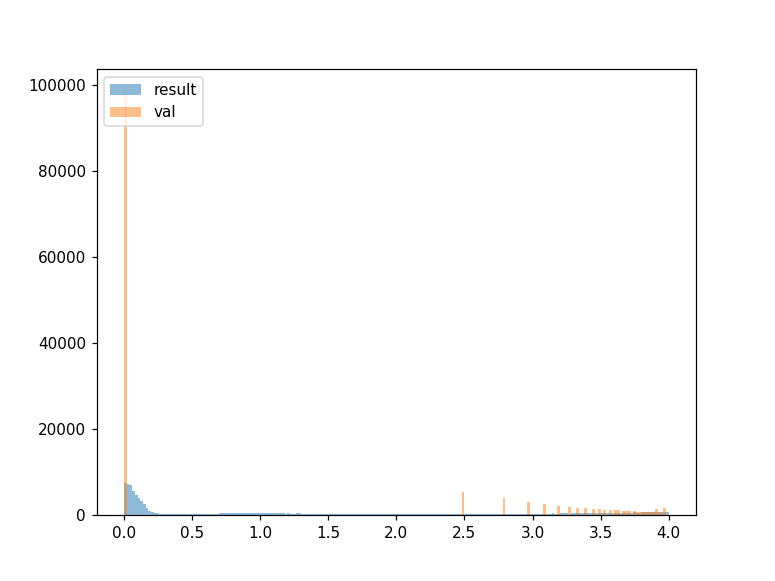

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>

8


<IPython.core.display.Javascript object>


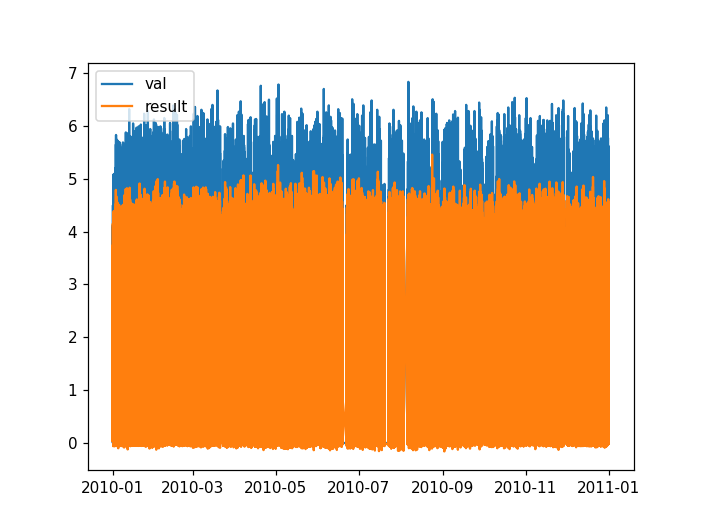

<IPython.core.display.Javascript object>


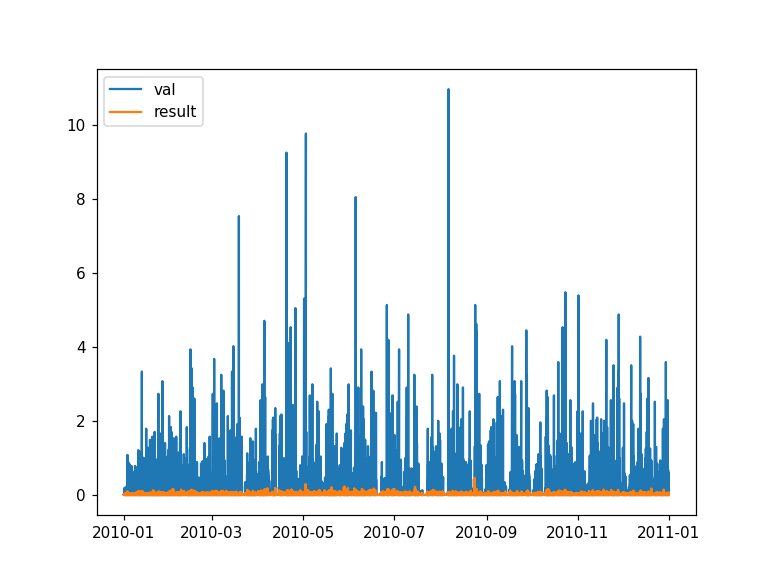

<IPython.core.display.Javascript object>


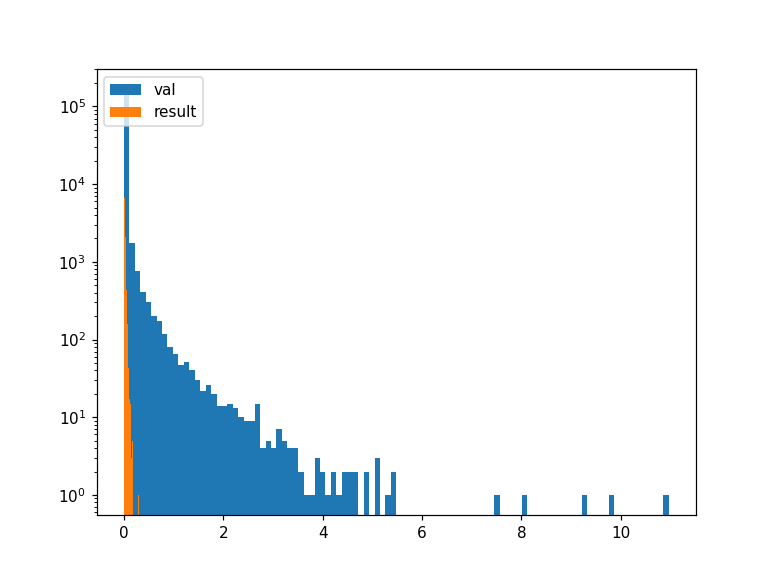

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>


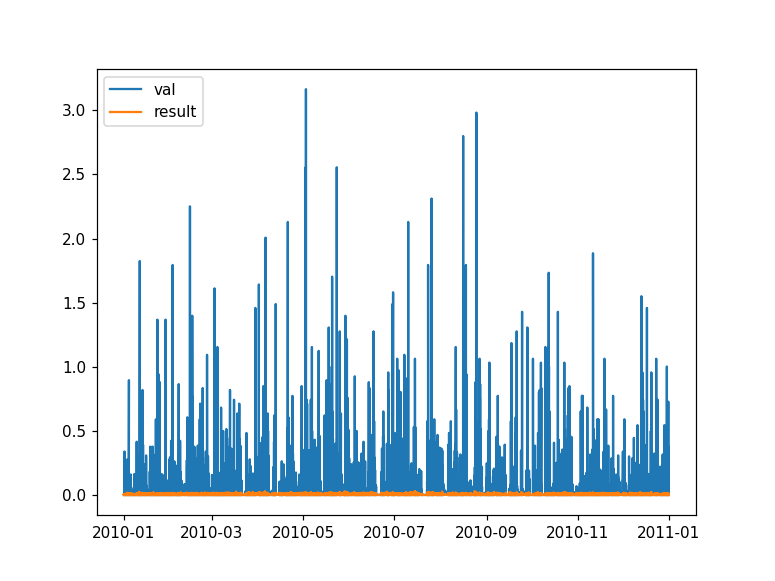

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>

12


<IPython.core.display.Javascript object>


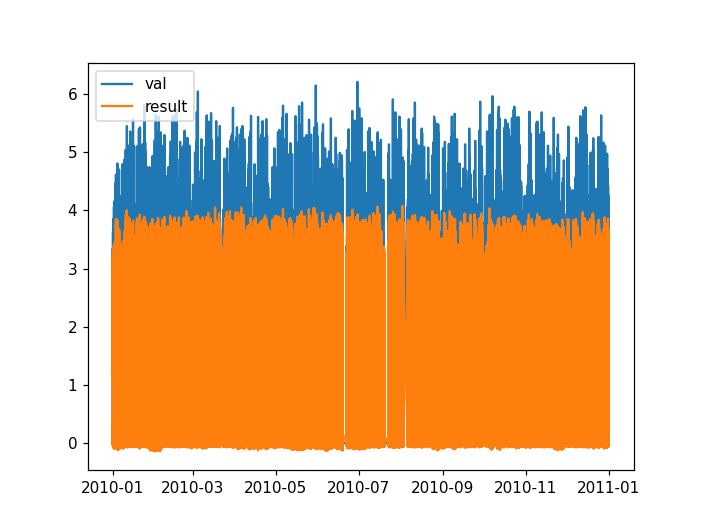

<IPython.core.display.Javascript object>


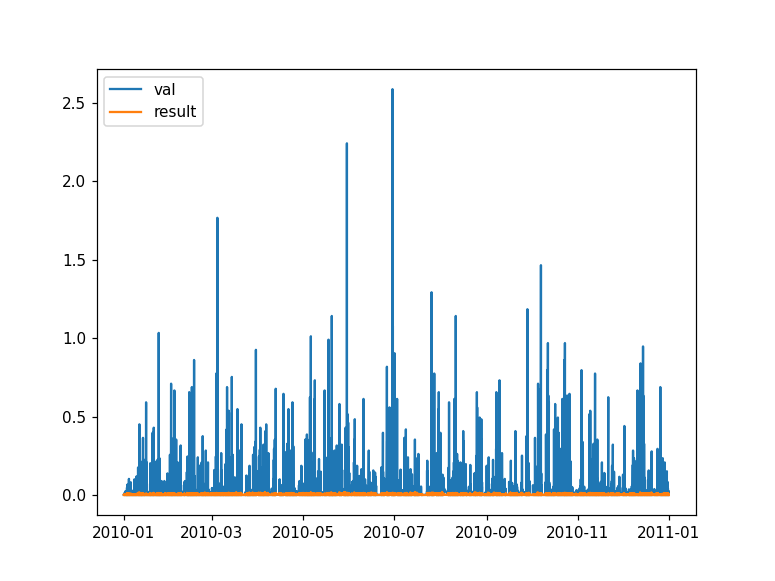

<IPython.core.display.Javascript object>


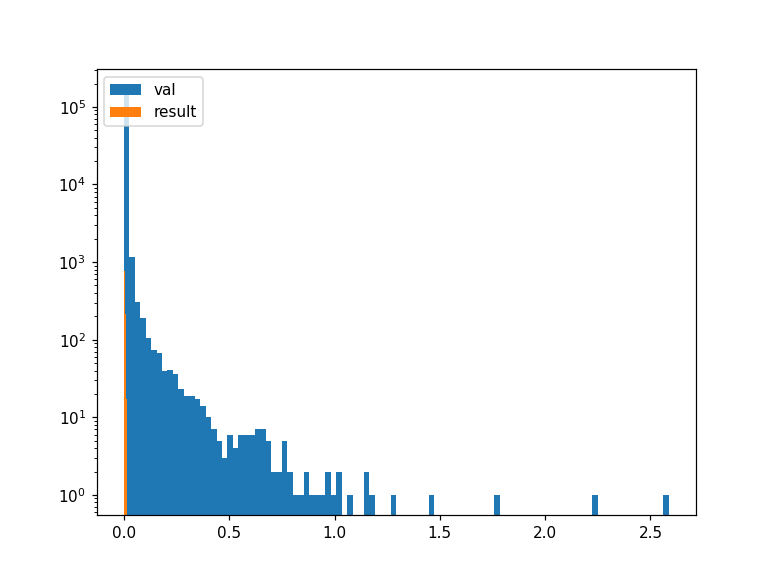

<IPython.core.display.Javascript object>


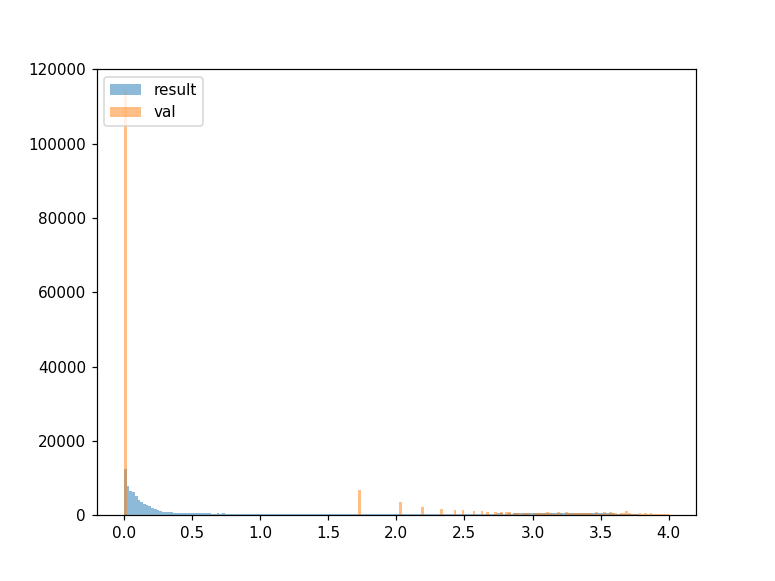

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


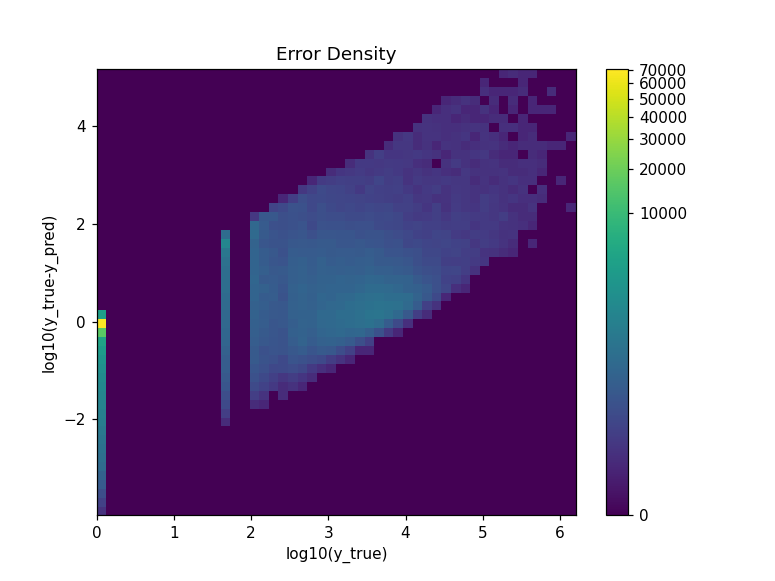

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>


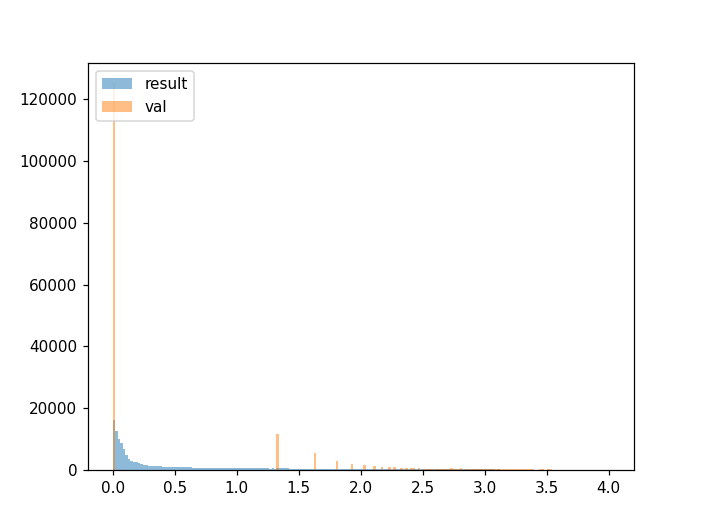

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>


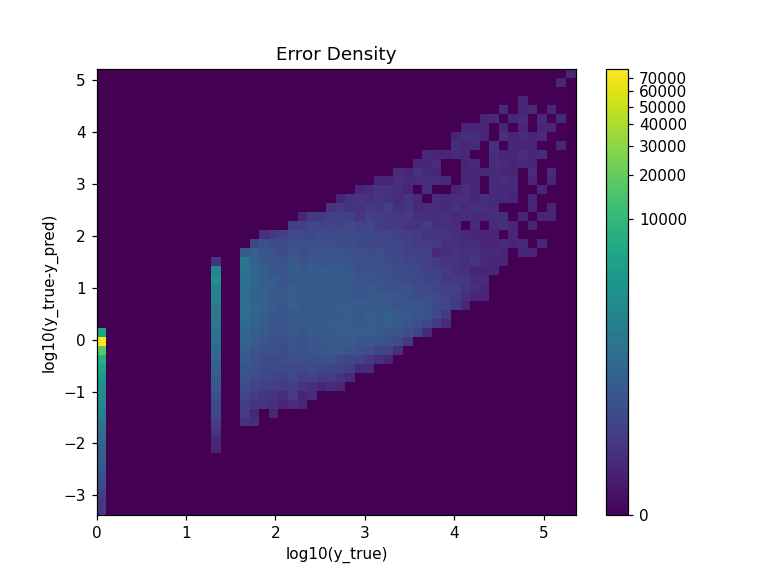

16


<IPython.core.display.Javascript object>


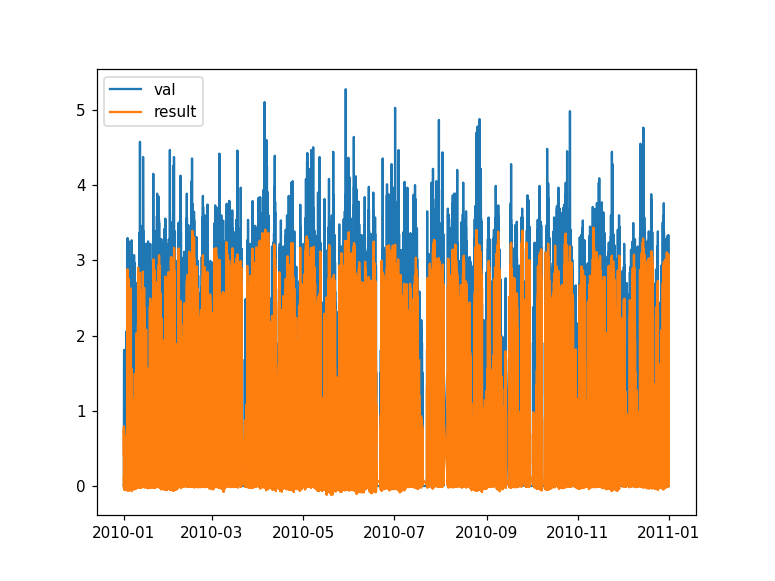

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


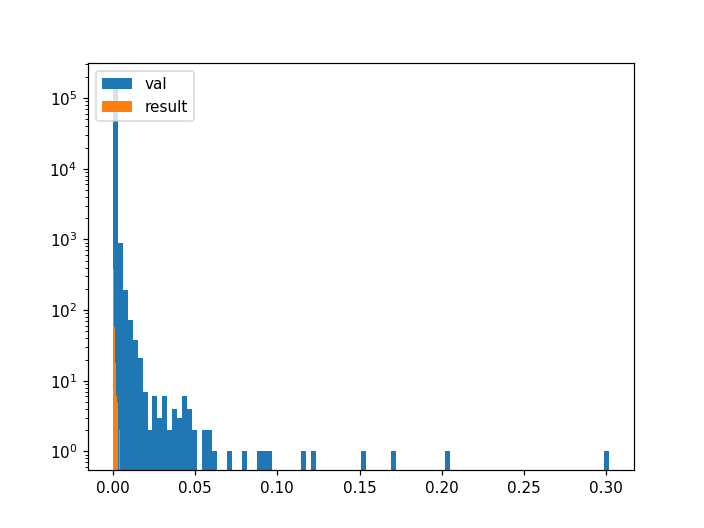

<IPython.core.display.Javascript object>

(171410, 1) (171410, 1)


<IPython.core.display.Javascript object>

17


<IPython.core.display.Javascript object>


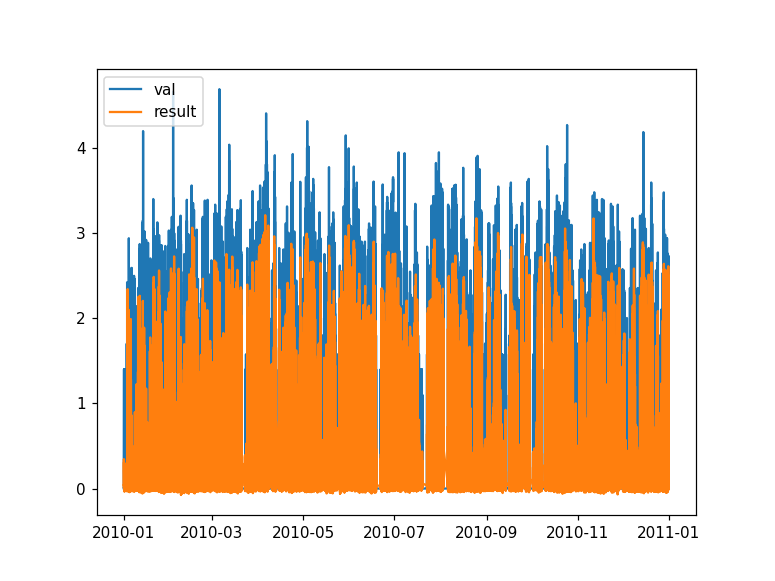

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [48]:
results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

model_3 = df_results
for k in range(0,19):
    print(k)
    df_results = pd.DataFrame(data=results[:,k], index = df_val.index)
    y_val_log = pd.DataFrame(data=temp.values[:,k], index = df_val.index)


    plt.figure()
    plt.plot(y_val_log[:])
    plt.plot(df_results[:])
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6)
    plt.plot(10**df_results[:]*1.6e-6)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = 0 #np.min(y_val_log.values)
    maxr = 4 #np.max(y_val_log.values)
    plt.figure()
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()

    gamma = 0.2#[0.8, 0.5, 0.3]
    errors= y_val_log.values-df_results.values
    print(y_val_log.values.shape, errors.shape)

    plt.figure();
    plt.hist2d(y_val_log.values[:,0], errors[:,0],
                  bins=50, norm=mcolors.PowerNorm(gamma))
    plt.colorbar()
    plt.title('Error Density')
    plt.xlabel('log10(y_true)')
    plt.ylabel('log10(y_true-y_pred)')

    plt.show()


<IPython.core.display.Javascript object>


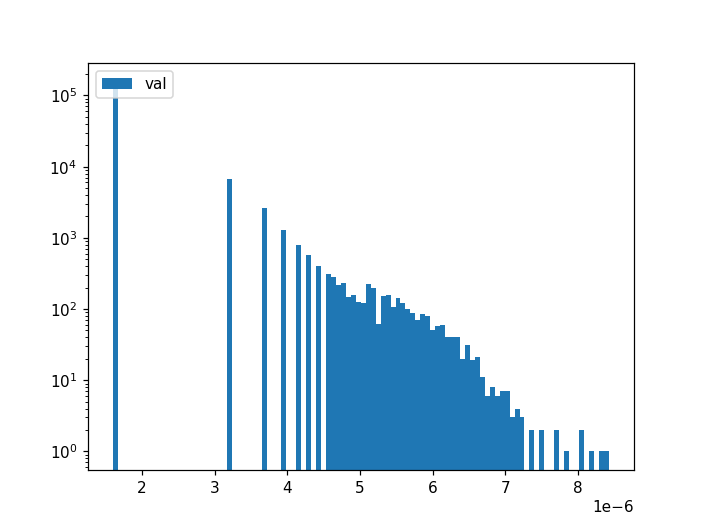

<IPython.core.display.Javascript object>


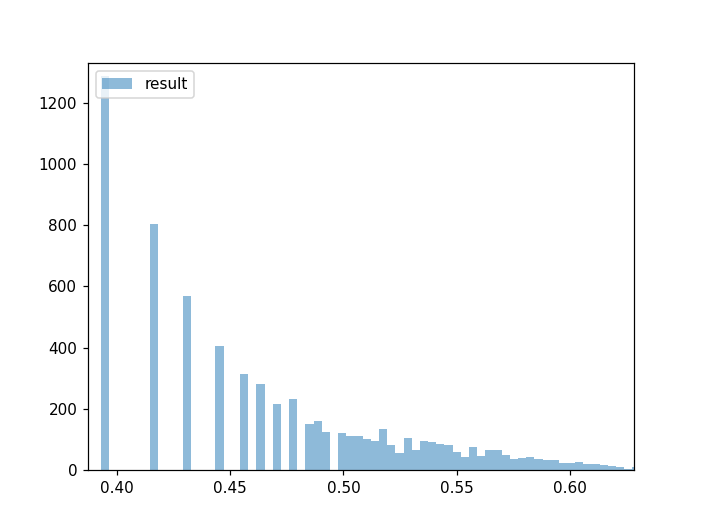

<IPython.core.display.Javascript object>


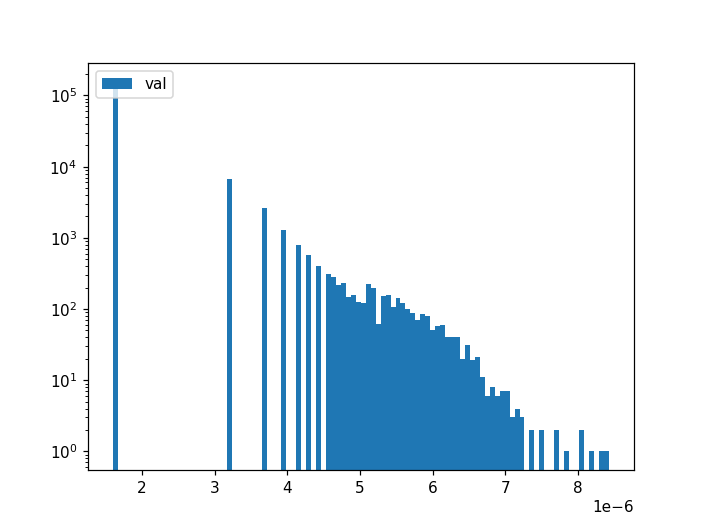

<IPython.core.display.Javascript object>


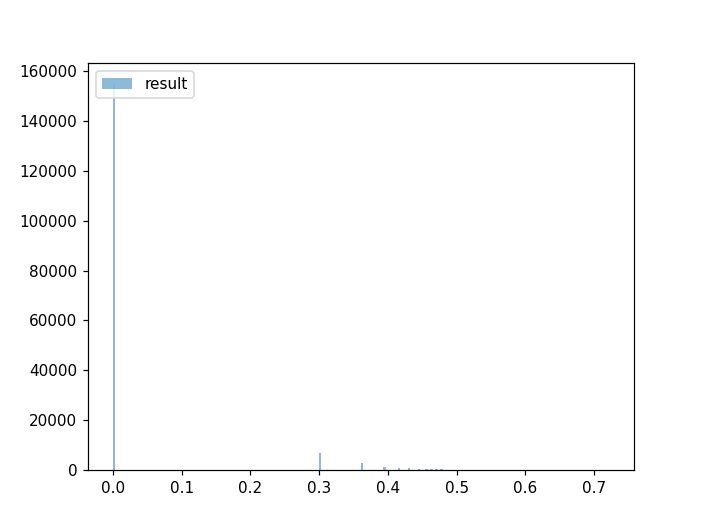

<IPython.core.display.Javascript object>


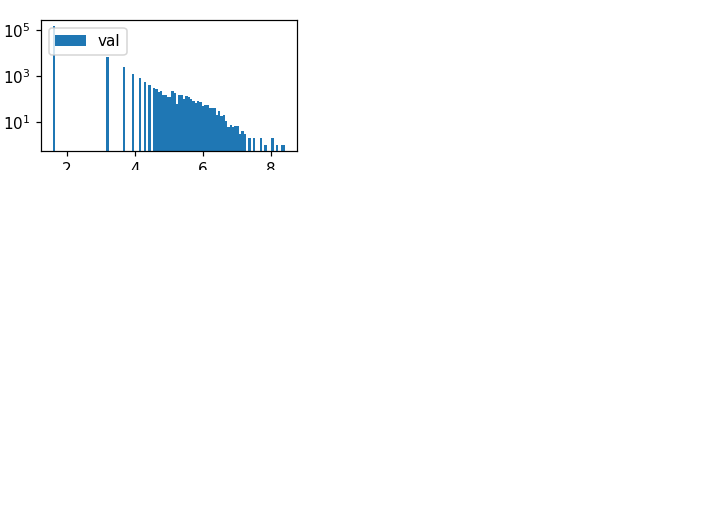

<IPython.core.display.Javascript object>


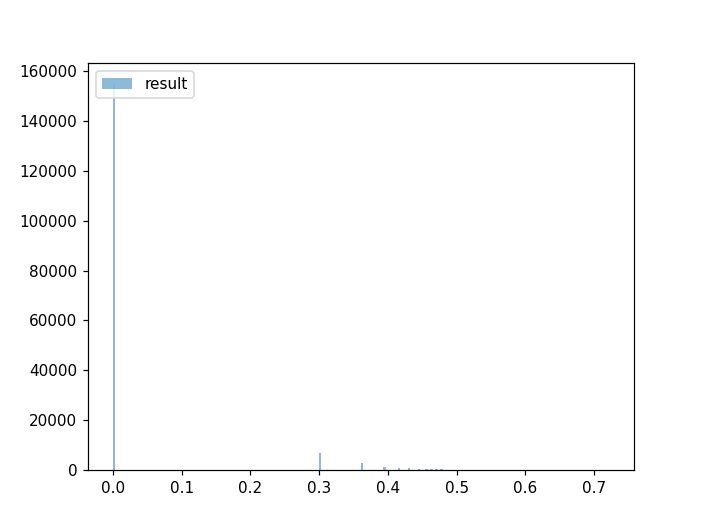

<IPython.core.display.Javascript object>


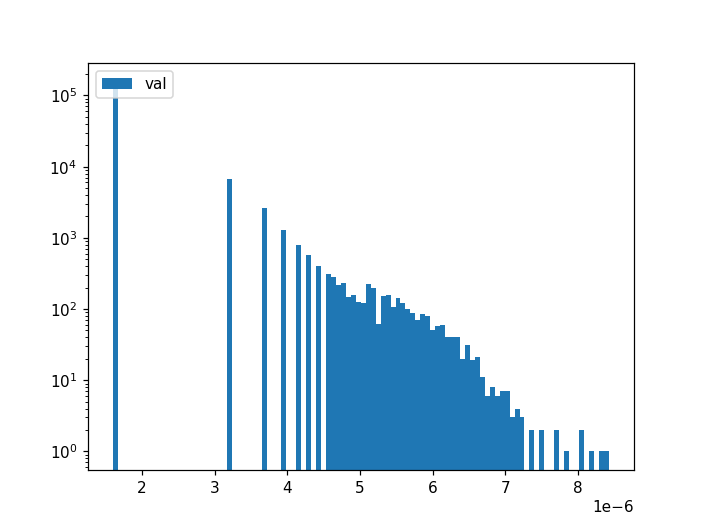

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>


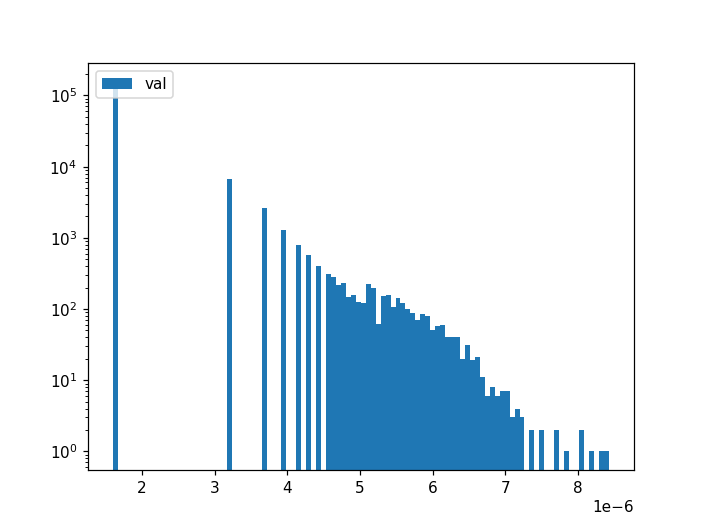

<IPython.core.display.Javascript object>


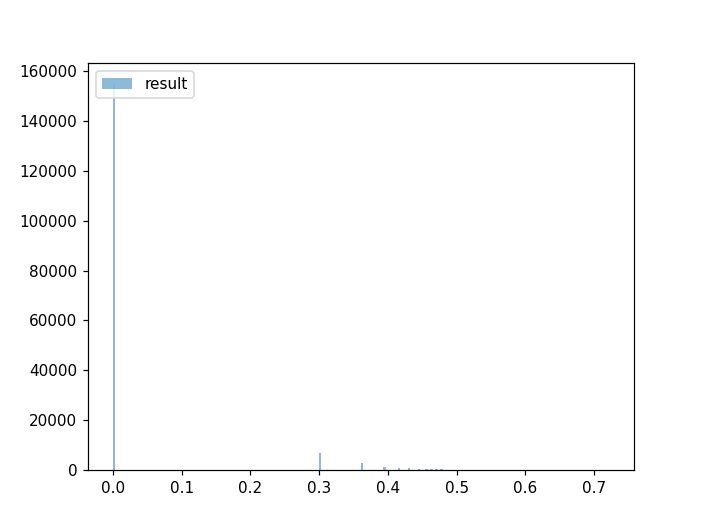

<IPython.core.display.Javascript object>


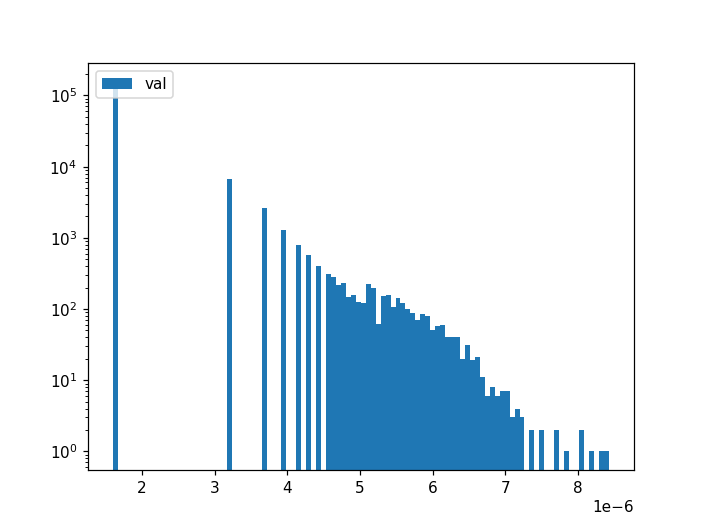

<IPython.core.display.Javascript object>


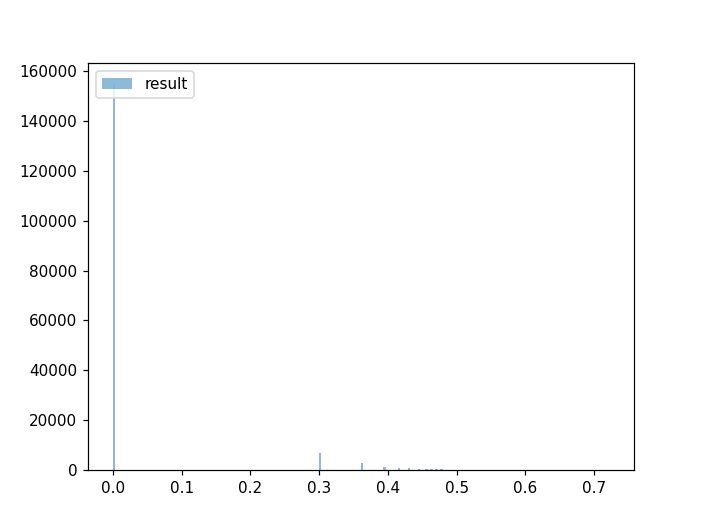

<IPython.core.display.Javascript object>


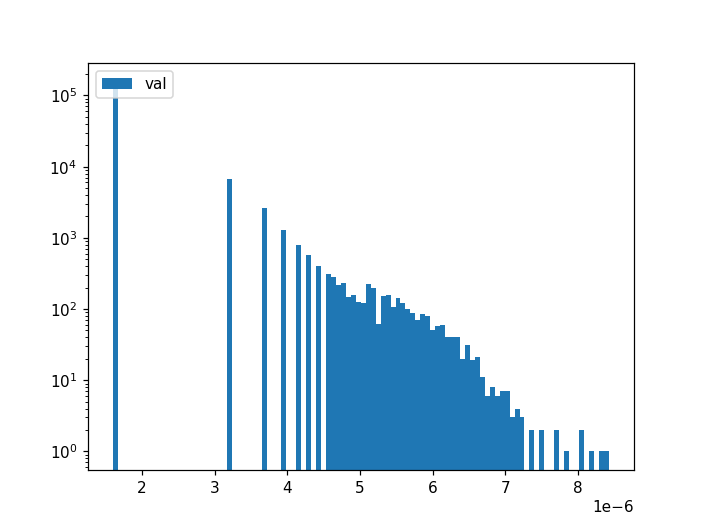

<IPython.core.display.Javascript object>


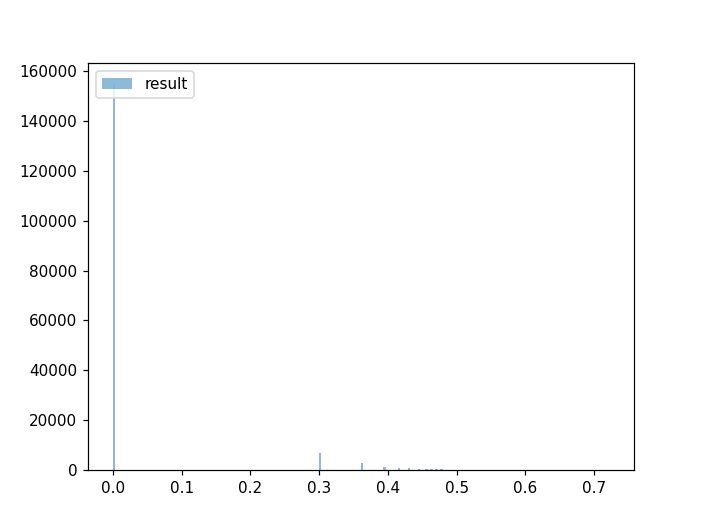

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>


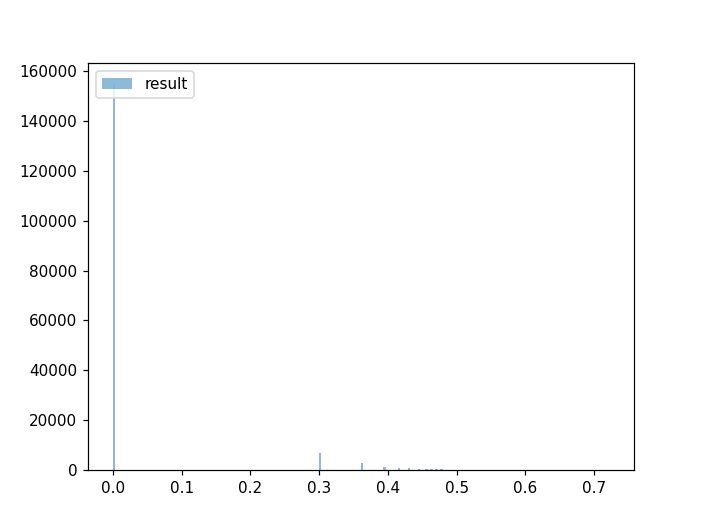

<IPython.core.display.Javascript object>


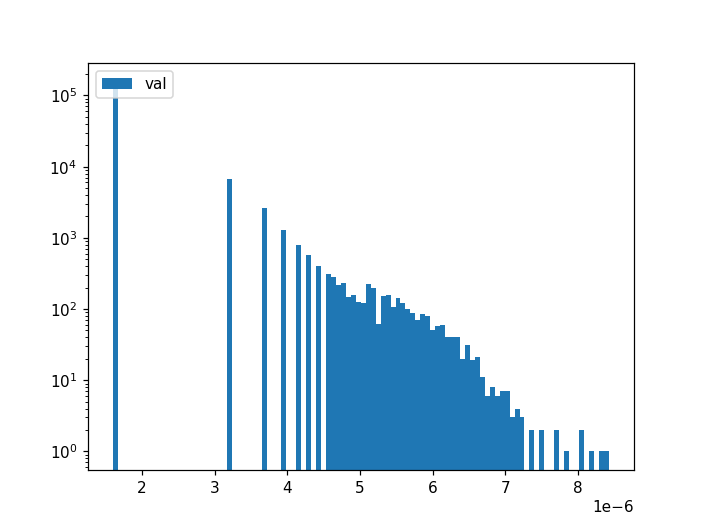

<IPython.core.display.Javascript object>


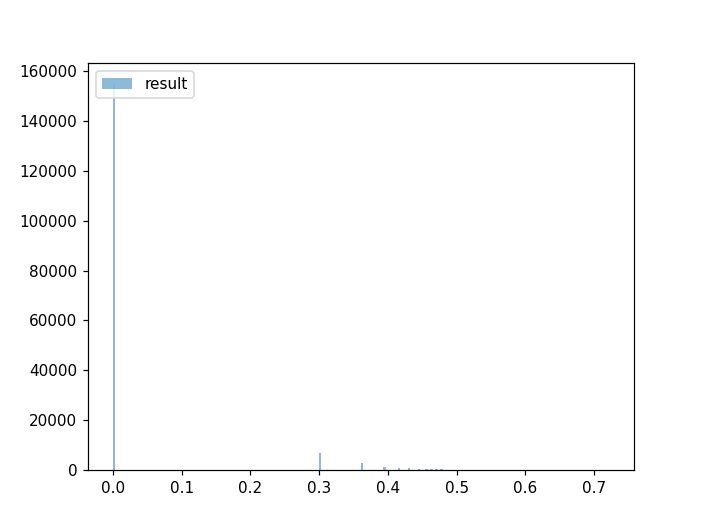

<IPython.core.display.Javascript object>


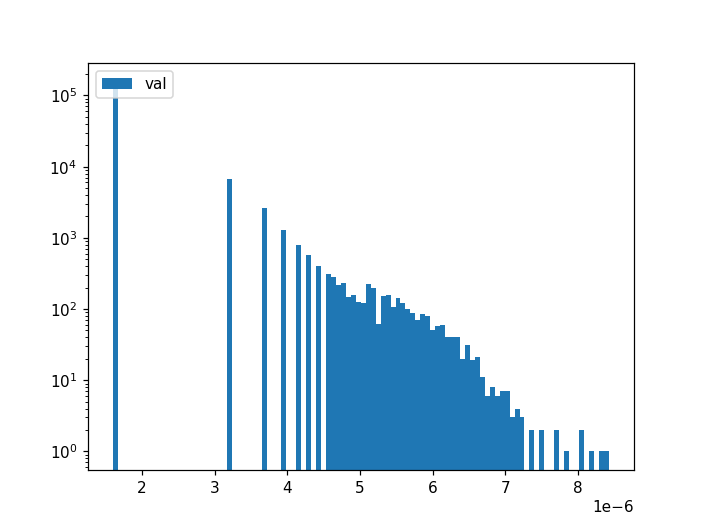

<IPython.core.display.Javascript object>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [52]:


for k in range(0,19):



    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = np.min(y_val_log.values)
    maxr = np.max(y_val_log.values)
    plt.figure()

    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()


    plt.show()

In [39]:
filename='channel_counts_tail_loss_new_pipeline_33'
# model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

with open ('scalar_X_33_channel_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_channel_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)



5357/5357 [==============================] - 9s 2ms/step - loss: 5.4439 - mean_squared_error: 5.4439
[5.44386100769043, 5.4438605308532715]


In [40]:
from tensorflow.keras.layers import Input
num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(64, activation='relu')(model1)
#model1 = Dense(4, activation='relu')(model1)
model1 = Dense(19, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=1000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

Model: "functional_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 33)]              0         
_________________________________________________________________
dense_87 (Dense)             (None, 256)               8704      
_________________________________________________________________
dropout_10 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_88 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_89 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_90 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_91 (Dense)             (None, 1024)            

196/196 - 5s - loss: 1.4273 - mse: 1.4273 - val_loss: 4.5455 - val_mse: 4.5455
Epoch 72/1000
196/196 - 5s - loss: 1.4269 - mse: 1.4269 - val_loss: 4.0821 - val_mse: 4.0821
Epoch 73/1000
196/196 - 5s - loss: 1.4272 - mse: 1.4272 - val_loss: 4.4119 - val_mse: 4.4119
Epoch 74/1000
196/196 - 5s - loss: 1.4266 - mse: 1.4266 - val_loss: 4.4110 - val_mse: 4.4110
Epoch 75/1000
196/196 - 5s - loss: 1.4263 - mse: 1.4263 - val_loss: 4.2270 - val_mse: 4.2270
Epoch 76/1000
196/196 - 5s - loss: 1.4258 - mse: 1.4258 - val_loss: 4.0639 - val_mse: 4.0639


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [41]:
results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

model_3 = df_results

In [42]:
ch_energies = np.array([30000.0,20400.0,13900.0,9450.0,6460.0,4400.0,3000.0,2040.0,
                        1392.0,949.0,646.0,440.0,300.0,204.0,139.0,95.0,65.0,44.0,30.0])
ch_energies = np.flip((ch_energies[:]))
#need to fix this latter to add first channel back in
ELE_TOTAL_COUNTS = 10**(df_results.values[:,0])*(ch_energies[1]-ch_energies[0])
+ 10**(df_results.values[:,18])*(ch_energies[18]-ch_energies[17])
for i in range(1,18):
    ELE_TOTAL_COUNTS = ELE_TOTAL_COUNTS +     10**(df_results.values[:,i])*(ch_energies[i+1]-ch_energies[i-1])/2.
ELE_TOTAL_COUNTS= pd.DataFrame(data=np.log10(np.reshape(ELE_TOTAL_COUNTS,(ELE_TOTAL_COUNTS.shape[0])) ), index = df_val.index)
    
ELE_TOTAL_COUNTS_val = 10**(y_val_log.values[:,0])*(ch_energies[1]-ch_energies[0])
+ 10**(y_val_log.values[:,18])*(ch_energies[18]-ch_energies[17])
for i in range(1,18):
    ELE_TOTAL_COUNTS_val = ELE_TOTAL_COUNTS_val +     10**(y_val_log.values[:,i])*(ch_energies[i+1]-ch_energies[i-1])/2.
    
temp = y_val_log
y_val_log = pd.DataFrame(data=np.log10(np.reshape(ELE_TOTAL_COUNTS_val,(ELE_TOTAL_COUNTS_val.shape[0]) )), index = df_val.index)

df_results = ELE_TOTAL_COUNTS

IndexError: index 18 is out of bounds for axis 1 with size 1

In [ ]:
import matplotlib.colors as mcolors
gamma = 0.2#[0.8, 0.5, 0.3]
errors= y_val_log.values-df_results.values
print(y_val_log.values.shape, errors.shape)

plt.figure();
plt.hist2d(y_val_log.values[:,0], errors[:,0],
              bins=50, norm=mcolors.PowerNorm(gamma))
plt.colorbar()
plt.title('Error Density')
plt.xlabel('log10(y_true)')
plt.ylabel('log10(y_true-y_pred)')

plt.show()

In [ ]:
import matplotlib.colors as mcolors
gamma = 0.2#[0.8, 0.5, 0.3]
errors= y_val_log.values-df_results.values
print(y_val_log.values.shape, errors.shape)

plt.figure();
plt.hist2d(y_val_log.values[:,0], errors[:,0],
              bins=50, norm=mcolors.PowerNorm(gamma))
plt.colorbar()
plt.title('Error Density')
plt.xlabel('log10(y_true)')
plt.ylabel('log10(y_true-y_pred)')

plt.show()

plt.figure()
plt.plot(y_val_log[:])
plt.plot(df_results[:])
plt.legend(['val', 'result'], loc='upper left')
plt.show()


plt.figure()
plt.plot(10**y_val_log[:]*1.6e-6)
plt.plot(10**df_results[:]*1.6e-6)
plt.legend(['val', 'result'], loc='upper left')
plt.show()

plt.figure()
plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
plt.legend(['val', 'result'], loc='upper left')
plt.show()


minr = 4 #np.min(y_val_log.values)
maxr = 8 #np.max(y_val_log.values)
plt.figure()
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['result','val'], loc='upper left')
plt.show()

plt.figure()
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['val', 'result'], loc='upper left')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
plt.title('Errors over SC_AACGM_LAT Bins')


import math
bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
    if not (math.isnan(i)):
        i = int(i)
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/bin_total
plt.figure()
plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
plt.title('Average Validation Error over SC_AACGM_LAT Bins')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(y_val_log.values,errors,s=1)
plt.title('Errors over target Bins')

bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((y_val_log.values[j]-0)/((8-0)/200))
    if not (math.isnan(i)):
        i = int(i)
        if (i < 200) and(i > 0):
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/(bin_total+.00001)
plt.figure()
plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
plt.title('Average Validation Error over target Bins')    
plt.show()

y_val_log = temp

In [ ]:
import matplotlib.colors as mcolors
gamma = 0.2#[0.8, 0.5, 0.3]
errors= y_val_log.values-df_results.values
print(y_val_log.values.shape, errors.shape)

plt.figure();
plt.hist2d(y_val_log.values[:,0], errors[:,0],
              bins=50, norm=mcolors.PowerNorm(gamma))
plt.colorbar()
plt.title('Error Density')
plt.xlabel('log10(y_true)')
plt.ylabel('log10(y_true-y_pred)')

plt.show()

plt.figure()
plt.plot(y_val_log[:])
plt.plot(df_results[:])
plt.legend(['val', 'result'], loc='upper left')
plt.show()


plt.figure()
plt.plot(10**y_val_log[:]*1.6e-6)
plt.plot(10**df_results[:]*1.6e-6)
plt.legend(['val', 'result'], loc='upper left')
plt.show()

plt.figure()
plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
plt.legend(['val', 'result'], loc='upper left')
plt.show()


minr = 4 #np.min(y_val_log.values)
maxr = 8 #np.max(y_val_log.values)
plt.figure()
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['result','val'], loc='upper left')
plt.show()

plt.figure()
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['val', 'result'], loc='upper left')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
plt.title('Errors over SC_AACGM_LAT Bins')


import math
bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
    if not (math.isnan(i)):
        i = int(i)
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/bin_total
plt.figure()
plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
plt.title('Average Validation Error over SC_AACGM_LAT Bins')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(y_val_log.values,errors,s=1)
plt.title('Errors over target Bins')

bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((y_val_log.values[j]-0)/((8-0)/200))
    if not (math.isnan(i)):
        i = int(i)
        if (i < 200) and(i > 0):
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/(bin_total+.00001)
plt.figure()
plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
plt.title('Average Validation Error over target Bins')    
plt.show()

y_val_log = temp
for k in range(0,19):
    print(k)
    df_results = pd.DataFrame(data=results[:,k], index = df_val.index)
    y_val_log = pd.DataFrame(data=temp.values[:,k], index = df_val.index)


    plt.figure()
    plt.plot(y_val_log[:])
    plt.plot(df_results[:])
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6)
    plt.plot(10**df_results[:]*1.6e-6)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = 0 #np.min(y_val_log.values)
    maxr = 4 #np.max(y_val_log.values)
    plt.figure()
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()

    gamma = 0.2#[0.8, 0.5, 0.3]
    errors= y_val_log.values-df_results.values
    print(y_val_log.values.shape, errors.shape)

    plt.figure();
    plt.hist2d(y_val_log.values[:,0], errors[:,0],
                  bins=50, norm=mcolors.PowerNorm(gamma))
    plt.colorbar()
    plt.title('Error Density')
    plt.xlabel('log10(y_true)')
    plt.ylabel('log10(y_true-y_pred)')

    plt.show()


In [ ]:
y_val_log


In [ ]:
10**1.62510

In [ ]:
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input


## Now repeat training for each channel separately

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

    
print(df_cumulative.columns.tolist())
cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()
# #### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[np.log10(df_cumulative['ELE_TOTAL_COUNTS']) < 7.5])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])


del df_cumulative


# Construct X and y
feature_cols = ['SC_AACGM_LAT',  'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
 'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', ]


X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val[['ELE_COUNT_1','ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19']].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train[['ELE_COUNT_1','ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19']].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 1 #0.0001
y_val[y_val == 0] = 1 #0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train



In [ ]:
from tensorflow.keras.layers import Input
num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(64, activation='relu')(model1)
#model1 = Dense(4, activation='relu')(model1)
model1 = Dense(19, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X, 
                   y_train_log, 
                    validation_data=(
                        X_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=1000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

model_3 = df_results
ch_energies = np.array([30000.0,20400.0,13900.0,9450.0,6460.0,4400.0,3000.0,2040.0,
                        1392.0,949.0,646.0,440.0,300.0,204.0,139.0,95.0,65.0,44.0,30.0])
ch_energies = np.flip((ch_energies[:]))
#need to fix this latter to add first channel back in
ELE_TOTAL_COUNTS = 10**(df_results.values[:,0])*(ch_energies[1]-ch_energies[0])
+ 10**(df_results.values[:,18])*(ch_energies[18]-ch_energies[17])
for i in range(1,18):
    ELE_TOTAL_COUNTS = ELE_TOTAL_COUNTS +     10**(df_results.values[:,i])*(ch_energies[i+1]-ch_energies[i-1])/2.
ELE_TOTAL_COUNTS= pd.DataFrame(data=np.log10(np.reshape(ELE_TOTAL_COUNTS,(ELE_TOTAL_COUNTS.shape[0])) ), index = df_val.index)
    
ELE_TOTAL_COUNTS_val = 10**(y_val_log.values[:,0])*(ch_energies[1]-ch_energies[0])
+ 10**(y_val_log.values[:,18])*(ch_energies[18]-ch_energies[17])
for i in range(1,18):
    ELE_TOTAL_COUNTS_val = ELE_TOTAL_COUNTS_val +     10**(y_val_log.values[:,i])*(ch_energies[i+1]-ch_energies[i-1])/2.
    
temp = y_val_log
y_val_log = pd.DataFrame(data=np.log10(np.reshape(ELE_TOTAL_COUNTS_val,(ELE_TOTAL_COUNTS_val.shape[0]) )), index = df_val.index)

df_results = ELE_TOTAL_COUNTS

In [ ]:
import matplotlib.colors as mcolors
gamma = 0.2#[0.8, 0.5, 0.3]
errors= y_val_log.values-df_results.values
print(y_val_log.values.shape, errors.shape)

plt.figure();
plt.hist2d(y_val_log.values[:,0], errors[:,0],
              bins=50, norm=mcolors.PowerNorm(gamma))
plt.colorbar()
plt.title('Error Density')
plt.xlabel('log10(y_true)')
plt.ylabel('log10(y_true-y_pred)')

plt.show()

import matplotlib.colors as mcolors
gamma = 0.2#[0.8, 0.5, 0.3]
errors= y_val_log.values-df_results.values
print(y_val_log.values.shape, errors.shape)

plt.figure();
plt.hist2d(y_val_log.values[:,0], errors[:,0],
              bins=50, norm=mcolors.PowerNorm(gamma))
plt.colorbar()
plt.title('Error Density')
plt.xlabel('log10(y_true)')
plt.ylabel('log10(y_true-y_pred)')

plt.show()

plt.figure()
plt.plot(y_val_log[:])
plt.plot(df_results[:])
plt.legend(['val', 'result'], loc='upper left')
plt.show()


plt.figure()
plt.plot(10**y_val_log[:]*1.6e-6)
plt.plot(10**df_results[:]*1.6e-6)
plt.legend(['val', 'result'], loc='upper left')
plt.show()

plt.figure()
plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
plt.legend(['val', 'result'], loc='upper left')
plt.show()


minr = 4 #np.min(y_val_log.values)
maxr = 12 #np.max(y_val_log.values)
plt.figure()
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['result','val'], loc='upper left')
plt.show()

plt.figure()
plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
plt.legend(['val', 'result'], loc='upper left')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
plt.title('Errors over SC_AACGM_LAT Bins')


import math
bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
    if not (math.isnan(i)):
        i = int(i)
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/bin_total
plt.figure()
plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
plt.title('Average Validation Error over SC_AACGM_LAT Bins')
plt.show()

errors= y_val_log.values-df_results.values
plt.figure();
plt.scatter(y_val_log.values,errors,s=1)
plt.title('Errors over target Bins')

bin_total = np.zeros((200))
bin_error_total = np.zeros((200))
for j in range(0,y_val_log.values.shape[0]):
    i = ((y_val_log.values[j]-0)/((8-0)/200))
    if not (math.isnan(i)):
        i = int(i)
        if (i < 200) and(i > 0):
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

avg_error_over_hist = bin_error_total/(bin_total+.00001)
plt.figure()
plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
plt.title('Average Validation Error over target Bins')    
plt.show()

y_val_log = temp

In [ ]:
results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

model_3 = df_results
for k in range(0,19):
    print(k)
    df_results = pd.DataFrame(data=results[:,k], index = df_val.index)
    y_val_log = pd.DataFrame(data=temp.values[:,k], index = df_val.index)


    plt.figure()
    plt.plot(y_val_log[:])
    plt.plot(df_results[:])
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6)
    plt.plot(10**df_results[:]*1.6e-6)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = 0 #np.min(y_val_log.values)
    maxr = 4 #np.max(y_val_log.values)
    plt.figure()
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()

    gamma = 0.2#[0.8, 0.5, 0.3]
    errors= y_val_log.values-df_results.values
    print(y_val_log.values.shape, errors.shape)

    plt.figure();
    plt.hist2d(y_val_log.values[:,0], errors[:,0],
                  bins=50, norm=mcolors.PowerNorm(gamma))
    plt.colorbar()
    plt.title('Error Density')
    plt.xlabel('log10(y_true)')
    plt.ylabel('log10(y_true-y_pred)')

    plt.show()


In [ ]:
filename='channel_counts_tail_loss_new_pipeline_33'
# model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

with open ('scalar_X_33_channel_counts_new_DB.pkl', 'wb') as f:
  pickle.dump(scaler_X, f)

with open ('scalar_X_33_channel_counts_new_DB.pkl', 'rb') as f:
    scalar_X =pickle.load(f)
print(model.evaluate(scaler_X.transform(X_val.values),y_val_log.values))

results = model.predict( X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)


In [109]:
import numpy as np


class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, labels, batch_size=32, dim=(33), n_channels=1,
                 n_classes=10, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, self.dim))
        y = np.empty((self.batch_size))

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            X[i,] =XX[i,:] #np.load('data/' + ID + '.npy')

            # Store class
            y[i] = y_train_log[i]

        return X, y

In [110]:
# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
df_cumulative = pd.DataFrame()
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    filescname = "./sc_df_cleaned_GFi_" + str(ii) + ".pkl"
    pickle_file = open(filescname, "rb") 
    df_cumulative =pd.concat([df_cumulative,pickle.load(pickle_file)] )

df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_ENERGY_FLUX', 'SC_ID', 'sin_ut',
                             'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
                             'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 
                             ]]

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
XX = np.array(X_train_scaled, dtype=np.float32)
XX_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,11.5),'float32')*K.cast(K.less_equal(y_pred,11.5),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,12.),'float32')*K.cast(K.less_equal(y_pred,12.0),'float32') +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.5),'float32')*K.cast(K.less_equal(y_pred,12.5),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.75),'float32')*K.cast(K.less_equal(y_pred,12.75),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,13.),'float32')*K.cast(K.less_equal(y_pred,13.),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

['SC_AACGM_LAT', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'AE', 'AL', 'AU', 'SymH', 'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr']


In [115]:
# Parameters
params = {'dim': 33,
          'batch_size': 32678,
          'n_classes': 6,
          'n_channels': 1,
          'shuffle': True}

# Datasets
partition ={ 'train': np.linspace(0, X_train.shape[0]-1, X_train.shape[0]).astype(int), 'validation': np.linspace(0, X_val.shape[0]-1, X_val.shape[0]).astype(int)}
labels = { 'train': np.linspace(0, X_train.shape[0]-1, X_train.shape[0]).astype(int), 'validation': np.linspace(0, X_val.shape[0]-1, X_val.shape[0]).astype(int)}

# Generators
training_generator = DataGenerator(partition['train'], labels, **params)
validation_generator = DataGenerator(partition['validation'], labels, **params)




num_in = 33

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

# Train model on dataset
# model.fit(training_generator,
#                     validation_data=validation_generator,
#                     use_multiprocessing=True,
#                     workers=6)

Model: "functional_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        [(None, 33)]              0         
_________________________________________________________________
dense_189 (Dense)            (None, 256)               8704      
_________________________________________________________________
dropout_22 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_190 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_191 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_192 (Dense)            (None, 256)               8448      
_________________________________________________________________
dense_193 (Dense)            (None, 1024)            

In [99]:
 np.linspace(0, X_train.shape[0]-1, X_train.shape[0]).astype(int)

array([      0,       1,       2, ..., 5662873, 5662874, 5662875])

In [116]:
history = model.fit(training_generator, 
                    validation_data=(
                        XX_test, 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=1000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


Epoch 1/1000
195/195 - 18s - loss: 11.8170 - mse: 9.9172 - val_loss: 7.2694 - val_mse: 4.5905
Epoch 2/1000
195/195 - 18s - loss: 1.3907 - mse: 1.1078 - val_loss: 2.6788 - val_mse: 1.5793
Epoch 3/1000
195/195 - 18s - loss: 0.7325 - mse: 0.6193 - val_loss: 1.9922 - val_mse: 1.1584
Epoch 4/1000
195/195 - 18s - loss: 0.6322 - mse: 0.5419 - val_loss: 1.9634 - val_mse: 1.1415
Epoch 5/1000
195/195 - 18s - loss: 0.5928 - mse: 0.5108 - val_loss: 1.8736 - val_mse: 1.1064
Epoch 6/1000
195/195 - 18s - loss: 0.5668 - mse: 0.4911 - val_loss: 1.8900 - val_mse: 1.1085
Epoch 7/1000
195/195 - 18s - loss: 0.5488 - mse: 0.4779 - val_loss: 1.8171 - val_mse: 1.0886
Epoch 8/1000
195/195 - 18s - loss: 0.5364 - mse: 0.4691 - val_loss: 1.8182 - val_mse: 1.0838
Epoch 9/1000
195/195 - 18s - loss: 0.5258 - mse: 0.4618 - val_loss: 1.8880 - val_mse: 1.0991
Epoch 10/1000
195/195 - 18s - loss: 0.5162 - mse: 0.4551 - val_loss: 1.9393 - val_mse: 1.1184
Epoch 11/1000
195/195 - 18s - loss: 0.5082 - mse: 0.4493 - val_loss:

KeyboardInterrupt: 

<IPython.core.display.Javascript object>


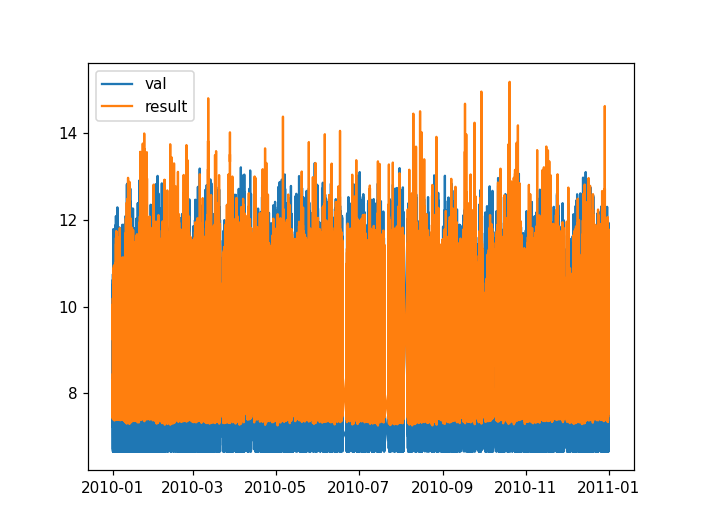

<IPython.core.display.Javascript object>


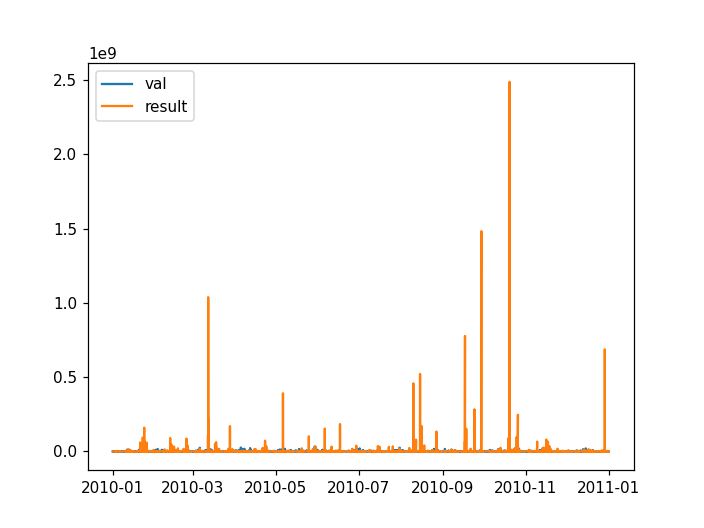

<IPython.core.display.Javascript object>


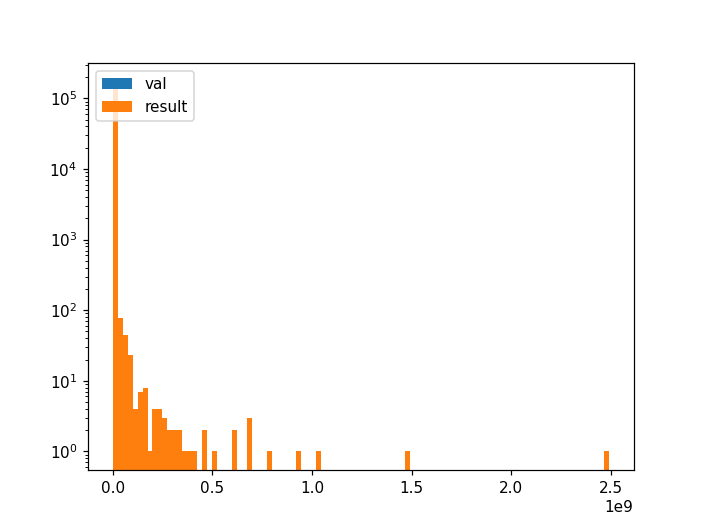

<IPython.core.display.Javascript object>


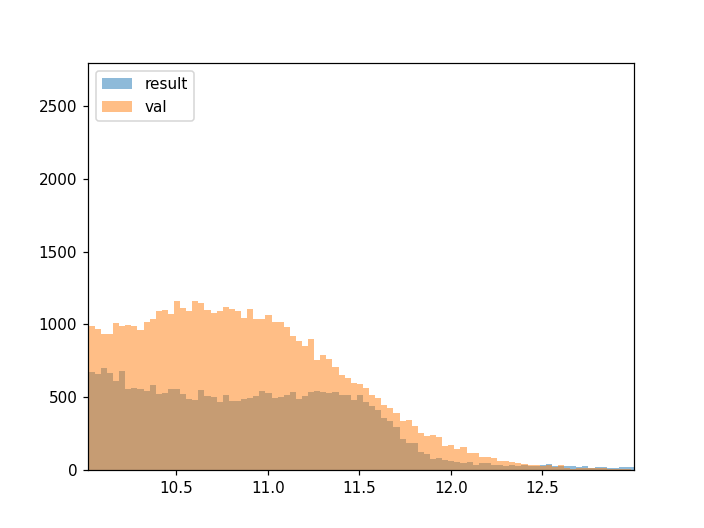

<IPython.core.display.Javascript object>


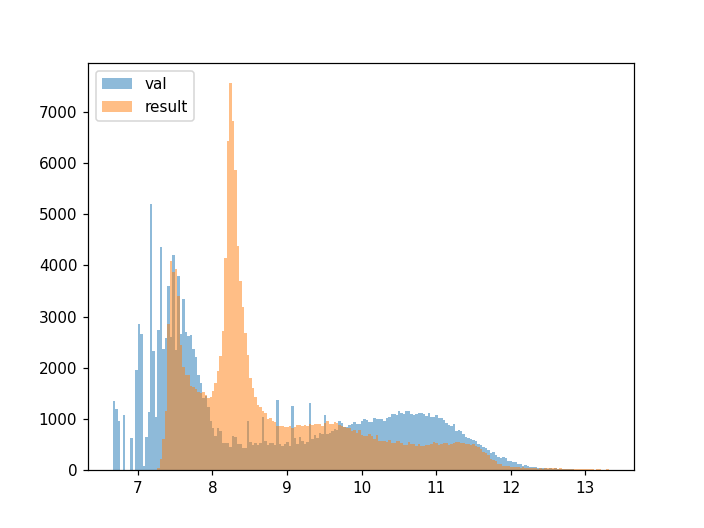

<IPython.core.display.Javascript object>


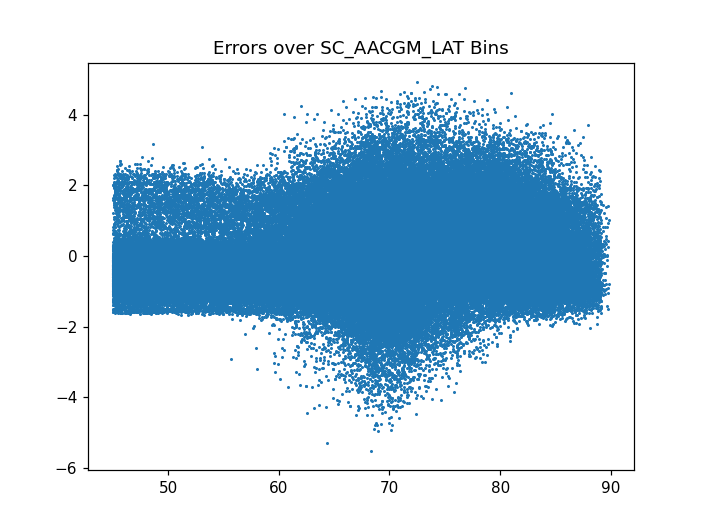

<IPython.core.display.Javascript object>


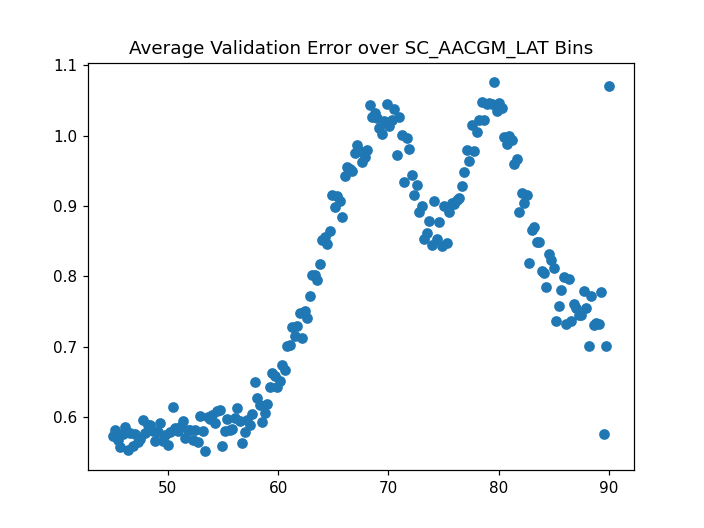

<IPython.core.display.Javascript object>


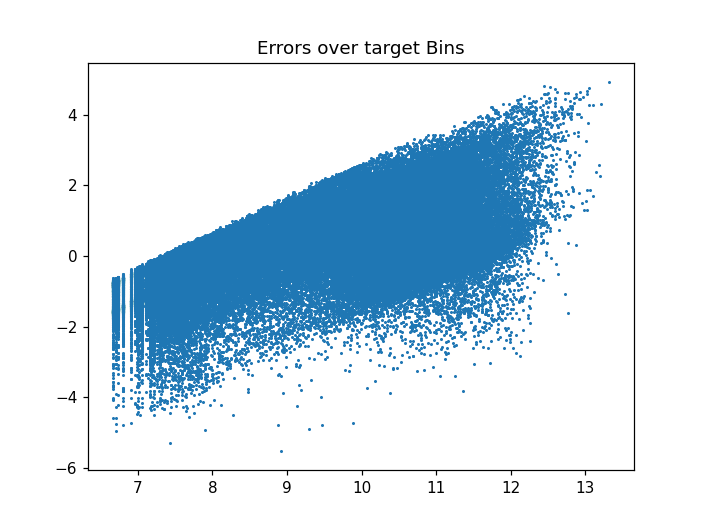

<IPython.core.display.Javascript object>


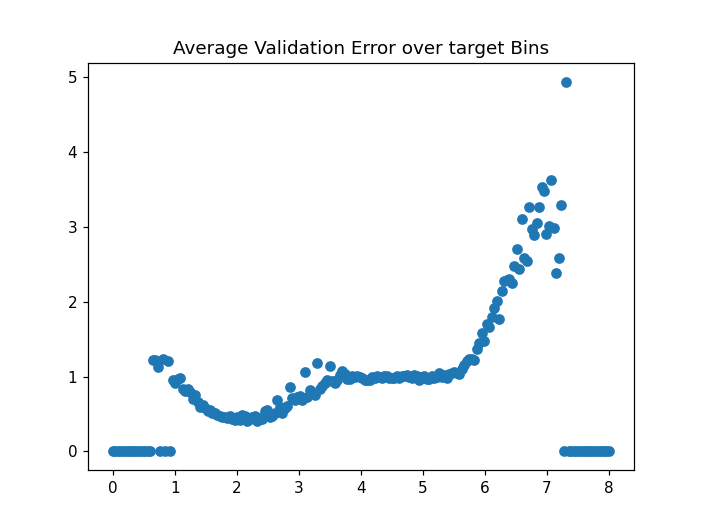

<IPython.core.display.Javascript object>


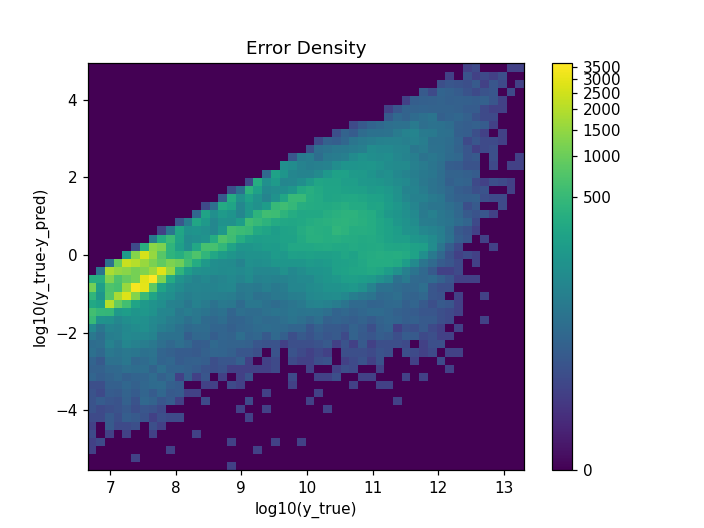

In [118]:
results = model.predict( XX_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)


plot_model(df_results)

NameError: name 'plot' is not defined